____
### THIS NOTEBOOK INCLUDES:
- CORRELATION MAP BETWEEN FEATURES IN 3 CATEGORIES:
    - Vitals
    - Labs
    - Apache
- FEATURE ENGINEERING | add in the following features: 
    - Difference bt MIN MAX
    - Difference bt 1st HR & 24HRs, 
    - PULSE
- FUNCTION FOR MODELING
- MODELING:
    - 1. LGB (WITHOUT SMOTE, SMOTE, TRY DIFFERENT FEATURES, ADJUST THRESHOLD)
    - 2. LOGISTIC REGRSSION (NON SMOTE, SMOTE, PCA, ADJUST THRESHOLD)
    - 3. CATBOOST (ADJUST THRESHOLD)
    - 4. NEURAL NETWORK (WITH PCA,  ADJUST THRESHOLD)

For Catboost and LGB, the best model will also includes Shapely Explanator for feature importance
____

### Import Libraries

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objs as go
from plotly import tools
import matplotlib.pyplot as plt
sns.set(style="whitegrid")
%matplotlib inline

import datetime, warnings, scipy 
import matplotlib as mpl
import matplotlib.patches as patches
from matplotlib import pyplot
from matplotlib.patches import ConnectionPatch
from collections import OrderedDict
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit
from collections import Counter
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor = 'dimgray', linewidth=1)

# sklearn
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import LabelEncoder
import lightgbm
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import brier_score_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import RandomizedSearchCV

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

import tensorflow as tf
import itertools
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,f1_score
import matplotlib.pyplot as plt
from keras.layers import Input,Dropout,Dense
from keras.models import Model
from keras import regularizers
from keras.utils.data_utils import get_file
from pylab import rcParams
from sklearn.metrics import mean_squared_error
import h5py
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras import regularizers

# warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Set standard parameters
pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', -1)

In [2]:
from google.colab import drive
drive.mount("/content/drive/", force_remount=True)
!ls "/content/drive/My Drive"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/
Deep_Learning_Project  Healthcare  ML_Project


### Import data

In [3]:
df = pd.read_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/df_fe_0310.csv', index_col = 0)
dictionary = pd.read_csv('/content/drive/My Drive/Healthcare/Data/WiDS Datathon 2020 Dictionary.csv')
df.head(2)

,hospital_id,patient_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_invasive_max,h1_diasbp_invasive_min,h1_diasbp_max,h1_diasbp_min,h1_diasbp_noninvasive_max,h1_diasbp_noninvasive_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,missing_features,num_disease
0,118,25312,0,68.0,22.7,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.5,73.9,2.3,113.0,502.0,0,0.0,0.4,31.0,2.5,nan,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,nan,nan,nan,nan,36.0,134.0,39.3,nan,0.0,14.1,68.0,37.0,119.0,72.0,89.0,46.0,34.0,10.0,100.0,74.0,131.0,73.0,39.9,37.2,nan,nan,68.0,63.0,68.0,63.0,119.0,108.0,86.0,85.0,26.0,18.0,100.0,74.0,131.0,115.0,39.5,37.5,2.3,2.3,0.4,0.4,31.0,30.0,8.5,7.4,2.5,2.2,168.0,109.0,19.0,15.0,8.9,8.9,27.4,27.4,nan,nan,1.3,1.0,233.0,233.0,4.0,3.4,136.0,134.0,14.1,14.1,nan,nan,nan,nan,18.0,18.0,7.9,7.9,0.8,0.8,108.0,108.0,22.0,22.0,9.7,9.7,30.0,35.0,nan,nan,nan,nan,20.0,20.0,4.1,4.1,136.0,136.0,1.1,1.1,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.1,0.1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,60,1.0
1,81,59342,0,77.0,27.4,0,Caucasian,F,160.0,Floor,Floor,90,admit,Med-Surg ICU,0.9,70.2,1.6,108.0,203.0,0,0.0,0.5,9.0,0.6,1.0,1.0,3.0,0.0,1.0,145.0,120.0,36.9,0.0,46.0,37.0,37.0,51.0,7.5,33.0,145.0,35.1,nan,1.0,12.7,95.0,31.0,118.0,72.0,120.0,38.0,32.0,12.0,100.0,70.0,159.0,67.0,36.3,35.1,nan,nan,61.0,48.0,61.0,48.0,114.0,100.0,85.0,57.0,31.0,28.0,95.0,70.0,95.0,71.0,36.3,36.3,1.6,1.6,0.5,0.5,11.0,9.0,8.6,8.0,0.7,0.6,145.0,128.0,27.0,26.0,11.3,11.1,36.9,36.1,1.3,1.3,3.5,3.5,557.0,487.0,4.2,3.8,145.0,145.0,23.3,12.7,nan,nan,nan,nan,9.0,9.0,8.6,8.6,0.6,0.6,145.0,143.0,27.0,27.0,11.3,11.3,36.9,36.9,1.3,1.3,3.5,3.5,557.0,557.0,4.2,4.2,145.0,145.0,12.7,12.7,37.0,37.0,7.5,7.5,51.0,51.0,54.8,51.0,37

In [0]:
df.loc[df['pre_icu_los_days']<0,'pre_icu_los_days'] =0
df.drop(columns=['h1_diasbp_invasive_max', 'h1_diasbp_invasive_min', 'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasive_min'], inplace = True)

### I.CONVERT TO CATEGORICAL TYPE

In [0]:
comorbidity =['cirrhosis','diabetes_mellitus','hepatic_failure','immunosuppression','leukemia','lymphoma','solid_tumor_with_metastasis','elective_surgery','aids']
for i in comorbidity:
  df[i]=df[i].astype('category')

demo = ['ethnicity','gender','hospital_admit_source','icu_stay_type','icu_admit_source','icu_type'] 
for i in demo:
  df[i]=df[i].astype('category')


gcs = ['gcs_eyes_apache','gcs_motor_apache','gcs_verbal_apache','gcs_unable_apache']
for i in gcs:
  df[i]=df[i].astype('category')


for i in ['intubated_apache','arf_apache','ventilated_apache']:
  df[i]=df[i].astype('category')

df['apache_3j_bodysystem'] =df['apache_3j_bodysystem'].astype('category')
df['apache_3j_diagnosis'] =df['apache_3j_diagnosis'].astype('category')
df['apache_post_operative'] =df['apache_post_operative'].astype('category')

In [6]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 91713 entries, 0 to 91712
Data columns (total 161 columns):
hospital_id                      int64
patient_id                       int64
hospital_death                   int64
age                              float64
bmi                              float64
elective_surgery                 category
ethnicity                        category
gender                           category
height                           float64
hospital_admit_source            category
icu_admit_source                 category
icu_id                           int64
icu_stay_type                    category
icu_type                         category
pre_icu_los_days                 float64
weight                           float64
albumin_apache                   float64
apache_2_diagnosis               float64
apache_3j_diagnosis              category
apache_post_operative            category
arf_apache                       category
bilirubin_apache           

____
### II.CORRELATION MATRIX

#### 2.1 Vitals

In [0]:
vital_cols = ['d1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_resprate_max',
 'h1_resprate_min',
 'h1_spo2_max',
 'h1_spo2_min',
 'h1_sysbp_max',
 'h1_sysbp_min',
 'h1_temp_max',
 'h1_temp_min',
 'missing_features',
 'num_disease']
vital_cols.append('hospital_death')
vitals = df[vital_cols]

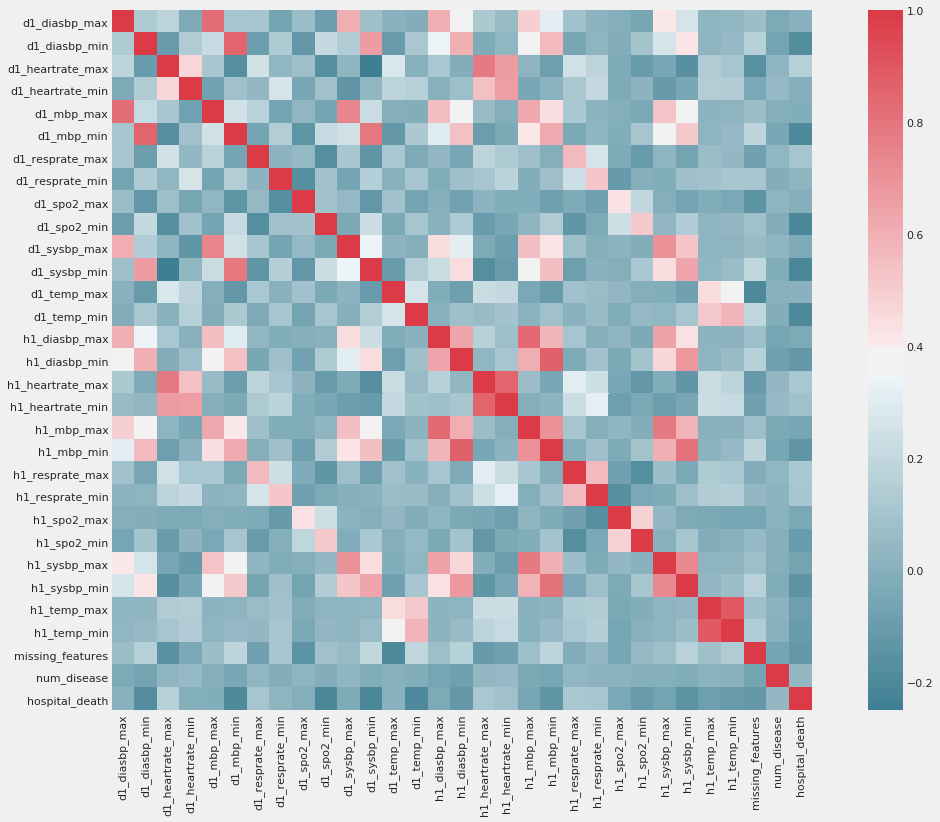

In [0]:
#heat map to check the correlation
f, ax = plt.subplots(figsize=(18, 12))
corr = vitals.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

#### 2.2 Labs

In [0]:
lab_cols = ['d1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max',
 'd1_inr_min',
 'd1_lactate_max',
 'd1_lactate_min',
 'd1_platelets_max',
 'd1_platelets_min',
 'd1_potassium_max',
 'd1_potassium_min',
 'd1_sodium_max',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'h1_albumin_max',
 'h1_albumin_min',
 'h1_bilirubin_max',
 'h1_bilirubin_min',
 'h1_bun_max',
 'h1_bun_min',
 'h1_calcium_max',
 'h1_calcium_min',
 'h1_creatinine_max',
 'h1_creatinine_min',
 'h1_glucose_max',
 'h1_glucose_min',
 'h1_hco3_max',
 'h1_hco3_min',
 'h1_hemaglobin_max',
 'h1_hemaglobin_min',
 'h1_hematocrit_max',
 'h1_hematocrit_min',
 'h1_inr_max',
 'h1_inr_min',
 'h1_lactate_max',
 'h1_lactate_min',
 'h1_platelets_max',
 'h1_platelets_min',
 'h1_potassium_max',
 'h1_potassium_min',
 'h1_sodium_max',
 'h1_sodium_min',
 'h1_wbc_max',
 'h1_wbc_min',
 'd1_arterial_pco2_max',
 'd1_arterial_pco2_min',
 'd1_arterial_ph_max',
 'd1_arterial_ph_min',
 'd1_arterial_po2_max',
 'd1_arterial_po2_min',
 'd1_pao2fio2ratio_max',
 'd1_pao2fio2ratio_min',
 'h1_arterial_pco2_max',
 'h1_arterial_pco2_min',
 'h1_arterial_ph_max',
 'h1_arterial_ph_min',
 'h1_arterial_po2_max',
 'h1_arterial_po2_min',
 'h1_pao2fio2ratio_max',
 'h1_pao2fio2ratio_min']
lab_cols.append('hospital_death')
labs = df[lab_cols]

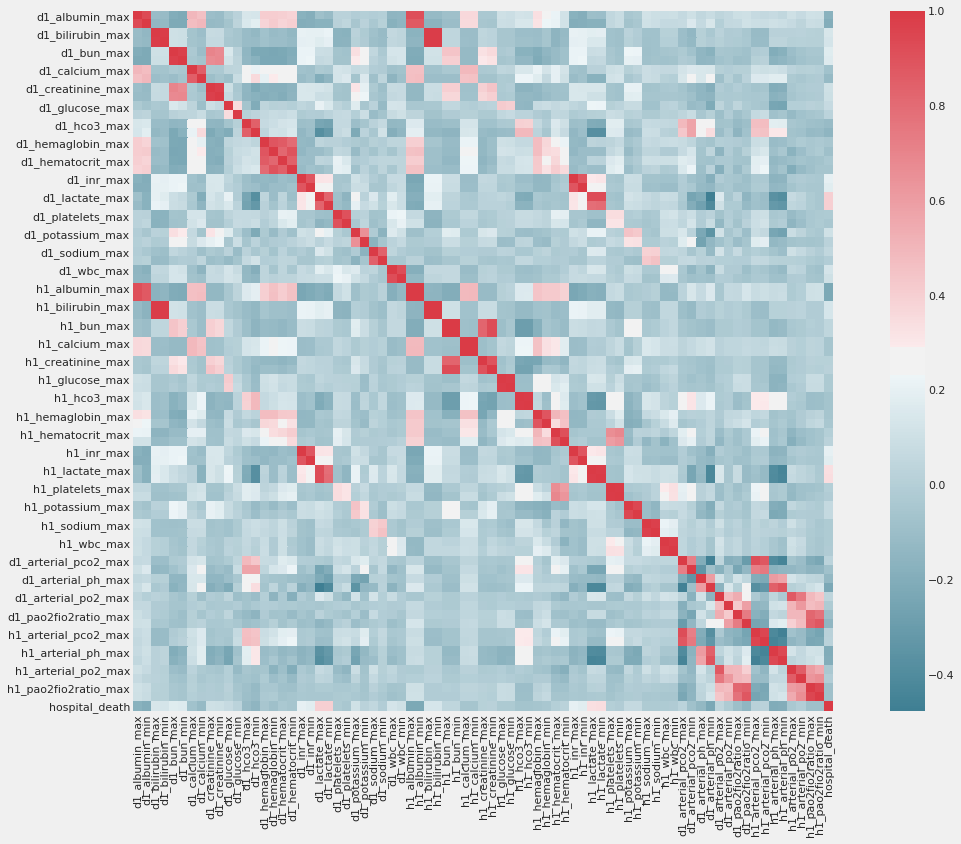

In [0]:
#heat map to check the correlation
f, ax = plt.subplots(figsize=(18, 12))
corr = labs.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

#### 2.3 apache

In [0]:
apache_cols = [
 'elective_surgery',
 'pre_icu_los_days',
 'albumin_apache',
 'apache_post_operative',
 'arf_apache',
 'bilirubin_apache',
 'bun_apache',
 'creatinine_apache',
 'fio2_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_unable_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'intubated_apache',
 'map_apache',
 'paco2_apache',
 'paco2_for_ph_apache',
 'pao2_apache',
 'ph_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_resprate_max',
 'h1_resprate_min',
 'h1_spo2_max',
 'h1_spo2_min',
 'h1_sysbp_max',
 'h1_sysbp_min',
 'h1_temp_max',
 'h1_temp_min',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max',
 'd1_inr_min',
 'd1_lactate_max',
 'd1_lactate_min',
 'd1_platelets_max',
 'd1_platelets_min',
 'd1_potassium_max',
 'd1_potassium_min',
 'd1_sodium_max',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min']
apache_cols.append('hospital_death')
apache = df[apache_cols]

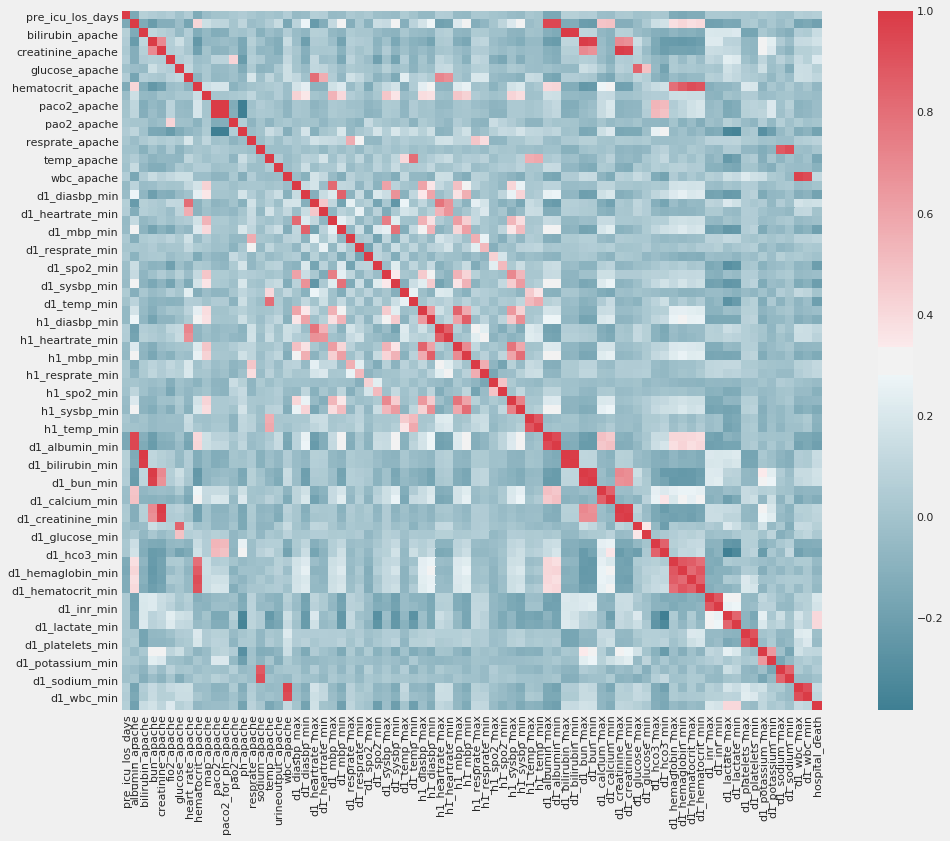

In [0]:
#heat map to check the correlation
f, ax = plt.subplots(figsize=(18, 12))
corr = apache.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

### III. ADD IN FLUCTUTAION: DIFF MAX VS MIN

#### 3.1 Add in diff: max - min : 1st 24hrs

In [0]:
cols = [c for c in df.columns if (c.lower()[:2] == 'd1')]
f_24hour_max=cols[::2]
f_24hour_min=cols[1::2]

for i in range(0,len(f_24hour_min)):
  df["_".join(["diff_d1"]+f_24hour_min[i].split("_")[1:-1:]+["max_min"])]=df[f_24hour_max[i]]-df[f_24hour_min[i]]

#### 3.2 Add in diff: max - min : 1st hour

In [0]:
h_cols = [c for c in df.columns if (c.lower()[:2] == 'h1')]
f_hour_max=h_cols[::2]
f_hour_min=h_cols[1::2]

for i in range(0,len(f_hour_min)):
  df["_".join(["diff_h1"]+f_hour_min[i].split("_")[1:-1:]+["max_min"])]=df[f_hour_max[i]]-df[f_hour_min[i]]

#### 3.3 Check correlation of 'diff' features

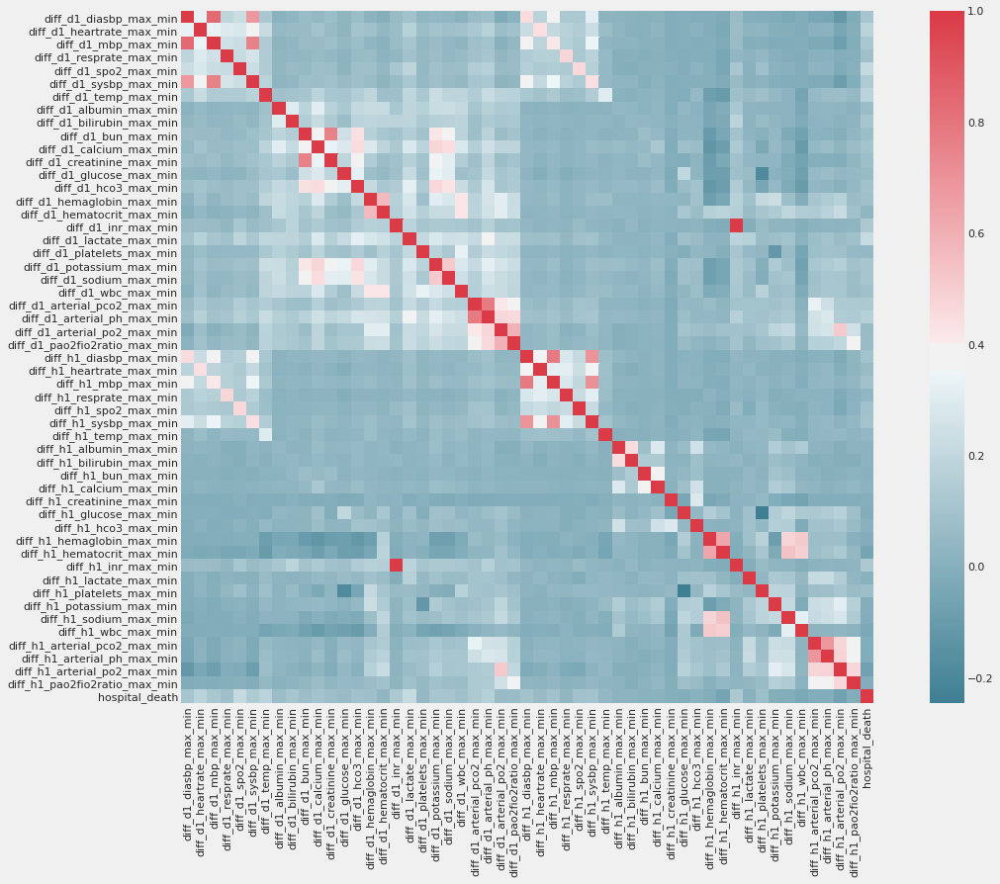

In [9]:
diff_cols = [c for c in df.columns if (c.lower()[:4] == 'diff')]
diff_cols.append('hospital_death')
diff = df[diff_cols]


#heat map to check the correlation
f, ax = plt.subplots(figsize=(18, 12))
corr = diff.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

#### 3.4 Add in pulse_pressure

In [0]:
df["pulse_pressure_min"]=df["d1_sysbp_min"]-df["d1_diasbp_min"]
df["pulse_pressure_max"]=df["d1_sysbp_max"]-df["d1_diasbp_max"]
df["diff_pulse_max_min"]=df["pulse_pressure_max"]-df["pulse_pressure_min"]

In [11]:
df.head(2)

,hospital_id,patient_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,missing_features,num_disease,diff_d1_diasbp_max_min,diff_d1_heartrate_max_min,diff_d1_mbp_max_min,diff_d1_resprate_max_min,diff_d1_spo2_max_min,diff_d1_sysbp_max_min,diff_d1_temp_max_min,diff_d1_albumin_max_min,diff_d1_bilirubin_max_min,diff_d1_bun_max_min,diff_d1_calcium_max_min,diff_d1_creatinine_max_min,diff_d1_glucose_max_min,diff_d1_hco3_max_min,diff_d1_hemaglobin_max_min,diff_d1_hematocrit_max_min,diff_d1_inr_max_min,diff_d1_lactate_max_min,diff_d1_platelets_max_min,diff_d1_potassium_max_min,diff_d1_sodium_max_min,diff_d1_wbc_max_min,diff_d1_arterial_pco2_max_min,diff_d1_arterial_ph_max_min,diff_d1_arterial_po2_max_min,diff_d1_pao2fio2ratio_max_min,diff_h1_diasbp_max_min,diff_h1_heartrate_max_min,diff_h1_mbp_max_min,diff_h1_resprate_max_min,diff_h1_spo2_max_min,diff_h1_sysbp_max_min,diff_h1_temp_max_min,diff_h1_albumin_max_min,diff_h1_bilirubin_max_min,diff_h1_bun_max_min,diff_h1_calcium_max_min,diff_h1_creatinine_max_min,diff_h1_glucose_max_min,diff_h1_hco3_max_min,diff_h1_hemaglobin_max_min,diff_h1_hematocrit_max_min,diff_h1_inr_max_min,diff_h1_lactate_max_min,diff_h1_platelets_max_min,diff_h1_potassium_max_min,diff_h1_sodium_max_min,diff_h1_wbc_max_min,diff_h1_arterial_pco2_max_min,diff_h1_arterial_ph_max_min,diff_h1_arterial_po2_max_min,diff_h1_pao2fio2ratio_max_min,pulse_pressure_min,pulse_pressure_max,diff_pulse_max_min
0,118,25312,0,68.0,22.7,0,Caucasian,M,180.3,Floor,Floor,92,admit,CTICU,0.5,73.9,2.3,113.0,502.0,0,0.0,0.4,31.0,2.5,nan,3.0,6.0,0.0,4.0,168.0,118.0,27.4,0.0,40.0,nan,nan,nan,nan,36.0,134.0,39.3,nan,0.0,14.1,68.0,37.0,119.0,72.0,89.0,46.0,3

In [12]:
df_corr=df[['pulse_pressure_min', 'pulse_pressure_max', 'diff_pulse_max_min','diff_d1_diasbp_max_min', 'diff_d1_sysbp_max_min', 'diff_d1_mbp_max_min']].corr()
df_corr

,pulse_pressure_min,pulse_pressure_max,diff_pulse_max_min,diff_d1_diasbp_max_min,diff_d1_sysbp_max_min,diff_d1_mbp_max_min
pulse_pressure_min,1.0,0.4,-0.3,-0.0,-0.3,-0.1
pulse_pressure_max,0.4,1.0,0.7,-0.2,0.4,-0.0
diff_pulse_max_min,-0.3,0.7,1.0,-0.2,0.6,0.1
diff_d1_diasbp_max_min,-0.0,-0.2,-0.2,1.0,0.7,0.8
diff_d1_sysbp_max_min,-0.3,0.4,0.6,0.7,1.0,0.8
diff_d1_mbp_max_min,-0.1,-0.0,0.1,0.8,0.8,1.0


___
#### 3.5 Add diff 1hr - 24hr
___

In [0]:
for i in range(0,len(f_hour_max)):
  df["_".join(["diff_max"]+f_hour_max[i].split("_")[1:-1:]+["24hr_1hr"])]=df[f_24hour_max[i]]-df[f_hour_max[i]]

for i in range(0,len(f_hour_min)):
  df["_".join(["diff_min"]+f_hour_min[i].split("_")[1:-1:]+["24hr_1hr"])]=df[f_24hour_min[i]]-df[f_hour_min[i]]

In [14]:
df.head(2)

,hospital_id,patient_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,bilirubin_apache,bun_apache,creatinine_apache,fio2_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,glucose_apache,heart_rate_apache,hematocrit_apache,intubated_apache,map_apache,paco2_apache,paco2_for_ph_apache,pao2_apache,ph_apache,resprate_apache,sodium_apache,temp_apache,urineoutput_apache,ventilated_apache,wbc_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,h1_diasbp_max,h1_diasbp_min,h1_heartrate_max,h1_heartrate_min,h1_mbp_max,h1_mbp_min,h1_resprate_max,h1_resprate_min,h1_spo2_max,h1_spo2_min,h1_sysbp_max,h1_sysbp_min,h1_temp_max,h1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,h1_albumin_max,h1_albumin_min,h1_bilirubin_max,h1_bilirubin_min,h1_bun_max,h1_bun_min,h1_calcium_max,h1_calcium_min,h1_creatinine_max,h1_creatinine_min,h1_glucose_max,h1_glucose_min,h1_hco3_max,h1_hco3_min,h1_hemaglobin_max,h1_hemaglobin_min,h1_hematocrit_max,h1_hematocrit_min,h1_inr_max,h1_inr_min,h1_lactate_max,h1_lactate_min,h1_platelets_max,h1_platelets_min,h1_potassium_max,h1_potassium_min,h1_sodium_max,h1_sodium_min,h1_wbc_max,h1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,h1_arterial_pco2_max,h1_arterial_pco2_min,h1_arterial_ph_max,h1_arterial_ph_min,h1_arterial_po2_max,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,missing_features,num_disease,diff_d1_diasbp_max_min,diff_d1_heartrate_max_min,diff_d1_mbp_max_min,diff_d1_resprate_max_min,diff_d1_spo2_max_min,diff_d1_sysbp_max_min,diff_d1_temp_max_min,diff_d1_albumin_max_min,diff_d1_bilirubin_max_min,diff_d1_bun_max_min,diff_d1_calcium_max_min,diff_d1_creatinine_max_min,diff_d1_glucose_max_min,diff_d1_hco3_max_min,diff_d1_hemaglobin_max_min,diff_d1_hematocrit_max_min,diff_d1_inr_max_min,diff_d1_lactate_max_min,diff_d1_platelets_max_min,diff_d1_potassium_max_min,diff_d1_sodium_max_min,diff_d1_wbc_max_min,diff_d1_arterial_pco2_max_min,diff_d1_arterial_ph_max_min,diff_d1_arterial_po2_max_min,diff_d1_pao2fio2ratio_max_min,diff_h1_diasbp_max_min,diff_h1_heartrate_max_min,diff_h1_mbp_max_min,diff_h1_resprate_max_min,diff_h1_spo2_max_min,diff_h1_sysbp_max_min,diff_h1_temp_max_min,diff_h1_albumin_max_min,diff_h1_bilirubin_max_min,diff_h1_bun_max_min,diff_h1_calcium_max_min,diff_h1_creatinine_max_min,diff_h1_glucose_max_min,diff_h1_hco3_max_min,diff_h1_hemaglobin_max_min,diff_h1_hematocrit_max_min,diff_h1_inr_max_min,diff_h1_lactate_max_min,diff_h1_platelets_max_min,diff_h1_potassium_max_min,diff_h1_sodium_max_min,diff_h1_wbc_max_min,diff_h1_arterial_pco2_max_min,diff_h1_arterial_ph_max_min,diff_h1_arterial_po2_max_min,diff_h1_pao2fio2ratio_max_min,pulse_pressure_min,pulse_pressure_max,diff_pulse_max_min,diff_max_diasbp_24hr_1hr,diff_max_heartrate_24hr_1hr,diff_max_mbp_24hr_1hr,diff_max_resprate_24hr_1hr,diff_max_spo2_24hr_1hr,diff_max_sysbp_24hr_1hr,diff_max_temp_24hr_1hr,diff_max_albumin_24hr_1hr,diff_max_bilirubin_24hr_1hr,diff_max_bun

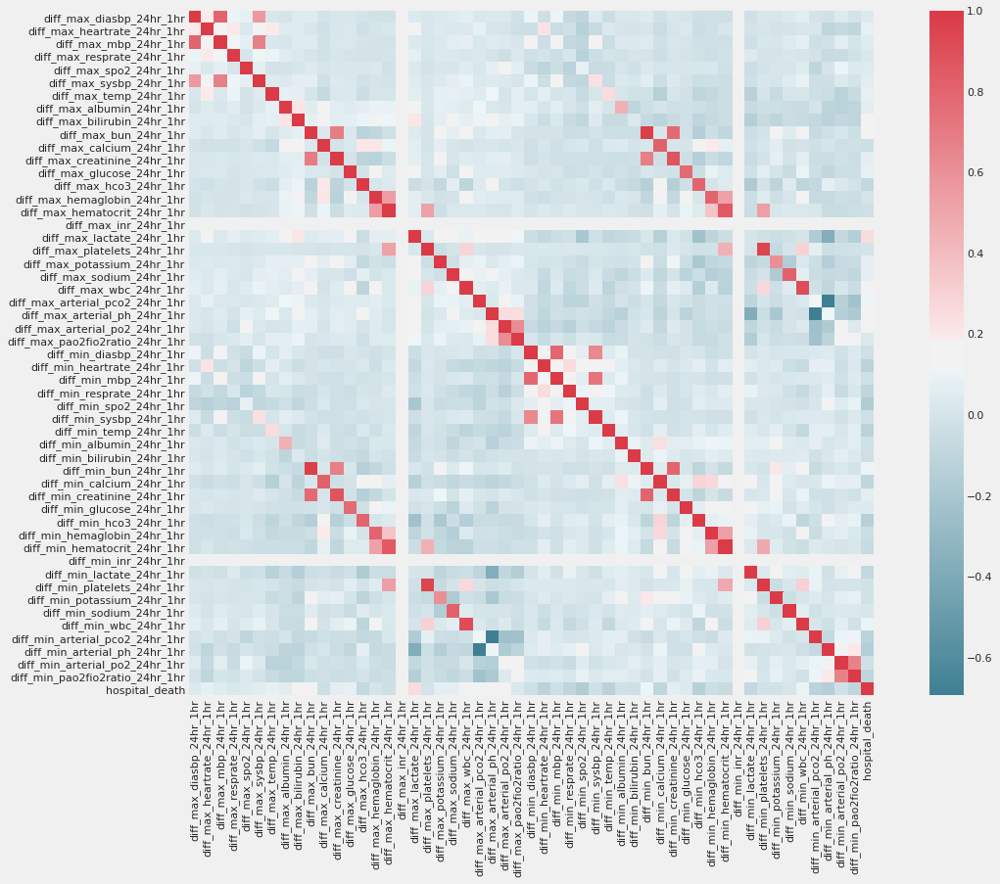

In [15]:
diff_hours = [c for c in df.columns[df.columns.str.endswith("24hr_1hr")]]
diff_hours.append('hospital_death')
diff_h = df[diff_hours]


#heat map to check the correlation
f, ax = plt.subplots(figsize=(18, 12))
corr = diff_h.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

___
### IV. CREATE DATASET

Since we will try different subsets of the features. Therefore, it is better to create different versions of data for modeling

#### 4.1 Without d1 and h1 columns

In [0]:
# Drop any features startwith h1 or d1
hd_drop = df.columns[(df.columns.str.startswith("h1")) | (df.columns.str.startswith("d1"))].tolist()
df_wt_hd = df.drop(hd_drop,1)
# df_wt_hd.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/df_wt_hd.csv')

#### 4.2 Drop some of the apache columns

In [0]:
apache_drop = df.columns[df.columns.str.endswith("apache")].tolist()
keep = {'gcs_eyes_apache','gcs_motor_apache','gcs_unable_apache','gcs_verbal_apache',
        'map_apache','arf_apache','urineoutput_apache','ventilated_apache','intubated_apache'}
drop_cols = [x for x in apache_drop if x not in keep] 
df_wt_apache = df.drop(drop_cols,1)
# df_wt_apache.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/df_wt_apache.csv')

In [0]:
# df.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/df_impute_Tam.csv')

#### 4.3 Without hd and apache

In [0]:
wt_hd_apache = df_wt_hd.drop(drop_cols,1)
# wt_hd_apache.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/wt_hd_apache.csv')

#### 4.4 Without 1st hour

In [0]:
# Drop any features startwith h1 or d1
h_drop = df.columns[(df.columns.str.startswith("h1"))].tolist()
df_wt_h = df.drop(h_drop,1)

In [0]:
apache_drop = df_wt_h.columns[df_wt_h.columns.str.endswith("apache")].tolist()
keep = {'gcs_eyes_apache','gcs_motor_apache','gcs_unable_apache','gcs_verbal_apache',
        'map_apache','arf_apache','urineoutput_apache','ventilated_apache','intubated_apache'}
drop_cols = [x for x in apache_drop if x not in keep] 
df_wt_h = df_wt_h.drop(drop_cols,1)

___
### V.FUNCTION FOR MODELING

- SPLIT DATA 
- RUN LGB MODEL
- PLOT FEATURE_IMPORTANCE_LGB 
- CONFUSION MATRIX 
- FEATURE IMPORTANCE FOR LGB
- CROSS VALIDATION FOR LOGISTIC REGRESSION
- FEATURE IMPORTANCE FOR LOGISTIC REGRESSION

In [0]:
def split_data(df, cols):
    X = df[cols]
    y = df['hospital_death']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)

    cat_cols =  X_train.select_dtypes(include='category').columns.values.tolist()
    for col in cat_cols: 
        if col in X_train.columns: 
            le = LabelEncoder() 
            le.fit(list(X_train[col].astype(str).values) + list(X_test[col].astype(str).values)) 
            X_train[col] = le.transform(list(X_train[col].astype(str).values)) 
            X_test[col] = le.transform(list(X_test[col].astype(str).values))

    # Check predictor percentage 
    stratify = {
        'total': pd.Series(y),
        'train': pd.Series(y_train),
        'test': pd.Series(y_test)
    }

    display(pd.DataFrame(stratify).apply(pd.value_counts).apply(lambda col: col/col.sum()*100))
    return X_train, X_test, y_train, y_test 

In [0]:
def run_lgb(X_train, X_test,y_train):

    # Parameters
    params = {"objective": "binary", 
            "boosting": "goss",
        #   "class_weight": 'balanced',
            "metric": "auc",
             "n_jobs":-1,
            "verbose":-1}

    num_folds = 10
    roc_auc = list()
    feature_importances = pd.DataFrame()
    feature_importances['feature'] = X_train.columns
    pred_on_test = np.zeros(X_test.shape[0])


    kf = StratifiedKFold(n_splits=num_folds,shuffle=True, random_state=911)
    for index, (train_index, valid_index) in enumerate(kf.split(X=X_train,y=y_train)):
        print(f"FOLD {index+1}")

        X_train_fold, y_train_fold = X_train.iloc[train_index], y_train.iloc[train_index]
        X_valid_fold, y_valid_fold = X_train.iloc[valid_index], y_train.iloc[valid_index]

        dtrain = lightgbm.Dataset(X_train_fold, label=y_train_fold)
        dvalid = lightgbm.Dataset(X_valid_fold, label=y_valid_fold)

        lgb = lightgbm.train(params=params, train_set=dtrain, num_boost_round=2000, 
                         valid_sets=[dtrain, dvalid], verbose_eval=250, early_stopping_rounds=500)

        feature_importances[f'fold_{index + 1}'] = lgb.feature_importance()

        y_valid_pred = (lgb.predict(X_valid_fold,num_iteration=lgb.best_iteration))
        pred_on_test += (lgb.predict(X_test,num_iteration=lgb.best_iteration)) / num_folds

        # winsorization
        y_valid_pred = np.clip(a=y_valid_pred, a_min=0, a_max=1)
        pred_on_test = np.clip(a=pred_on_test, a_min=0, a_max=1)

        print(f"FOLD {index+1}: ROC_AUC  => {np.round(roc_auc_score(y_true=y_valid_fold, y_score=y_valid_pred),5)}")
        roc_auc.append(roc_auc_score(y_true=y_valid_fold, y_score=y_valid_pred)/num_folds)
    
        print(f"Mean roc_auc for {num_folds} folds: {np.round(sum(roc_auc),5)}")
    return  pred_on_test, feature_importances, lgb, kf

In [0]:
def plot_feature_importance(df, k_fold_object):  
    df['average_feature_imp'] = df[['fold_{}'.format(fold + 1) for fold in range(k_fold_object.n_splits)]].mean(axis=1)
    plt.figure(figsize=(10, 40))
    sns.barplot(data=df.sort_values(by='average_feature_imp', ascending=False), x='average_feature_imp', y='feature');
    plt.title('Feature importance over {} folds average'.format(k_fold_object.n_splits))
    plt.show()  

In [0]:
def matrix_report(y_test, pred_on_test, X_train, y_train, threshold):
    y_pred_test = pred_on_test.copy()
    print('probability_distribution')
    sns.distplot(y_pred_test)
    plt.show()
    print('\n')
    

    for i in range(0,len(y_pred_test)):
        if y_pred_test[i]>= threshold:       
            y_pred_test[i]=1
        else:  
            y_pred_test[i]=0

    confusion_matrix_test =  metrics.confusion_matrix(y_test, y_pred_test.ravel())
    sns.heatmap(confusion_matrix_test, cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='white', linewidths=1, annot=True, fmt='d')
    plt.title("Classification Matrix_Test", fontsize = 15)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print('\n')    
    print("ROC_AUC score_Test:",roc_auc_score(y_true=y_test,y_score=pred_on_test))
    print('Brier_Score_Test: ',brier_score_loss(y_test,pred_on_test))
    print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred_test),3))
    print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred_test))
    print('------'*15)

    '''Print out Train Results'''
    pred_train = lgb.predict(X_train)
    y_pred_train = pred_train.copy()
    print('probability_distribution_TRAIN')
    sns.distplot(y_pred_train)
    plt.show()
    print('\n')

    print('\n')
    for i in range(0,len(y_pred_train)):
        if y_pred_train[i]>= threshold:       
            y_pred_train[i]=1
        else:  
            y_pred_train[i]=0
    
    confusion_matrix_train =  metrics.confusion_matrix(y_train, y_pred_train.ravel())
    sns.heatmap(confusion_matrix_train, cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='white', linewidths=1, annot=True, fmt='d')
    plt.title("Classification Matrix_Train", fontsize = 15)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    print('\n') 
    print("ROC_AUC score_Train:",roc_auc_score(y_true=y_train,y_score=pred_train))
    print("Brier_Score_Train:",brier_score_loss(y_train,pred_train))
    print("Accuracy Score_Train:", round(metrics.accuracy_score(y_train, y_pred_train),3))
    print("Classification Report_Train:\n",metrics.classification_report(y_train,y_pred_train))
    print('------'*15)

    '''PR Curve'''
    print('PR curve on test')
    precision, recall, _ = precision_recall_curve(y_test, pred_on_test)
    # plot the model precision-recall curve
    pyplot.plot(recall, precision, marker='.', label='LGB')
    # axis labels
    pyplot.xlabel('Recall')
    pyplot.ylabel('Precision')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show()
    print('\n') 
    
    '''AUC Curve'''
    from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
    fpr, tpr, thresholds = roc_curve(y_test, pred_on_test)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6,6))
    plt.title('Receiver operating characteristic (ROC)| Test')
    plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'o--')
    plt.xlim([-0.01, 1])
    plt.ylim([0, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show();


In [0]:
# Function to run model
def fit_predict_score(Model, X_train, y_train, X_test, y_test,threshold):
  with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    Model.fit(X_train, y_train)
    
    '''Print out Test Results'''
    y_pred_test = Model.predict_proba(X_test)[:,1]
    print('probability_distribution_test')
    sns.distplot(y_pred_test)
    plt.show()

    from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_test)
    print('ROC_AUC_test: ',auc(fpr, tpr))
    print('Brier_Score_test: ',brier_score_loss(y_test,y_pred_test))
    print('\n') 
    plt.figure(figsize=(6,6))
    plt.title('Receiver operating characteristic (ROC)| Test')
    plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc_score(y_true=y_test,y_score=y_pred_test))
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'o--')
    plt.xlim([-0.01, 1])
    plt.ylim([0, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show();

    '''Print out Train Results'''
    for i in range(0,len(y_pred_test)):
      if y_pred_test[i]>= threshold:
        y_pred_test[i]=1
      else:
        y_pred_test[i]=0
    print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred_test),3))
    print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred_test))
    df_label_names = [0,1]
    confusion_matrix_test =  metrics.confusion_matrix(y_test, y_pred_test.ravel())
    sns.heatmap(confusion_matrix_test, cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='white', linewidths=1, xticklabels=df_label_names, yticklabels=df_label_names, annot=True, fmt='d')
    plt.title("Classification Matrix_Test", fontsize = 15)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    print('\n')

    '''Print out Train Results'''
    y_pred_train = Model.predict_proba(X_train)[:,1]
    print('probability_distribution_train')
    sns.distplot(y_pred_train)
    plt.show()
    fpr, tpr, thresholds = roc_curve(y_train, y_pred_train)
    roc_auc = auc(fpr, tpr)
    print('ROC_AUC_train: ',auc(fpr, tpr))
    print('Brier_Score_train: ',brier_score_loss(y_train,y_pred_train))
    '''Print out Train Results'''
    for i in range(0,len(y_pred_train)):
      if y_pred_train[i]>= threshold:
        y_pred_train[i]=1
      else:
        y_pred_train[i]=0 

    print("Accuracy Score_Train:", round(metrics.accuracy_score(y_train, y_pred_train),3))
    print("Classification Report_Train:\n",metrics.classification_report(y_train,y_pred_train))
    

    confusion_matrix_train =  metrics.confusion_matrix(y_train, y_pred_train.ravel())
    sns.heatmap(confusion_matrix_train, cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='white', linewidths=1, xticklabels=df_label_names, yticklabels=df_label_names, annot=True, fmt='d')
    plt.title("Classification Matrix_Train", fontsize = 15)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

In [0]:
from sklearn.model_selection import cross_val_score

def print_accuracy_report(Model, X, y, num_validations=10):
    accuracy = cross_val_score(Model, 
            X, y, scoring='accuracy', cv=num_validations)
    print("Accuracy_CV:", accuracy)
    print("Accuracy_Mean: " + str(round(100*accuracy.mean(), 2)) + "%")

    f1 = cross_val_score(Model, 
            X, y, scoring='f1_weighted', cv=num_validations)
    print("F1_CV:", f1)
    print("F1_Mean: " + str(round(100*f1.mean(), 2)) + "%")

    precision = cross_val_score(Model, 
            X, y, scoring='precision_weighted', cv=num_validations)
    print("Precision_CV:", precision)
    print("Precision_Mean: " + str(round(100*precision.mean(), 2)) + "%")

    recall = cross_val_score(Model, 
            X, y, scoring='recall_weighted', cv=num_validations)
    print("Recall_CV:", recall)
    print("Recall_Mean: " + str(round(100*recall.mean(), 2)) + "%")

In [0]:
# CATBOOST
def matrix_report_cat(y_test, pred_on_test, X_train, y_train, threshold):
    y_pred_test = pred_on_test.copy()
    print('probability_distribution')
    sns.distplot(y_pred_test)
    plt.show()
    print('\n')
    

    for i in range(0,len(y_pred_test)):
        if y_pred_test[i]>= threshold:       
            y_pred_test[i]=1
        else:  
            y_pred_test[i]=0

    confusion_matrix_test =  metrics.confusion_matrix(y_test, y_pred_test.ravel())
    sns.heatmap(confusion_matrix_test, cmap=sns.diverging_palette(220, 10, as_cmap=True), linecolor='white', linewidths=1, annot=True, fmt='d')
    plt.title("Classification Matrix_Test", fontsize = 15)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    print('\n')    
    print("ROC_AUC score_Test:",roc_auc_score(y_true=y_test,y_score=pred_on_test))
    print('Brier_Score_Test: ',brier_score_loss(y_test,pred_on_test))
    print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred_test),3))
    print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred_test))
    print('------'*15)

    '''AUC Curve'''
    from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
    fpr, tpr, thresholds = roc_curve(y_test, pred_on_test)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6,6))
    plt.title('Receiver operating characteristic (ROC)| Test')
    plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'o--')
    plt.xlim([-0.01, 1])
    plt.ylim([0, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show();


In [0]:
def roc_auc_curve(y_test,pred_on_test):

    from sklearn.metrics import roc_curve, auc
    fpr, tpr, thresholds = roc_curve(pred_on_test, y_test)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6,6))
    plt.title('Receiver operating characteristic (ROC)| Test')
    plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'o--')
    plt.xlim([-0.01, 1])
    plt.ylim([0, 1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show();

In [0]:
def LR_feature_importance(LR, X_train):
    fi_cols = X_train.columns.tolist()
    feature_importances_LR =pd.DataFrame(data=abs(LR.coef_.transpose()),index=fi_cols)
    feature_importances_LR.rename(columns={0: "Coefficient"},inplace=True)
    feature_importances_LR['Importance']=np.round(feature_importances_LR['Coefficient']/feature_importances_LR['Coefficient'].sum()*100,4)
    feature_importances_LR.sort_values('Importance',ascending=False,inplace=True)
    feature_importances_LR['cumsum']=feature_importances_LR['Importance'].cumsum()
    display(feature_importances_LR.head(100))

____
### VI.LGB

#### 6.1 IMBALANCED DATASET | WITHOUT H1D1 AND SOME APACHE FEATURES

In [0]:
drop_cols = {'hospital_id', 'patient_id', 'apache_2_diagnosis', 'apache_3j_diagnosis', 'apache_4a_hospital_death_prob','apache_4a_icu_death_prob','icu_id', 'hospital_death'}

In [0]:
cols = [ x for x in wt_hd_apache.columns.tolist() if x not in drop_cols]
cols

In [0]:
X_train, X_test, y_train, y_test  = split_data(wt_hd_apache, cols)

,total,train,test
0.0,91.4,91.4,91.4
1.0,8.6,8.6,8.6


In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train, X_test,y_train)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985588	valid_1's auc: 0.89104
[500]	training's auc: 0.999059	valid_1's auc: 0.889483
Early stopping, best iteration is:
[192]	training's auc: 0.976035	valid_1's auc: 0.891757
FOLD 1: ROC_AUC  => 0.89176
Mean roc_auc for 10 folds: 0.08918
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985702	valid_1's auc: 0.878924
[500]	training's auc: 0.999121	valid_1's auc: 0.879782
Early stopping, best iteration is:
[107]	training's auc: 0.953051	valid_1's auc: 0.880749
FOLD 2: ROC_AUC  => 0.88075
Mean roc_auc for 10 folds: 0.17725
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.98657	valid_1's auc: 0.894231
[500]	training's auc: 0.999075	valid_1's auc: 0.892639
Early stopping, best iteration is:
[230]	training's auc: 0.983664	valid_1's auc: 0.894904
FOLD 3: ROC_AUC  => 0.8949
Mean roc_auc for 10 folds: 0.26674
FOLD

In [0]:
pred_on_test

array([0.01360295, 0.03033788, 0.00393906, ..., 0.01499761, 0.23847815,
       0.08724904])

probability_distribution


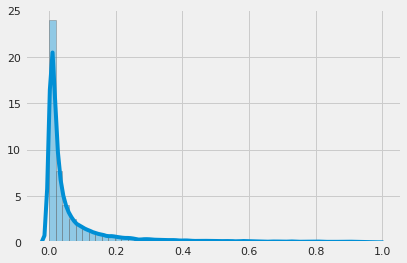

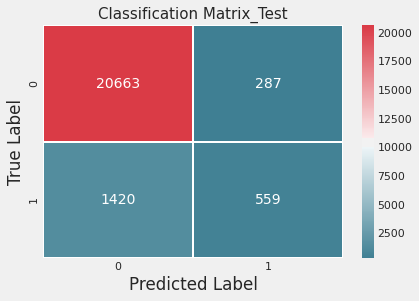



ROC_AUC score_Test: 0.8858060470259924
Brier_Score_Test:  0.05664110770919311
Accuracy Score_Test: 0.926
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.66      0.28      0.40      1979

    accuracy                           0.93     22929
   macro avg       0.80      0.63      0.68     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


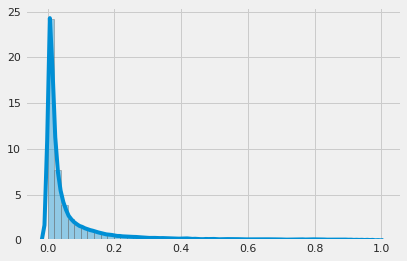

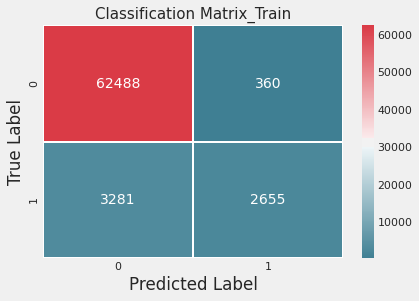



ROC_AUC score_Train: 0.9509407495078186
Brier_Score_Train: 0.04037596471641963
Accuracy Score_Train: 0.947
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.88      0.45      0.59      5936

    accuracy                           0.95     68784
   macro avg       0.92      0.72      0.78     68784
weighted avg       0.94      0.95      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


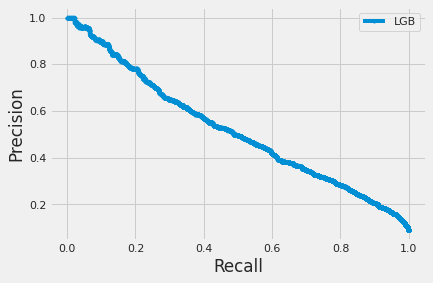

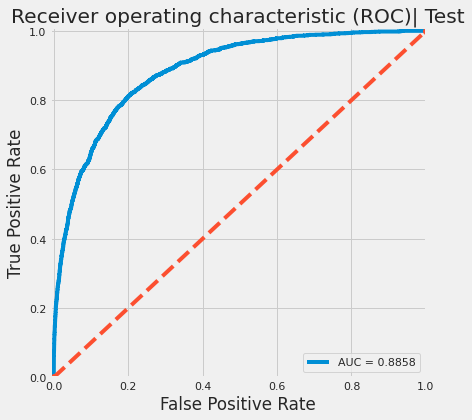

CPU times: user 3.65 s, sys: 214 ms, total: 3.86 s
Wall time: 3.13 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = 0.5)

__Adjust threshold__

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.2372758058765491

probability_distribution


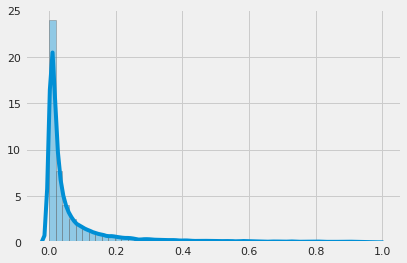

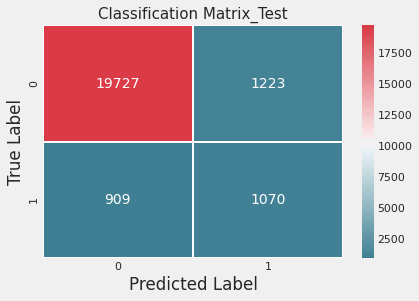



ROC_AUC score_Test: 0.8858060470259924
Brier_Score_Test:  0.05664110770919311
Accuracy Score_Test: 0.907
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.72     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


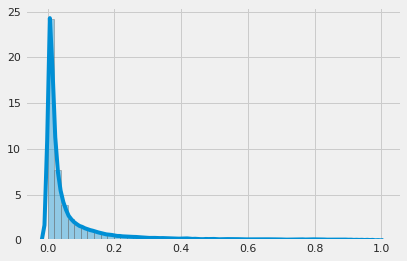

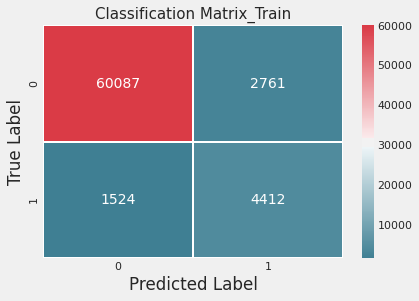



ROC_AUC score_Train: 0.9509407495078186
Brier_Score_Train: 0.04037596471641963
Accuracy Score_Train: 0.938
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97     62848
           1       0.62      0.74      0.67      5936

    accuracy                           0.94     68784
   macro avg       0.80      0.85      0.82     68784
weighted avg       0.94      0.94      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


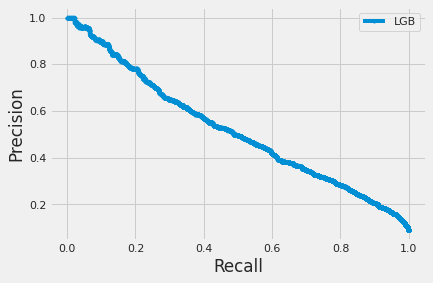

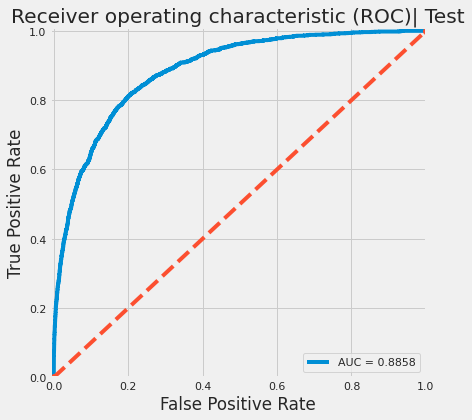

CPU times: user 3.62 s, sys: 220 ms, total: 3.84 s
Wall time: 3.11 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = check_threshold)

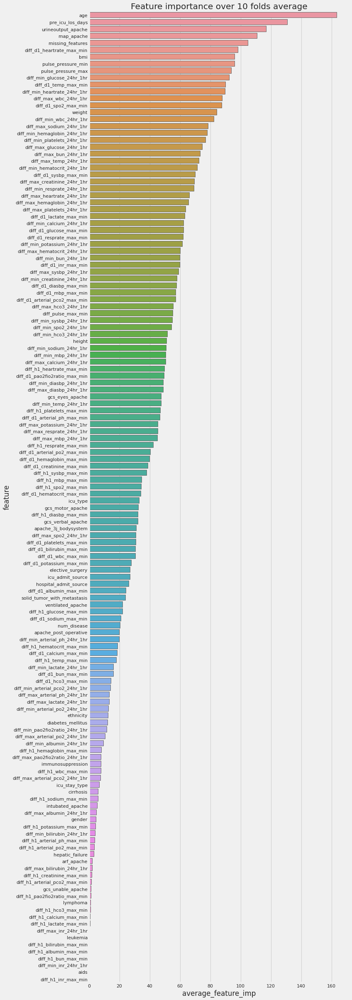

In [0]:
plot_feature_importance(df=feature_importances, k_fold_object=kf)

___
#### 6.2 REMOVE TAIL FEATURES

In [0]:
f_drop = feature_importances.sort_values('average_feature_imp', ascending= False).tail(17)['feature'].tolist()
f_drop.extend(drop_cols)
f_drop

['diff_max_bilirubin_24hr_1hr',
 'diff_h1_creatinine_max_min',
 'diff_h1_arterial_pco2_max_min',
 'gcs_unable_apache',
 'diff_h1_pao2fio2ratio_max_min',
 'lymphoma',
 'diff_h1_hco3_max_min',
 'diff_h1_calcium_max_min',
 'diff_h1_lactate_max_min',
 'diff_max_inr_24hr_1hr',
 'leukemia',
 'diff_h1_bilirubin_max_min',
 'diff_h1_albumin_max_min',
 'diff_h1_bun_max_min',
 'diff_min_inr_24hr_1hr',
 'aids',
 'diff_h1_inr_max_min',
 'hospital_id',
 'apache_4a_icu_death_prob',
 'apache_3j_diagnosis',
 'hospital_death',
 'apache_4a_hospital_death_prob',
 'apache_2_diagnosis',
 'patient_id',
 'icu_id']

In [0]:
cols = [ x for x in wt_hd_apache.columns.tolist() if x not in f_drop]

In [0]:
X_train, X_test, y_train, y_test  = split_data(wt_hd_apache, cols)

,total,train,test
0.0,91.4,91.4,91.4
1.0,8.6,8.6,8.6


In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train, X_test,y_train)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.986419	valid_1's auc: 0.891053
[500]	training's auc: 0.999062	valid_1's auc: 0.889071
Early stopping, best iteration is:
[104]	training's auc: 0.951046	valid_1's auc: 0.891881
FOLD 1: ROC_AUC  => 0.89188
Mean roc_auc for 10 folds: 0.08919
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985701	valid_1's auc: 0.877704
[500]	training's auc: 0.998992	valid_1's auc: 0.876054
Early stopping, best iteration is:
[76]	training's auc: 0.938629	valid_1's auc: 0.879977
FOLD 2: ROC_AUC  => 0.87998
Mean roc_auc for 10 folds: 0.17719
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.986014	valid_1's auc: 0.8931
[500]	training's auc: 0.998995	valid_1's auc: 0.891895
Early stopping, best iteration is:
[111]	training's auc: 0.954898	valid_1's auc: 0.896055
FOLD 3: ROC_AUC  => 0.89605
Mean roc_auc for 10 folds: 0.26679
FOLD

probability_distribution


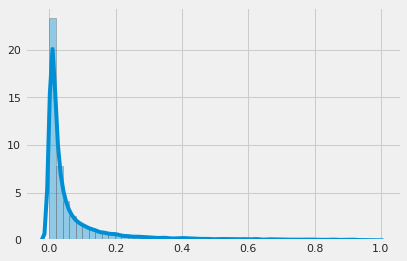

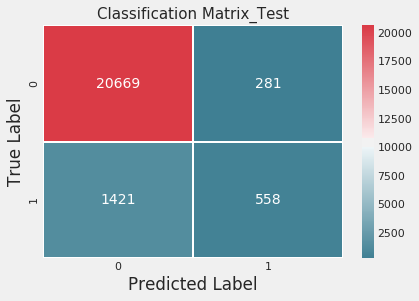



ROC_AUC score_Test: 0.8853057099545225
Brier_Score_Test:  0.056845226265894784
Accuracy Score_Test: 0.926
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.67      0.28      0.40      1979

    accuracy                           0.93     22929
   macro avg       0.80      0.63      0.68     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


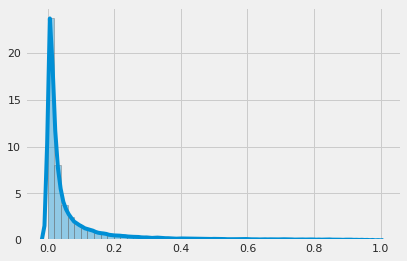

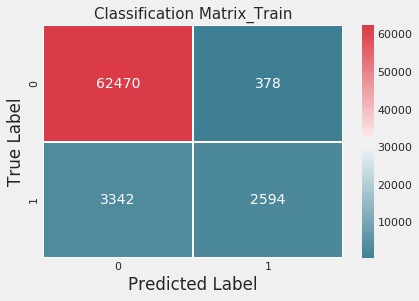



ROC_AUC score_Train: 0.9479926738271707
Brier_Score_Train: 0.04127907393387065
Accuracy Score_Train: 0.946
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.87      0.44      0.58      5936

    accuracy                           0.95     68784
   macro avg       0.91      0.72      0.78     68784
weighted avg       0.94      0.95      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


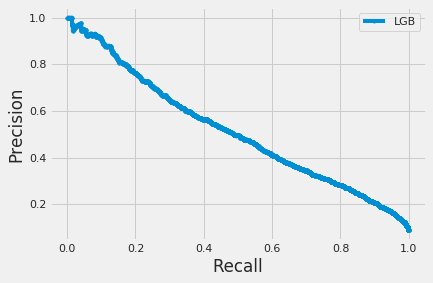

CPU times: user 3.55 s, sys: 222 ms, total: 3.77 s
Wall time: 3.07 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = 0.5)

__Adjust the threshold__

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.2384987370847946

probability_distribution


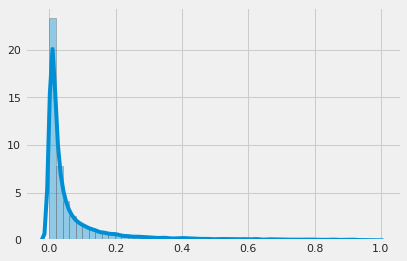

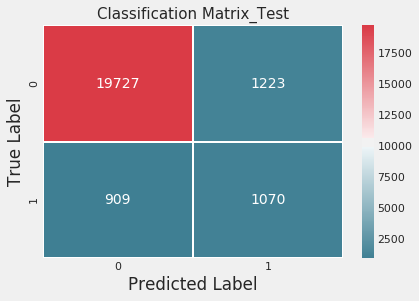



ROC_AUC score_Test: 0.8853057099545225
Brier_Score_Test:  0.056845226265894784
Accuracy Score_Test: 0.907
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.72     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


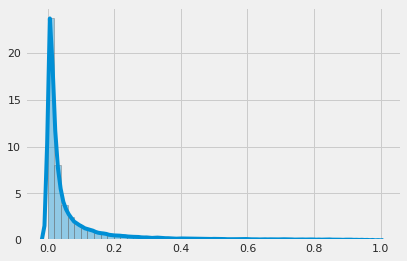

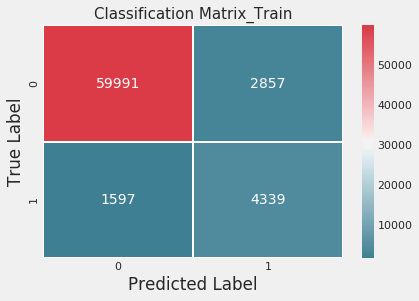



ROC_AUC score_Train: 0.9479926738271707
Brier_Score_Train: 0.04127907393387065
Accuracy Score_Train: 0.935
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96     62848
           1       0.60      0.73      0.66      5936

    accuracy                           0.94     68784
   macro avg       0.79      0.84      0.81     68784
weighted avg       0.94      0.94      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


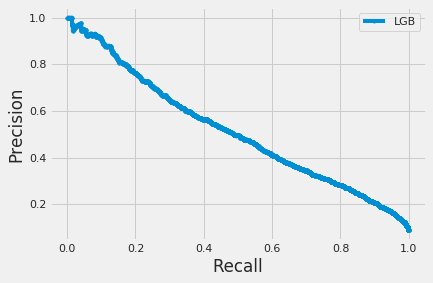

CPU times: user 3.51 s, sys: 221 ms, total: 3.73 s
Wall time: 3.06 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold= check_threshold)

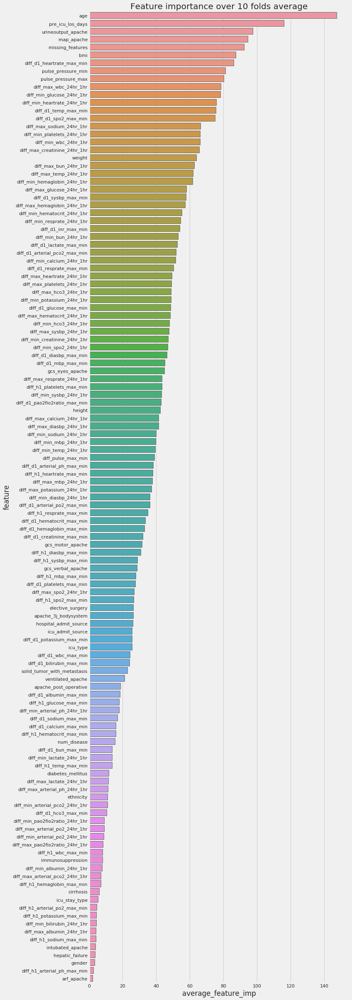

CPU times: user 2.91 s, sys: 170 ms, total: 3.08 s
Wall time: 3.09 s


In [0]:
%time plot_feature_importance(df=feature_importances, k_fold_object=kf)

#### 6.3 DROP DIFF_H1_MAX_MIN

In [0]:
h1_cols = [c for c in df.columns if (c.lower()[:7] == 'diff_h1')]
f_drop.extend(h1_cols)
cols = [ x for x in wt_hd_apache.columns.tolist() if x not in f_drop]

In [0]:
X_train, X_test, y_train, y_test  = split_data(wt_hd_apache, cols)

,total,train,test
0.0,91.4,91.4,91.4
1.0,8.6,8.6,8.6


In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train, X_test,y_train)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985108	valid_1's auc: 0.889005
[500]	training's auc: 0.99873	valid_1's auc: 0.88986
[750]	training's auc: 0.999968	valid_1's auc: 0.888409
[1000]	training's auc: 1	valid_1's auc: 0.888614
Early stopping, best iteration is:
[545]	training's auc: 0.999388	valid_1's auc: 0.890907
FOLD 1: ROC_AUC  => 0.89091
Mean roc_auc for 10 folds: 0.08909
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985049	valid_1's auc: 0.880975
[500]	training's auc: 0.998845	valid_1's auc: 0.880551
Early stopping, best iteration is:
[150]	training's auc: 0.965179	valid_1's auc: 0.882627
FOLD 2: ROC_AUC  => 0.88263
Mean roc_auc for 10 folds: 0.17735
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.984996	valid_1's auc: 0.8887
[500]	training's auc: 0.998758	valid_1's auc: 0.886152
Early stopping, best iteration is:
[101]	training's au

probability_distribution


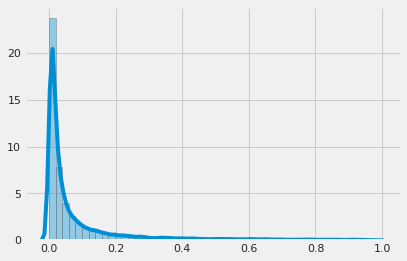

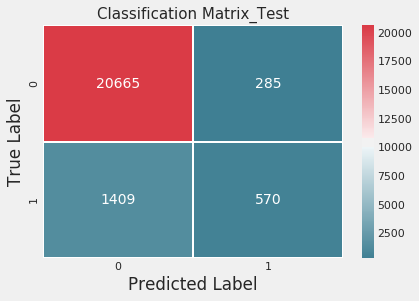



ROC_AUC score_Test: 0.8856279478678872
Brier_Score_Test:  0.056624222266365355
Accuracy Score_Test: 0.926
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.67      0.29      0.40      1979

    accuracy                           0.93     22929
   macro avg       0.80      0.64      0.68     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


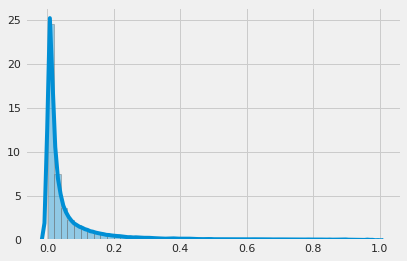

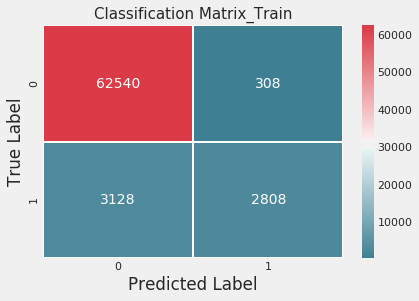



ROC_AUC score_Train: 0.9567242343955005
Brier_Score_Train: 0.038278457920014324
Accuracy Score_Train: 0.95
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97     62848
           1       0.90      0.47      0.62      5936

    accuracy                           0.95     68784
   macro avg       0.93      0.73      0.80     68784
weighted avg       0.95      0.95      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


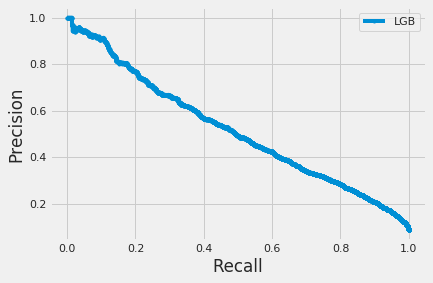

CPU times: user 4.19 s, sys: 234 ms, total: 4.43 s
Wall time: 3.52 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = 0.5)

__Adjust the threshold__

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.23798878776050003

probability_distribution


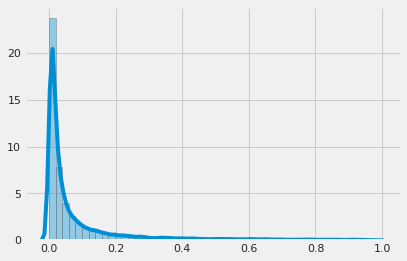

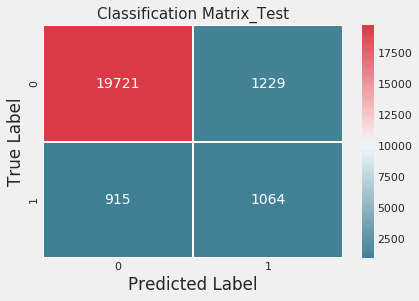



ROC_AUC score_Test: 0.8856279478678872
Brier_Score_Test:  0.056624222266365355
Accuracy Score_Test: 0.906
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.46      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.72     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


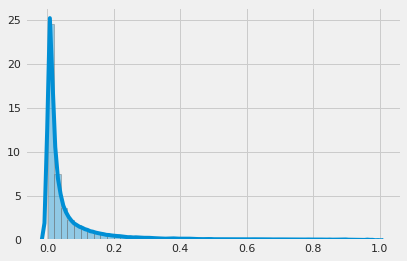

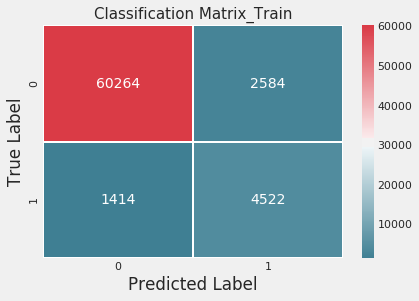



ROC_AUC score_Train: 0.9567242343955005
Brier_Score_Train: 0.038278457920014324
Accuracy Score_Train: 0.942
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97     62848
           1       0.64      0.76      0.69      5936

    accuracy                           0.94     68784
   macro avg       0.81      0.86      0.83     68784
weighted avg       0.95      0.94      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


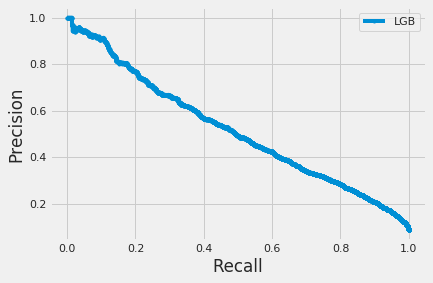

CPU times: user 3.98 s, sys: 220 ms, total: 4.19 s
Wall time: 3.3 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = check_threshold)

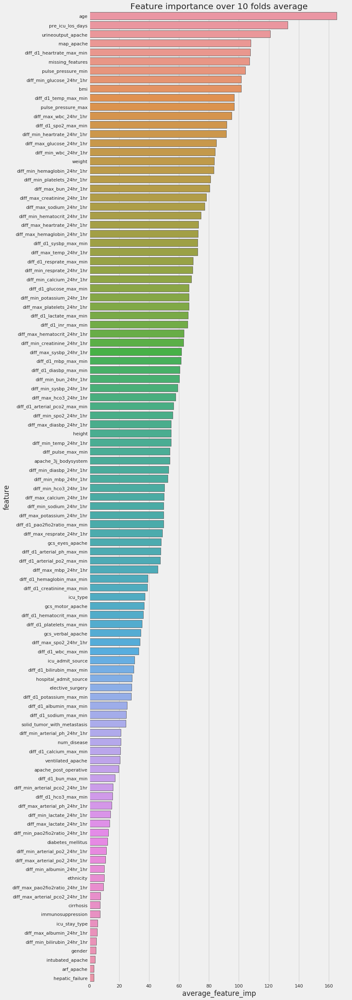

CPU times: user 2.67 s, sys: 156 ms, total: 2.83 s
Wall time: 2.82 s


In [0]:
%time plot_feature_importance(df=feature_importances, k_fold_object=kf)

In [0]:
feature_importances.sort_values('average_feature_imp', ascending=False)

,feature,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,fold_8,fold_9,fold_10,average_feature_imp
0,age,392,145,111,137,112,180,124,166,137,149,165.3
10,pre_icu_los_days,394,111,79,102,79,134,99,129,97,102,132.6
19,urineoutput_apache,362,97,76,91,63,123,87,115,97,97,120.8
18,map_apache,299,86,77,88,65,112,85,98,81,87,107.8
30,diff_d1_heartrate_max_min,286,83,68,80,64,118,96,116,71,94,107.6
27,missing_features,283,93,69,87,70,112,74,105,89,90,107.2
55,pulse_pressure_min,322,82,62,84,46,107,83,98,63,97,104.4
94,diff_min_glucose_24hr_1hr,303,88,62,78,64,124,76,86,63,71,101.5
1,bmi,309,91,63,69,47,108,65,115,81,67,101.5
35,diff_d1_temp_max_min,268,79,60,78,54,105,66,100,74,85,96.9


#### 6.4 Standardize all the data and fit the model again

In [0]:
columns_to_encode = df_wt_hd.select_dtypes(include='category').columns.values.tolist()
not_used = ['lymphoma', 'leukemia', 'aids', 'gcs_unable_apache', 'arf_apache', 'apache_3j_diagnosis']
encode = [x for x in columns_to_encode if x not in not_used]
pred_col = ['hospital_death']
columns_to_scale = [ x for x in cols if (x not in encode) & (x not in pred_col)]
cols.append('hospital_death')

In [0]:
df_model = df_wt_hd[cols]
df_encode =pd.get_dummies(df_model[encode])
dummies_col =[i for i in df_encode.columns]
df_model = pd.merge(df_model, df_encode, left_index=True, right_index=True, copy=True)
df_model.drop(encode,axis=1,inplace=True)

In [0]:
df_model.head(2)

,age,bmi,height,pre_icu_los_days,weight,arf_apache,map_apache,urineoutput_apache,missing_features,num_disease,diff_d1_diasbp_max_min,diff_d1_heartrate_max_min,diff_d1_mbp_max_min,diff_d1_resprate_max_min,diff_d1_spo2_max_min,diff_d1_sysbp_max_min,diff_d1_temp_max_min,diff_d1_albumin_max_min,diff_d1_bilirubin_max_min,diff_d1_bun_max_min,diff_d1_calcium_max_min,diff_d1_creatinine_max_min,diff_d1_glucose_max_min,diff_d1_hco3_max_min,diff_d1_hemaglobin_max_min,diff_d1_hematocrit_max_min,diff_d1_inr_max_min,diff_d1_lactate_max_min,diff_d1_platelets_max_min,diff_d1_potassium_max_min,diff_d1_sodium_max_min,diff_d1_wbc_max_min,diff_d1_arterial_pco2_max_min,diff_d1_arterial_ph_max_min,diff_d1_arterial_po2_max_min,diff_d1_pao2fio2ratio_max_min,pulse_pressure_min,pulse_pressure_max,diff_pulse_max_min,diff_max_diasbp_24hr_1hr,diff_max_heartrate_24hr_1hr,diff_max_mbp_24hr_1hr,diff_max_resprate_24hr_1hr,diff_max_spo2_24hr_1hr,diff_max_sysbp_24hr_1hr,diff_max_temp_24hr_1hr,diff_max_albumin_24hr_1hr,diff_max_bun_24hr_1hr,diff_max_calcium_24hr_1hr,diff_max_creatinine_24hr_1hr,diff_max_glucose_24hr_1hr,diff_max_hco3_24hr_1hr,diff_max_hemaglobin_24hr_1hr,diff_max_hematocrit_24hr_1hr,diff_max_lactate_24hr_1hr,diff_max_platelets_24hr_1hr,diff_max_potassium_24hr_1hr,diff_max_sodium_24hr_1hr,diff_max_wbc_24hr_1hr,diff_max_arterial_pco2_24hr_1hr,diff_max_arterial_ph_24hr_1hr,diff_max_arterial_po2_24hr_1hr,diff_max_pao2fio2ratio_24hr_1hr,diff_min_diasbp_24hr_1hr,diff_min_heartrate_24hr_1hr,diff_min_mbp_24hr_1hr,diff_min_resprate_24hr_1hr,diff_min_spo2_24hr_1hr,diff_min_sysbp_24hr_1hr,diff_min_temp_24hr_1hr,diff_min_albumin_24hr_1hr,diff_min_bilirubin_24hr_1hr,diff_min_bun_24hr_1hr,diff_min_calcium_24hr_1hr,diff_min_creatinine_24hr_1hr,diff_min_glucose_24hr_1hr,diff_min_hco3_24hr_1hr,diff_min_hemaglobin_24hr_1hr,diff_min_hematocrit_24hr_1hr,diff_min_lactate_24hr_1hr,diff_min_platelets_24hr_1hr,diff_min_potassium_24hr_1hr,diff_min_sodium_24hr_1hr,diff_min_wbc_24hr_1hr,diff_min_arterial_pco2_24hr_1hr,diff_min_arterial_ph_24hr_1hr,diff_min_arterial_po2_24hr_1hr,diff_min_pao2fio2ratio_24hr_1hr,hospital_death,elective_surgery_0,elective_surgery_1,ethnicity_African American,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_F,gender_M,hospital_admit_source_Acute Care/Floor,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_admit_source_Accident & Emergency,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_stay_type_admit,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_post_operative_0,apache_post_operative_1,gcs_eyes_apache_1.0,gcs_eyes_apache_2.0,gcs_eyes_apache_3.0,gcs_eyes_apache_4.0,gcs_eyes_apache_99.0,gcs_motor_apache_1.0,gcs_motor_apache_2.0,gcs_motor_apache_3.0,gcs_motor_apache_4.0,gcs_motor_apache_5.0,gcs_motor_apache_6.0,gcs_motor_apache_99.0,gcs_verbal_apache_1.0,gcs_verbal_apache_2.0,gcs_verbal_apache_3.0,gcs_verbal_apache_4.0,gcs_verbal_apache_5.0,gcs_verbal_apache_99.0,intubated_apache_0.0,intubated_apache_1.0,intubated_apache_99.0,ventilated_apache_0.0,ventilated_apache_1.0,ventilated_apache_99.0,cirrhosis_0.0,cirrhosis_1.0,diabetes_mellitus_0.0,diabetes_mellitus_1.0,hepatic_failure_0.0,hepatic_failure_1.0,immunosuppression_0.0,immunosuppression_1.0,solid_tumor_with_metastasis_0.0,solid_tumor_with_metastasis_1.0,apache_3j_bodysystem_Cardiovas

In [0]:
from sklearn.model_selection import train_test_split

X = df_model.drop(['hospital_death'],axis=1)
y = df_model['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)

In [0]:
# Import libraries and download example data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train[columns_to_scale])

#transform

X_train_scl = pd.DataFrame(scaler.transform(X_train[columns_to_scale]) , columns= columns_to_scale)
X_test_scl = pd.DataFrame(scaler.transform(X_test[columns_to_scale]), columns= columns_to_scale)


X_train_encode = X_train[dummies_col].reset_index()
X_test_encode = X_test[dummies_col].reset_index()

X_train = pd.merge(X_train_scl, X_train_encode, left_index=True, right_index=True, copy=True)
X_test = pd.merge(X_test_scl, X_test_encode, left_index=True, right_index=True, copy=True)

X_train.drop(columns=['index'], inplace=True)
X_test.drop(columns=['index'], inplace=True)

In [0]:
print(X_train_scl.shape)
print(X_test_scl.shape)

print(X_train_encode.shape)
print(X_test_encode.shape)

print(X_train.shape)
print(X_test.shape)

(68784, 88)
(22929, 88)
(68784, 90)
(22929, 90)
(68784, 177)
(22929, 177)


###### 6.4.1 Keep features similar to 6.3

In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train, X_test , y_train)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985401	valid_1's auc: 0.890233
[500]	training's auc: 0.998919	valid_1's auc: 0.886838
Early stopping, best iteration is:
[192]	training's auc: 0.975767	valid_1's auc: 0.891981
FOLD 1: ROC_AUC  => 0.89198
Mean roc_auc for 10 folds: 0.0892
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985599	valid_1's auc: 0.886605
[500]	training's auc: 0.998718	valid_1's auc: 0.883342
Early stopping, best iteration is:
[105]	training's auc: 0.9519	valid_1's auc: 0.887553
FOLD 2: ROC_AUC  => 0.88755
Mean roc_auc for 10 folds: 0.17795
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985586	valid_1's auc: 0.893906
[500]	training's auc: 0.998788	valid_1's auc: 0.894553
Early stopping, best iteration is:
[137]	training's auc: 0.96181	valid_1's auc: 0.89548
FOLD 3: ROC_AUC  => 0.89548
Mean roc_auc for 10 folds: 0.2675
FOLD 4


probability_distribution


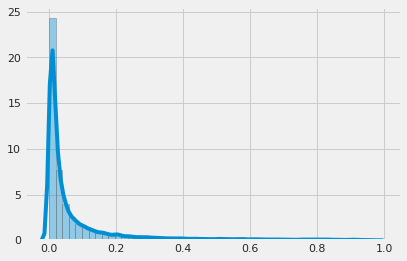

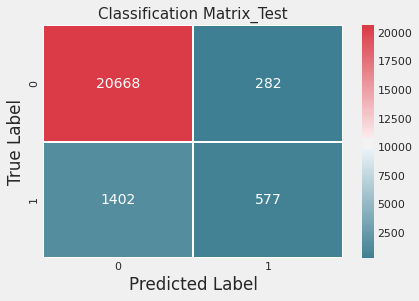



ROC_AUC score_Test: 0.8860820717775305
Brier_Score_Test:  0.05656202830014886
Accuracy Score_Test: 0.927
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.67      0.29      0.41      1979

    accuracy                           0.93     22929
   macro avg       0.80      0.64      0.68     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


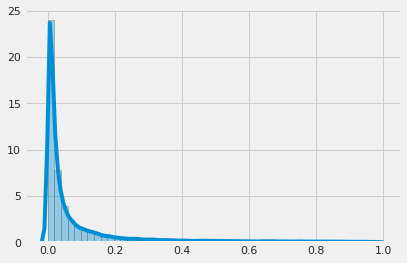

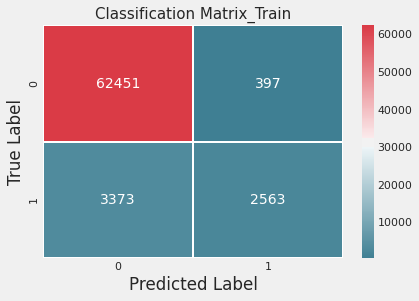



ROC_AUC score_Train: 0.9467352573324559
Brier_Score_Train: 0.04173346941510872
Accuracy Score_Train: 0.945
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.87      0.43      0.58      5936

    accuracy                           0.95     68784
   macro avg       0.91      0.71      0.77     68784
weighted avg       0.94      0.95      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


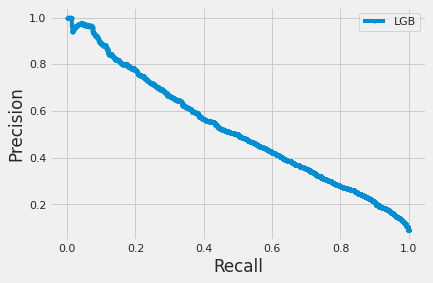

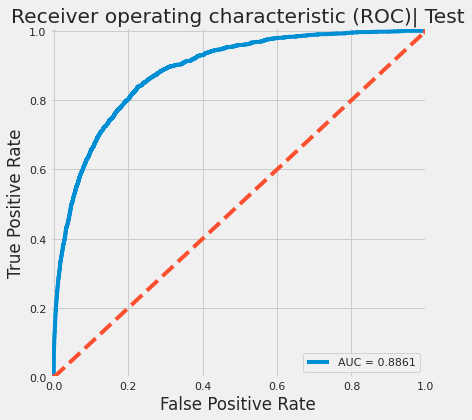

CPU times: user 3.43 s, sys: 222 ms, total: 3.65 s
Wall time: 2.97 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = 0.5)

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.23258227398456857

probability_distribution


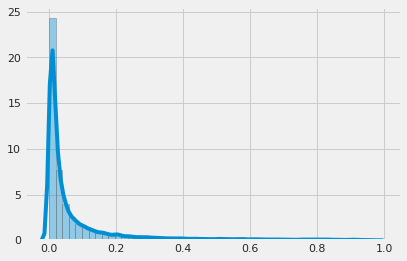

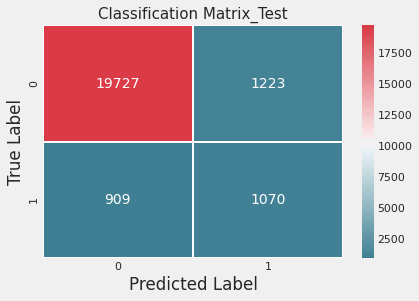



ROC_AUC score_Test: 0.8860820717775305
Brier_Score_Test:  0.05656202830014886
Accuracy Score_Test: 0.907
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.72     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


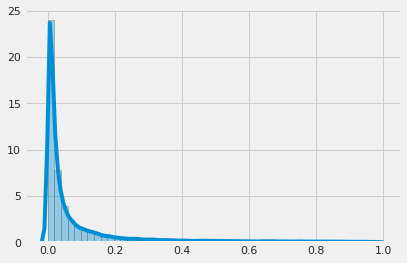

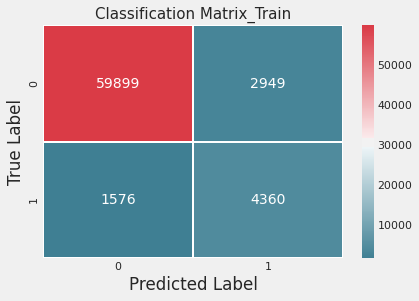



ROC_AUC score_Train: 0.9467352573324559
Brier_Score_Train: 0.04173346941510872
Accuracy Score_Train: 0.934
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96     62848
           1       0.60      0.73      0.66      5936

    accuracy                           0.93     68784
   macro avg       0.79      0.84      0.81     68784
weighted avg       0.94      0.93      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


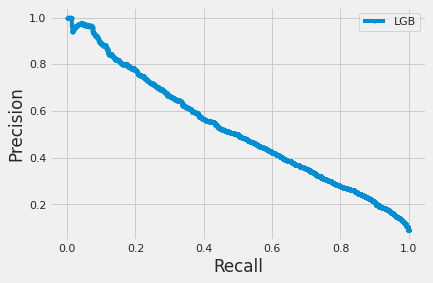

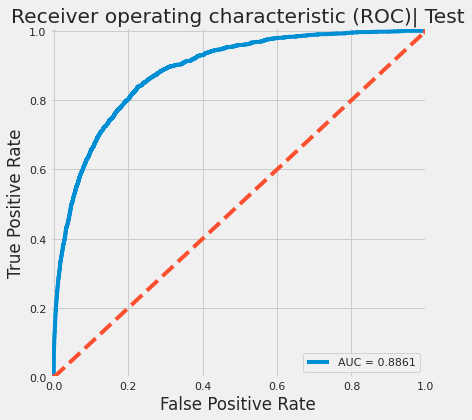

CPU times: user 3.5 s, sys: 218 ms, total: 3.72 s
Wall time: 3.06 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train, y_train, threshold = check_threshold)

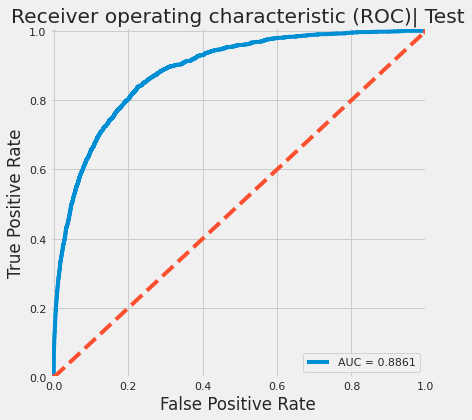

In [0]:
from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
fpr, tpr, thresholds = roc_curve(y_test, pred_on_test)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.title('Receiver operating characteristic (ROC)| Test')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'o--')
plt.xlim([-0.01, 1])
plt.ylim([0, 1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

In [0]:
! pip install shap

In [0]:
import shap
explainer = shap.TreeExplainer(lgb)
shap_values = explainer.shap_values(X_train)

# # load JS visualization code to notebook
shap.initjs()
# # visualize the first prediction's explanation
# SHAP plots for all the data is very slow, so we'll only do it for a sample. Taking the head instead of a random sample is dangerous! 
shap.force_plot(explainer.expected_value[1],shap_values[0][:40000][1], X_train.iloc[0,:40000])

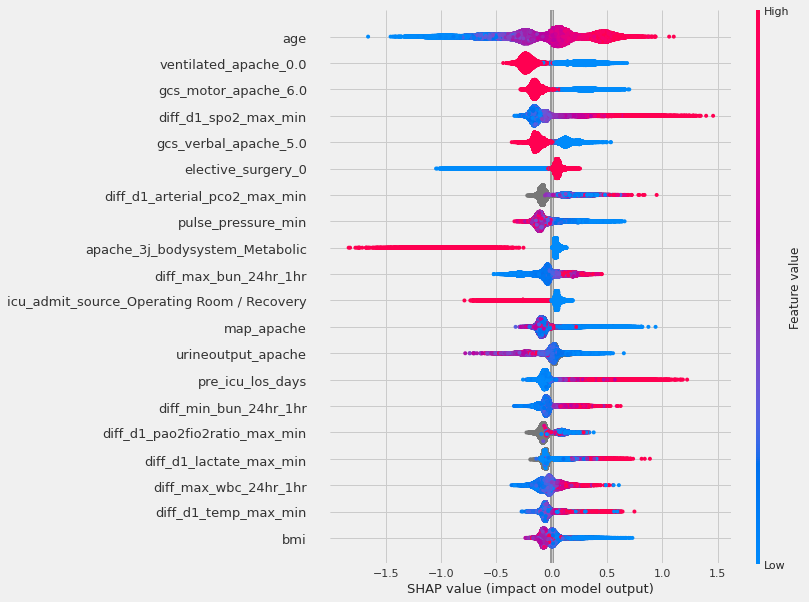

In [0]:
# summarize the effects of all the features
shap.summary_plot(shap_values[1], X_train)

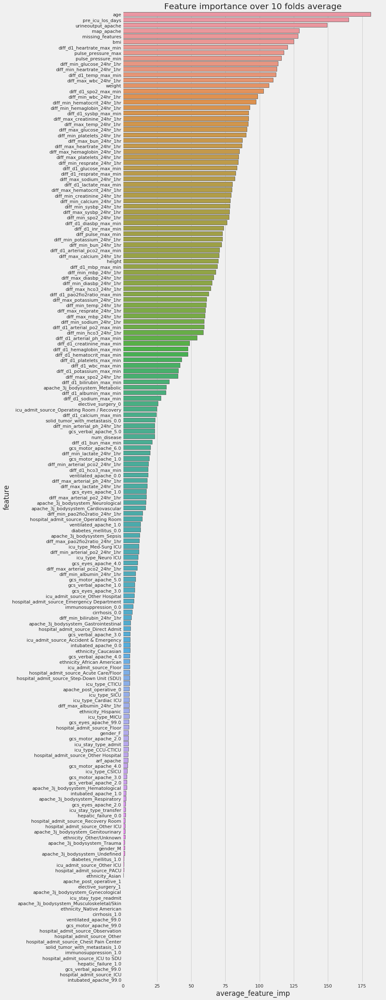

CPU times: user 4.2 s, sys: 284 ms, total: 4.48 s
Wall time: 4.49 s


In [0]:
%time plot_feature_importance(df=feature_importances, k_fold_object=kf)

In [0]:
feature_importances.shape

(177, 12)

In [0]:
feature_importances.sort_values('average_feature_imp', ascending=False).tail(50)

,feature,fold_1,fold_2,fold_3,fold_4,fold_5,fold_6,fold_7,fold_8,fold_9,fold_10,average_feature_imp
93,ethnicity_Hispanic,5,4,2,1,3,4,7,15,5,1,4.7
125,icu_type_MICU,6,2,4,2,4,1,1,21,2,3,4.6
135,gcs_eyes_apache_99.0,3,1,7,4,6,4,3,11,2,3,4.4
102,hospital_admit_source_Floor,1,2,3,1,0,4,4,20,5,4,4.4
96,gender_F,7,1,0,1,0,2,0,28,1,1,4.1
137,gcs_motor_apache_2.0,4,4,4,1,2,3,3,14,3,3,4.1
118,icu_stay_type_admit,5,0,1,1,4,2,0,20,2,5,4.0
121,icu_type_CCU-CTICU,4,0,1,1,2,2,4,23,1,2,4.0
108,hospital_admit_source_Other Hospital,6,0,8,2,2,7,1,7,1,5,3.9
5,arf_apache,5,2,2,0,2,1,0,20,4,1,3.7


##### 6.4.2 Drop last 50 features in FI

In [0]:
fi_drop = feature_importances.sort_values('average_feature_imp', ascending= False).tail(50)['feature'].tolist()
fi_drop.extend(drop_cols)
fi_drop

In [0]:
cols = [ x for x in X_train.columns.tolist() if x not in fi_drop]
cols

In [0]:
X_train_new = X_train[cols]
X_test_new = X_test[cols]

In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train_new, X_test_new , y_train)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985377	valid_1's auc: 0.891368
[500]	training's auc: 0.99871	valid_1's auc: 0.893571
[750]	training's auc: 0.999957	valid_1's auc: 0.892837
Early stopping, best iteration is:
[372]	training's auc: 0.99538	valid_1's auc: 0.894872
FOLD 1: ROC_AUC  => 0.89487
Mean roc_auc for 10 folds: 0.08949
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985541	valid_1's auc: 0.879511
[500]	training's auc: 0.99882	valid_1's auc: 0.876006
Early stopping, best iteration is:
[126]	training's auc: 0.959517	valid_1's auc: 0.88049
FOLD 2: ROC_AUC  => 0.88049
Mean roc_auc for 10 folds: 0.17754
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.985297	valid_1's auc: 0.894249
[500]	training's auc: 0.998816	valid_1's auc: 0.892564
Early stopping, best iteration is:
[118]	training's auc: 0.956201	valid_1's auc: 0.897696
FOLD 3: ROC_A

probability_distribution


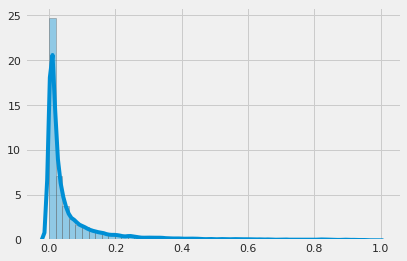

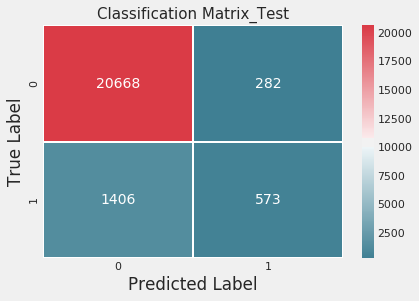



ROC_AUC score_Test: 0.8866187570926711
Brier_Score_Test:  0.05653175890159981
Accuracy Score_Test: 0.926
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.67      0.29      0.40      1979

    accuracy                           0.93     22929
   macro avg       0.80      0.64      0.68     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


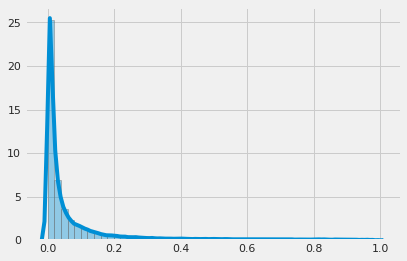

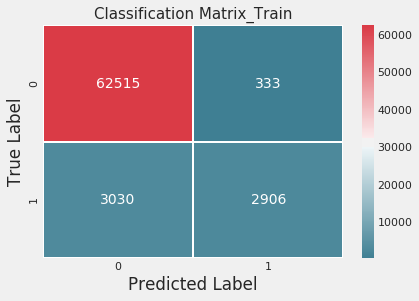



ROC_AUC score_Train: 0.9601076676761903
Brier_Score_Train: 0.037245852247642666
Accuracy Score_Train: 0.951
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.90      0.49      0.63      5936

    accuracy                           0.95     68784
   macro avg       0.93      0.74      0.80     68784
weighted avg       0.95      0.95      0.94     68784

------------------------------------------------------------------------------------------
PR curve on test


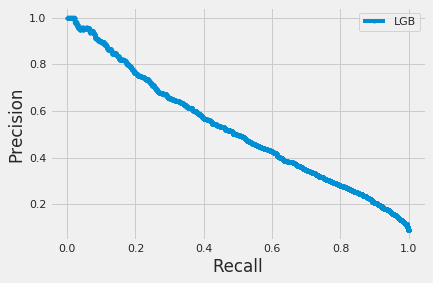

CPU times: user 3.91 s, sys: 214 ms, total: 4.13 s
Wall time: 3.26 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train_new, y_train, threshold = 0.5)

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.23981632960878851

probability_distribution


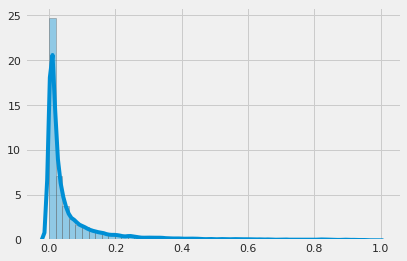

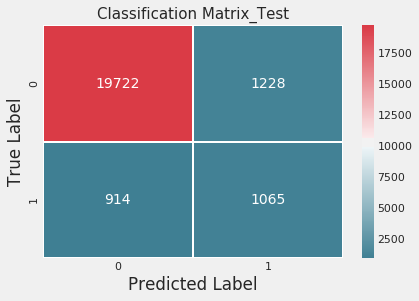



ROC_AUC score_Test: 0.8866187570926711
Brier_Score_Test:  0.05653175890159981
Accuracy Score_Test: 0.907
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.46      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.72     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


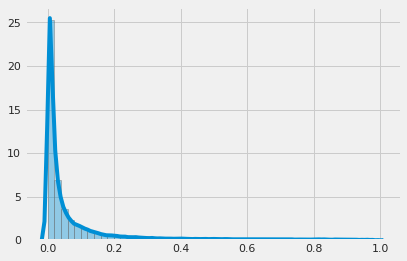

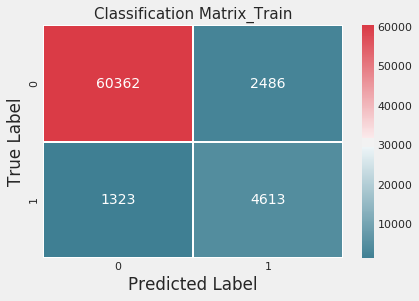



ROC_AUC score_Train: 0.9601076676761903
Brier_Score_Train: 0.037245852247642666
Accuracy Score_Train: 0.945
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.98      0.96      0.97     62848
           1       0.65      0.78      0.71      5936

    accuracy                           0.94     68784
   macro avg       0.81      0.87      0.84     68784
weighted avg       0.95      0.94      0.95     68784

------------------------------------------------------------------------------------------
PR curve on test


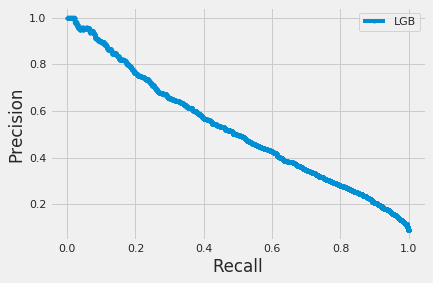

CPU times: user 3.92 s, sys: 181 ms, total: 4.11 s
Wall time: 3.26 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train_new, y_train, threshold = check_threshold)

In [0]:
# # Save X_train, X_test
# X_train.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/X_train_LGB.csv')
# X_test.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/X_test_LGB.csv')

# # Save y_train, y_test
# y_train_LGB = pd.DataFrame(y_train)
# y_test_LGB = pd.DataFrame(y_test)
# y_train_LGB.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/y_train_LGB.csv')
# y_test_LGB.to_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/y_test_LGB.csv')

___
#### 6.5 SMOTE WITH STANDARDIZE DATA IN 6.4
___

In [0]:
X_train_impute = X_train.fillna(99)
X_test_impute = X_test.fillna(99)

In [0]:
from imblearn.over_sampling import SMOTE
# using SMOTE for unbalanced data
X_train_s, y_train_s= SMOTE().fit_resample(X_train_impute, y_train)

X_train_s = pd.DataFrame(X_train_s, columns= X_train.columns.tolist())
y_train_s = pd.DataFrame(y_train_s)

In [0]:
%time pred_on_test, feature_importances, lgb, kf = run_lgb(X_train_s, X_test_impute , y_train_s)

FOLD 1
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.997943	valid_1's auc: 0.991461
[500]	training's auc: 0.999834	valid_1's auc: 0.991667
[750]	training's auc: 0.999988	valid_1's auc: 0.991538
Early stopping, best iteration is:
[492]	training's auc: 0.999822	valid_1's auc: 0.991675
FOLD 1: ROC_AUC  => 0.99167
Mean roc_auc for 10 folds: 0.09917
FOLD 2
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.997986	valid_1's auc: 0.989182
[500]	training's auc: 0.999851	valid_1's auc: 0.989175
Early stopping, best iteration is:
[172]	training's auc: 0.996139	valid_1's auc: 0.989269
FOLD 2: ROC_AUC  => 0.98927
Mean roc_auc for 10 folds: 0.19809
FOLD 3
Training until validation scores don't improve for 500 rounds.
[250]	training's auc: 0.99791	valid_1's auc: 0.989231
[500]	training's auc: 0.999822	valid_1's auc: 0.989585
[750]	training's auc: 0.999992	valid_1's auc: 0.989507
[1000]	training's auc: 1	valid_1's auc: 0.989

probability_distribution


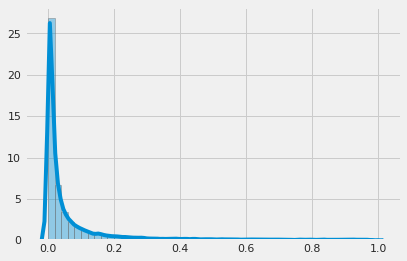

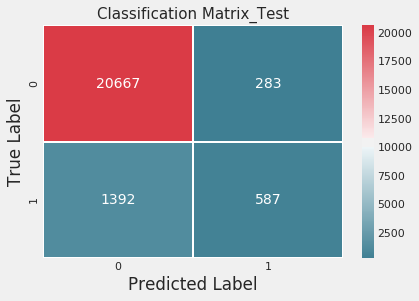



ROC_AUC score_Test: 0.8879665364610029
Brier_Score_Test:  0.056485789593622486
Accuracy Score_Test: 0.927
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.67      0.30      0.41      1979

    accuracy                           0.93     22929
   macro avg       0.81      0.64      0.69     22929
weighted avg       0.91      0.93      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


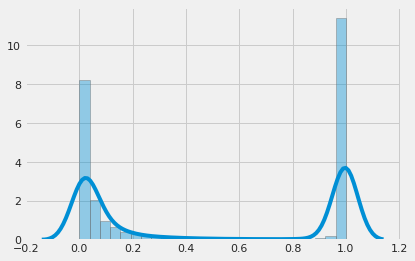

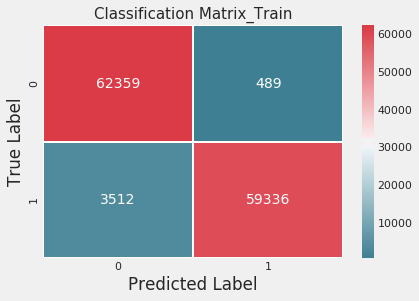



ROC_AUC score_Train: 0.9949440696989387
Brier_Score_Train: 0.024175564854265637
Accuracy Score_Train: 0.968
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.99      0.94      0.97     62848

    accuracy                           0.97    125696
   macro avg       0.97      0.97      0.97    125696
weighted avg       0.97      0.97      0.97    125696

------------------------------------------------------------------------------------------
PR curve on test


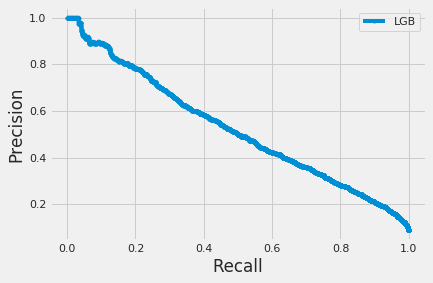

CPU times: user 5.98 s, sys: 218 ms, total: 6.2 s
Wall time: 4.53 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train_s, y_train_s, threshold = 0.5)

__Adjust threshold based on quantile__

In [0]:
check_threshold = pd.DataFrame(pred_on_test).quantile(0.90)[0]
check_threshold

0.2146494979436108

probability_distribution


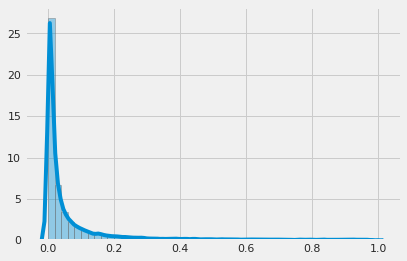

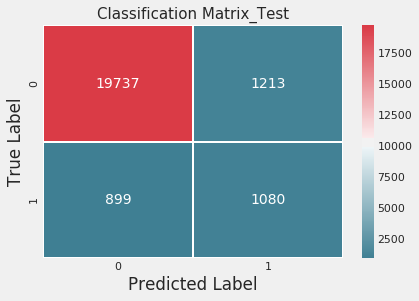



ROC_AUC score_Test: 0.8879665364610029
Brier_Score_Test:  0.056485789593622486
Accuracy Score_Test: 0.908
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.55      0.51      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.73     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------
probability_distribution_TRAIN


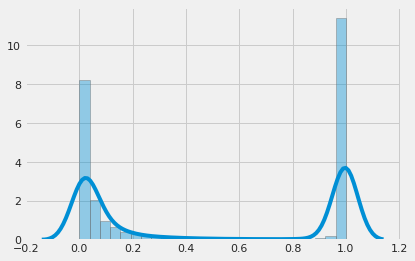

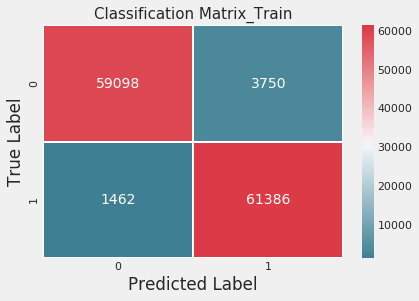



ROC_AUC score_Train: 0.9949440696989387
Brier_Score_Train: 0.024175564854265637
Accuracy Score_Train: 0.959
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.98      0.94      0.96     62848
           1       0.94      0.98      0.96     62848

    accuracy                           0.96    125696
   macro avg       0.96      0.96      0.96    125696
weighted avg       0.96      0.96      0.96    125696

------------------------------------------------------------------------------------------
PR curve on test


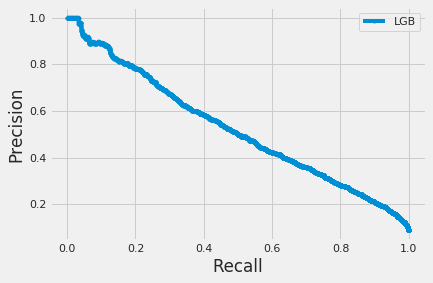

CPU times: user 6.29 s, sys: 233 ms, total: 6.52 s
Wall time: 4.88 s


In [0]:
%time matrix_report(y_test, pred_on_test, X_train_s, y_train_s, threshold = check_threshold)

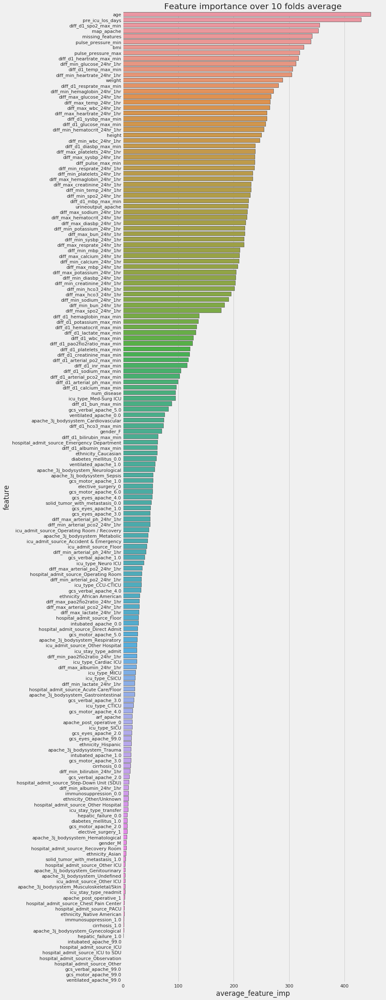

CPU times: user 3.88 s, sys: 257 ms, total: 4.14 s
Wall time: 4.15 s


In [0]:
%time plot_feature_importance(df=feature_importances, k_fold_object=kf)

____
### VII. LOGISTIC REGRESSION

For this section, we will try three versions:
- Without SMOTE
- With SMOTE
- PCA withour SMOTE

In [0]:
random_state = 911
LR = LogisticRegression(penalty= 'l2',random_state = random_state)
Models = [LR]

____
#### 7.1 WITHOUT SMOTE
____

In [0]:
X_train_lg = X_train.fillna(0)
X_test_lg = X_test.fillna(0)

##### Threshold: 0.5

probability_distribution_test


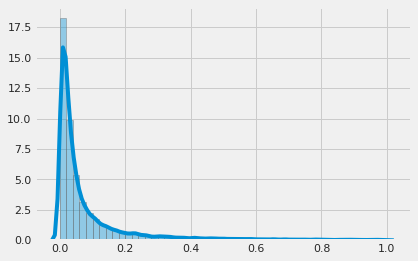

ROC_AUC_test:  0.8586259061433837
Brier_Score_test:  0.061777675845410746
Accuracy Score_Test: 0.92
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     20950
           1       0.60      0.21      0.31      1979

    accuracy                           0.92     22929
   macro avg       0.77      0.60      0.63     22929
weighted avg       0.90      0.92      0.90     22929



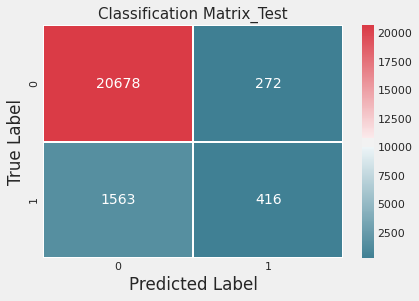



probability_distribution_train


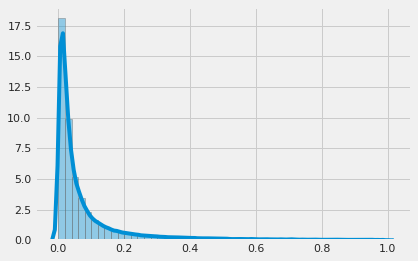

ROC_AUC_train:  0.8686815718435547
Brier_Score_train:  0.059581698352229165
Accuracy Score_Train: 0.923
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     62848
           1       0.65      0.24      0.35      5936

    accuracy                           0.92     68784
   macro avg       0.79      0.61      0.65     68784
weighted avg       0.91      0.92      0.91     68784



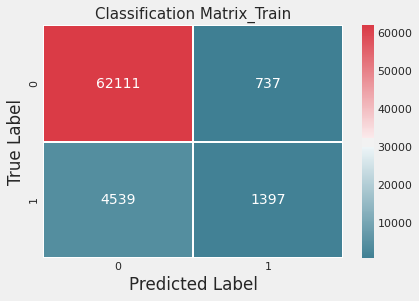

PR curve on test


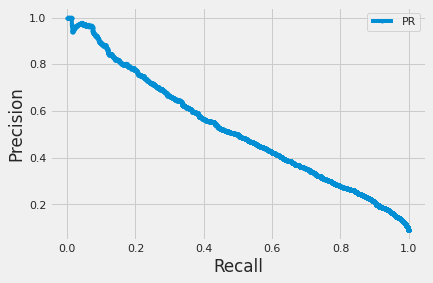

CPU times: user 6.12 s, sys: 1.04 s, total: 7.16 s
Wall time: 4.43 s


In [0]:
%time fit_predict_score(LR, X_train_lg, y_train, X_test_lg, y_test, threshold=0.5)

##### Adjust threshold - 90% qunatile

probability_distribution_test


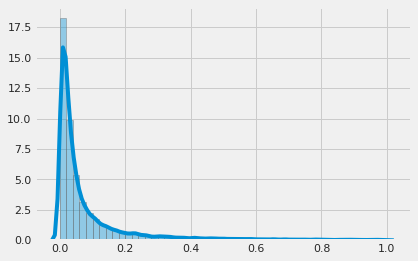

ROC_AUC_test:  0.8586259061433837
Brier_Score_test:  0.061777675845410746




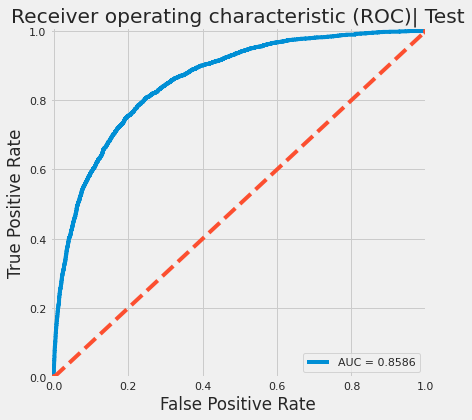

Accuracy Score_Test: 0.901
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95     20950
           1       0.43      0.46      0.45      1979

    accuracy                           0.90     22929
   macro avg       0.69      0.70      0.70     22929
weighted avg       0.90      0.90      0.90     22929



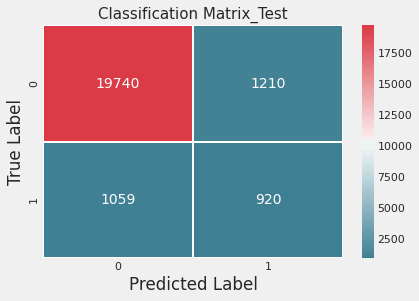



probability_distribution_train


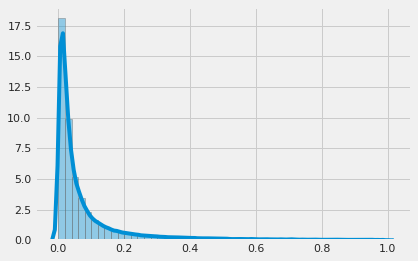

ROC_AUC_train:  0.8686815718435547
Brier_Score_train:  0.059581698352229165
Accuracy Score_Train: 0.905
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95     62848
           1       0.45      0.49      0.47      5936

    accuracy                           0.91     68784
   macro avg       0.70      0.72      0.71     68784
weighted avg       0.91      0.91      0.91     68784



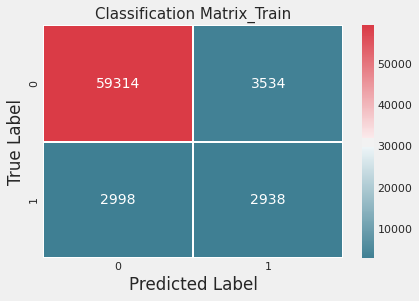

CPU times: user 5.81 s, sys: 1.01 s, total: 6.83 s
Wall time: 4.24 s


In [0]:
%time fit_predict_score(LR, X_train_lg, y_train, X_test_lg, y_test, threshold=0.23981632960878851)

__Feature Importance based on coefficient__

In [0]:
X_train_lg.shape

(68784, 177)

In [0]:
feat_cols = X_train_lg.columns.tolist()
feature_importances_lr =pd.DataFrame(data=abs(LR.coef_.transpose()),index=feat_cols)
feature_importances_lr.rename(columns={0: "Coefficient"},inplace=True)
feature_importances_lr['Importance']=np.round(feature_importances_lr['Coefficient']/feature_importances_lr['Coefficient'].sum()*100,4)
feature_importances_lr.sort_values('Importance',ascending=False,inplace=True)
feature_importances_lr['cumsum']=feature_importances_lr['Importance'].cumsum()
feature_importances_lr.head(300)

,Coefficient,Importance,cumsum
apache_3j_bodysystem_Metabolic,1.3,4.6,4.6
apache_3j_bodysystem_Hematological,0.7,2.6,7.1
diff_max_platelets_24hr_1hr,0.7,2.5,9.7
elective_surgery_1,0.6,2.2,11.9
apache_3j_bodysystem_Genitourinary,0.6,2.2,14.1
icu_admit_source_Operating Room / Recovery,0.6,2.2,16.3
diff_min_platelets_24hr_1hr,0.6,2.2,18.4
gcs_motor_apache_6.0,0.6,2.1,20.6
ventilated_apache_0.0,0.6,2.0,22.6
age,0.5,1.9,24.5


____
#### 7.2 WITH SMOTE

The result suggests that SMOTE does not help improve model performance.
____

##### Threshold: 0.5

In [0]:
from imblearn.over_sampling import SMOTE
# using SMOTE for unbalanced data
X_train_s, y_train_s= SMOTE().fit_resample(X_train_lg, y_train)

X_train_s = pd.DataFrame(X_train_s, columns= X_train.columns.tolist())
y_train_s = pd.DataFrame(y_train_s)

probability_distribution_test


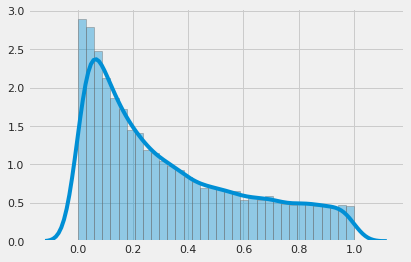

ROC_AUC_test:  0.8549158286109158
Brier_Score_test:  0.15282318962097577
Accuracy Score_Test: 0.78
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.97      0.78      0.87     20950
           1       0.25      0.76      0.37      1979

    accuracy                           0.78     22929
   macro avg       0.61      0.77      0.62     22929
weighted avg       0.91      0.78      0.82     22929



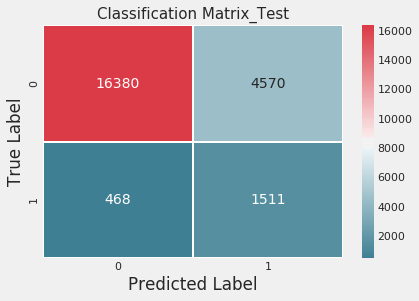



probability_distribution_train


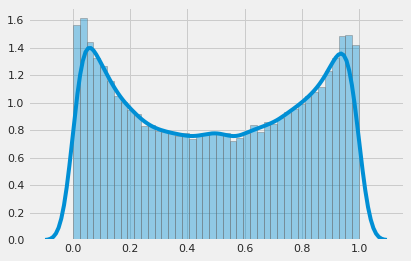

ROC_AUC_train:  0.8697993900410579
Brier_Score_train:  0.14627584854897585
Accuracy Score_Train: 0.788
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.79      0.79      0.79     62848
           1       0.79      0.79      0.79     62848

    accuracy                           0.79    125696
   macro avg       0.79      0.79      0.79    125696
weighted avg       0.79      0.79      0.79    125696



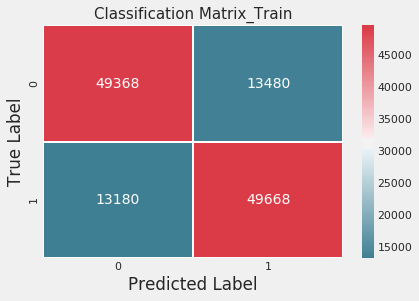

PR curve on test


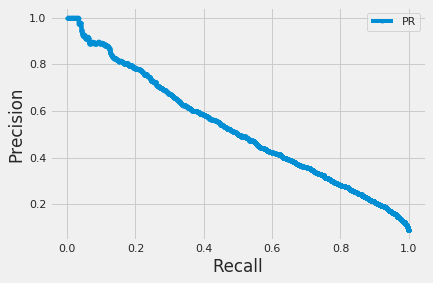

CPU times: user 14.6 s, sys: 1.99 s, total: 16.6 s
Wall time: 9.89 s


In [0]:
%time fit_predict_score(LR, X_train_s, y_train_s, X_test_lg, y_test, threshold=0.5)

##### Threshold: 0.7

probability_distribution_test


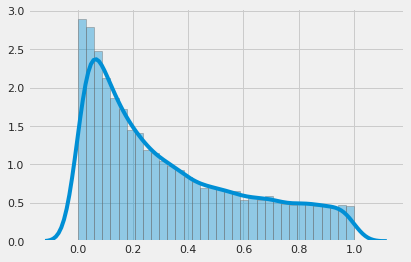

ROC_AUC_test:  0.8549158286109158
Brier_Score_test:  0.15282318962097577
Accuracy Score_Test: 0.87
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.90      0.93     20950
           1       0.35      0.58      0.43      1979

    accuracy                           0.87     22929
   macro avg       0.65      0.74      0.68     22929
weighted avg       0.90      0.87      0.88     22929



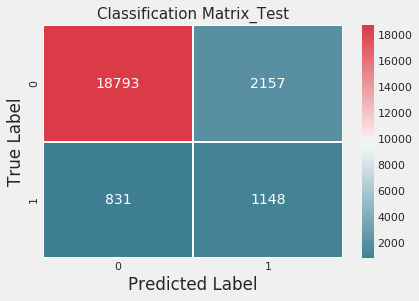



probability_distribution_train


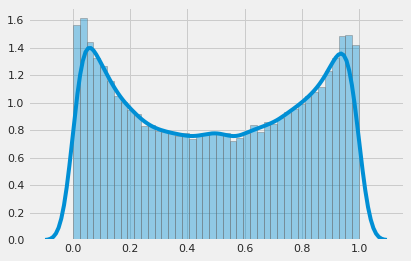

ROC_AUC_train:  0.8697993900410579
Brier_Score_train:  0.14627584854897585
Accuracy Score_Train: 0.745
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.69      0.90      0.78     62848
           1       0.86      0.59      0.70     62848

    accuracy                           0.74    125696
   macro avg       0.77      0.74      0.74    125696
weighted avg       0.77      0.74      0.74    125696



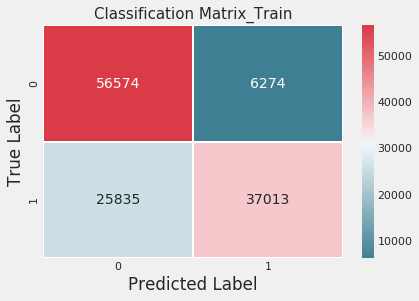

PR curve on test


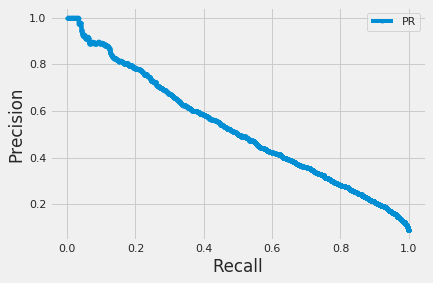

CPU times: user 14.3 s, sys: 1.97 s, total: 16.3 s
Wall time: 9.57 s


In [0]:
%time fit_predict_score(LR, X_train_s, y_train_s, X_test_lg, y_test, threshold=0.7)

In [0]:
def LR_feature_importance(LR, X_train):
    fi_cols = X_train.columns.tolist()
    feature_importances_LR =pd.DataFrame(data=abs(LR.coef_.transpose()),index=fi_cols)
    feature_importances_LR.rename(columns={0: "Coefficient"},inplace=True)
    feature_importances_LR['Importance']=np.round(feature_importances_LR['Coefficient']/feature_importances_LR['Coefficient'].sum()*100,4)
    feature_importances_LR.sort_values('Importance',ascending=False,inplace=True)
    feature_importances_LR['cumsum']=feature_importances_LR['Importance'].cumsum()
    display(feature_importances_LR.head(100))

In [0]:
LR_feature_importance(LR, X_train)

,Coefficient,Importance,cumsum
apache_3j_bodysystem_Metabolic,1.5,4.4,4.4
apache_3j_bodysystem_Hematological,1.0,2.8,7.2
diff_max_platelets_24hr_1hr,1.0,2.8,10.0
diff_min_platelets_24hr_1hr,0.9,2.5,12.6
gcs_motor_apache_2.0,0.9,2.4,15.0
age,0.7,2.1,17.1
gcs_motor_apache_6.0,0.7,1.9,18.9
gcs_motor_apache_1.0,0.6,1.8,20.7
icu_admit_source_Operating Room / Recovery,0.6,1.7,22.4
apache_3j_bodysystem_Musculoskeletal/Skin,0.6,1.7,24.1


___
#### 7.3 PCA WITHOUT SMOTE
___

In [0]:
comorbidity =['cirrhosis','diabetes_mellitus','hepatic_failure','immunosuppression','leukemia','lymphoma','solid_tumor_with_metastasis','elective_surgery','aids']
for i in comorbidity:
  df_wt_h[i]=df_wt_h[i].astype('category')

demo = ['ethnicity','gender','hospital_admit_source','icu_stay_type','icu_admit_source','icu_type'] 
for i in demo:
  df_wt_h[i]=df_wt_h[i].astype('category')


gcs = ['gcs_eyes_apache','gcs_motor_apache','gcs_verbal_apache','gcs_unable_apache']
for i in gcs:
  df_wt_h[i]=df_wt_h[i].astype('category')


for i in ['intubated_apache','arf_apache','ventilated_apache']:
  df_wt_h[i]=df_wt_h[i].astype('category')


df_wt_h['apache_3j_bodysystem'] =df_wt_h['apache_3j_bodysystem'].astype('category')
df_wt_h['apache_3j_diagnosis'] =df_wt_h['apache_3j_diagnosis'].astype('category')
df_wt_h['apache_post_operative'] =df_wt_h['apache_post_operative'].astype('category')
df_wt_h['missing_features'] =df_wt_h['missing_features'].astype('category')
df_wt_h['num_disease'] =df_wt_h['num_disease'].astype('category')

In [0]:
f_drop = ['diff_max_bilirubin_24hr_1hr',
 'diff_h1_creatinine_max_min',
 'diff_h1_arterial_pco2_max_min',
 'gcs_unable_apache',
 'diff_h1_pao2fio2ratio_max_min',
 'lymphoma',
 'diff_h1_hco3_max_min',
 'diff_h1_calcium_max_min',
 'diff_h1_lactate_max_min',
 'diff_max_inr_24hr_1hr',
 'leukemia',
 'diff_h1_bilirubin_max_min',
 'diff_h1_albumin_max_min',
 'diff_h1_bun_max_min',
 'diff_min_inr_24hr_1hr',
 'aids',
 'diff_h1_inr_max_min',
 'patient_id',
 'apache_2_diagnosis',
 'icu_id',
 'hospital_id',
 'hospital_death',
 'apache_3j_bodysystem',
 'apache_4a_hospital_death_prob',
 'apache_4a_icu_death_prob', 
 'hospital_id',
 'patient_id',
 'hospital_death',
 'icu_id',
 ]
h1_cols = [c for c in df_wt_h.columns if (c.lower()[:7] == 'diff_h1')]
f_drop.extend(h1_cols)
cols = [ x for x in df_wt_h.columns.tolist() if x not in f_drop]
cols

['age',
 'bmi',
 'elective_surgery',
 'ethnicity',
 'gender',
 'height',
 'hospital_admit_source',
 'icu_admit_source',
 'icu_stay_type',
 'icu_type',
 'pre_icu_los_days',
 'weight',
 'apache_3j_diagnosis',
 'apache_post_operative',
 'arf_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'intubated_apache',
 'map_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max

In [0]:
columns_to_encode = df_wt_h.select_dtypes(include='category').columns.values.tolist()
not_used = ['lymphoma', 'leukemia', 'aids', 'gcs_unable_apache', 'arf_apache', 'apache_3j_bodysystem']
encode = [x for x in columns_to_encode if x not in not_used]
pred_col = ['hospital_death']
columns_to_scale = [ x for x in cols if (x not in encode) & (x not in pred_col)]
cols.append('hospital_death')

In [0]:
df_model = df_wt_h[cols]
df_encode =pd.get_dummies(df_model[encode])
dummies_col =[i for i in df_encode.columns]
df_model = pd.merge(df_model, df_encode, left_index=True, right_index=True, copy=True)
df_model.drop(encode,axis=1,inplace=True)

In [0]:
df_model = df_model.fillna(99)

In [0]:
# Import libraries and download example data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(df_model[columns_to_scale])

#transform

df_model_scl = pd.DataFrame(scaler.transform(df_model[columns_to_scale]) , columns= columns_to_scale)
df_model_encode = df_model[dummies_col].reset_index()

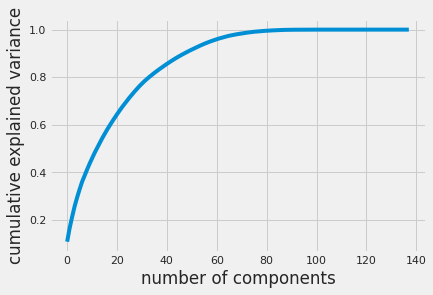

In [0]:
from sklearn.decomposition import PCA
pca = PCA()
principalComponents = pca.fit_transform(df_model_scl)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [0]:
principal_df = pd.DataFrame(data = principalComponents)
df_scl_pca = principal_df.loc[:,:70].copy()

df_model_pca = pd.merge(df_scl_pca, df_model_encode, left_index=True, right_index=True, copy=True)
df_model_pca.drop(columns=['index'], inplace=True)
df_model_pca.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,elective_surgery_0,elective_surgery_1,ethnicity_African American,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_F,gender_M,hospital_admit_source_Acute Care/Floor,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_admit_source_Accident & Emergency,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_stay_type_admit,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_diagnosis_0.01,apache_3j_diagnosis_0.02,apache_3j_diagnosis_0.03,apache_3j_diagnosis_0.04,apache_3j_diagnosis_0.06,apache_3j_diagnosis_0.09,apache_3j_diagnosis_0.11,apache_3j_diagnosis_0.13,apache_3j_diagnosis_0.14,apache_3j_diagnosis_0.15,apache_3j_diagnosis_0.18,apache_3j_diagnosis_0.19,apache_3j_diagnosis_0.2,apache_3j_diagnosis_0.21,apache_3j_diagnosis_0.22,apache_3j_diagnosis_0.23,apache_3j_diagnosis_0.24,apache_3j_diagnosis_0.25,apache_3j_diagnosis_101.01,apache_3j_diagnosis_101.02,apache_3j_diagnosis_102.01,apache_3j_diagnosis_102.02,apache_3j_diagnosis_103.01,apache_3j_diagnosis_104.01,apache_3j_diagnosis_105.01,apache_3j_diagnosis_105.02,apache_3j_diagnosis_106.01,apache_3j_diagnosis_107.01,apache_3j_diagnosis_108.01,apache_3j_diagnosis_109.01,apache_3j_diagnosis_109.02,apache_3j_diagnosis_109.03,apache_3j_diagnosis_109.04,apache_3j_diagnosis_109.05,apache_3j_diagnosis_109.06,apache_3j_diagnosis_109.07,apache_3j_diagnosis_109.08,apache_3j_diagnosis_109.09,apache_3j_diagnosis_109.1,apache_3j_diagnosis_109.11,apache_3j_diagnosis_109.12,apache_3j_diagnosis_109.13,apache_3j_diagnosis_109.14,apache_3j_diagnosis_109.15,apache_3j_diagnosis_109.16,apache_3j_diagnosis_110.01,apache_3j_diagnosis_111.01,apache_3j_diagnosis_201.01,apache_3j_diagnosis_202.01,apache_3j_diagnosis_203.01,apache_3j_diagnosis_204.01,apache_3j_diagnosis_206.01,apache_3j_diagnosis_207.01,apache_3j_diagnosis_208.01,apache_3j_diagnosis_209.01,apache_3j_diagnosis_210.01,apache_3j_diagnosis_210.02,apache_3j_diagnosis_211.01,apache_3j_diagnosis_211.02,apache_3j_diagnosis_211.03,apache_3j_diagnosis_211.04,apache_3j_diagnosis_211.05,apache_3j_diagnosis_211.06,apache_3j_diagnosis_211.07,apache_3j_diagnosis_211.08,apache_3j_diagnosis_211.09,apache_3j_diagnosis_211.1,apache_3j_diagnosis_211.11,apache_3j_diagnosis_211.12,apache_3j_diagnosis_212.01,apache_3j_diagnosis_212.02,apache_3j_diagnosis_213.01,apache_3j_diagnosis_301.01,apache_3j_diagnosis_301.02,apache_3j_diagnosis_301.03,apache_3j_diagnosis_301.04,apache_3j_diagnosis_303.01,apache_3j_diagnosis_305.01,apache_3j_diagnosis_305.02,apache_3j_diagnosis_306.01,apache_3j_diagnosis_307.01,apache_3j_diagnosis_307.02,apache_3j_diagnosis_307.03,apache_3j_diagnosis_307.04,apache_3j_diagnosis_307.05,apache_3j_diagnosis_308.01,apache_3j_diagnosis_309.01,apache_3j_diagnosis_310.01,apache_3j_diagnosis_311.01,apache_3j_diagnosis_312.01,apache_3j_diagnosis_312.02,apache_3j_diagnosis_312.03,apache_3j_diagnosis_312.04,apache_3j_diagnosis_312.05,apache_3j_diagnosis_313.01,apache_3j_diagnosis_313.02,apache_3j_diagnosis_313.03,apache_3j_diagnosis_313.04,apache_3j_diagnosis_313.05,apache_3j_diagnosis_401.01,apache_3j_diagnosis_402.01,apache_3j_diagnosis_402.02,apache_3

In [0]:
df_model_pca.shape

(91713, 712)

In [0]:
from sklearn.model_selection import train_test_split

X = df_model_pca
y = df_model['hospital_death']

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)

##### Threshold: 0.5

probability_distribution_test


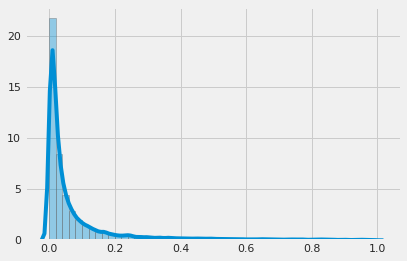

ROC_AUC_test:  0.8800758561555039
Brier_Score_test:  0.057869009151964974
Accuracy Score_Test: 0.924
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     20950
           1       0.63      0.27      0.38      1979

    accuracy                           0.92     22929
   macro avg       0.78      0.63      0.67     22929
weighted avg       0.91      0.92      0.91     22929



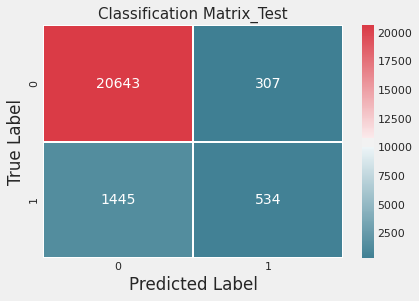



probability_distribution_train


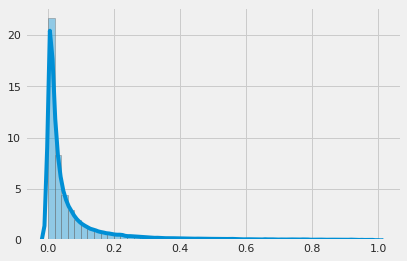

ROC_AUC_train:  0.8911317284014896
Brier_Score_train:  0.05590000652627167
Accuracy Score_Train: 0.927
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     62848
           1       0.67      0.30      0.41      5936

    accuracy                           0.93     68784
   macro avg       0.80      0.64      0.69     68784
weighted avg       0.91      0.93      0.91     68784



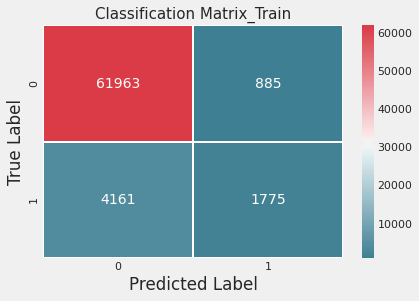

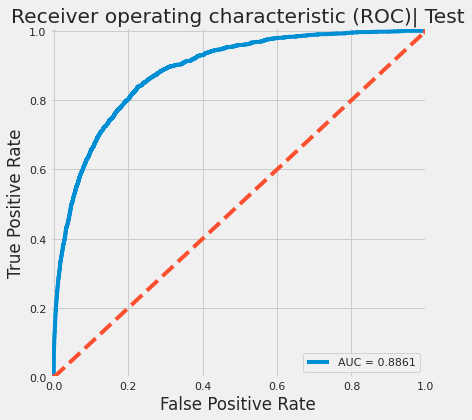

CPU times: user 16.4 s, sys: 1.2 s, total: 17.5 s
Wall time: 9.97 s


In [0]:
%time fit_predict_score(LR, X_train_pca, y_train_pca, X_test_pca, y_test_pca, threshold=0.5)

##### Adjust threshold: 90% quantile

probability_distribution_test


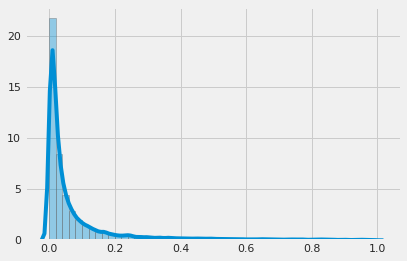

ROC_AUC_test:  0.8800758561555039
Brier_Score_test:  0.057869009151964974




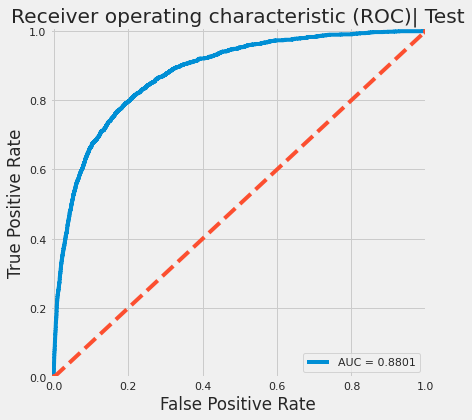

Accuracy Score_Test: 0.909
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.54      0.51      1979

    accuracy                           0.91     22929
   macro avg       0.72      0.74      0.73     22929
weighted avg       0.91      0.91      0.91     22929



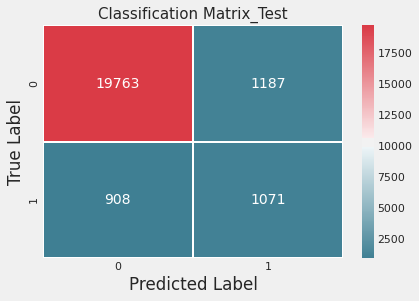



probability_distribution_train


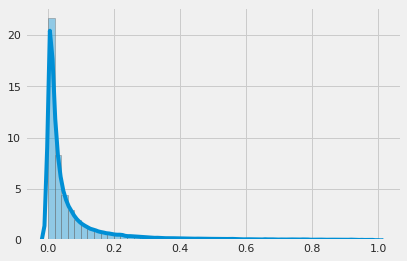

ROC_AUC_train:  0.8911317284014896
Brier_Score_train:  0.05590000652627167
Accuracy Score_Train: 0.909
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     62848
           1       0.48      0.55      0.51      5936

    accuracy                           0.91     68784
   macro avg       0.72      0.74      0.73     68784
weighted avg       0.91      0.91      0.91     68784



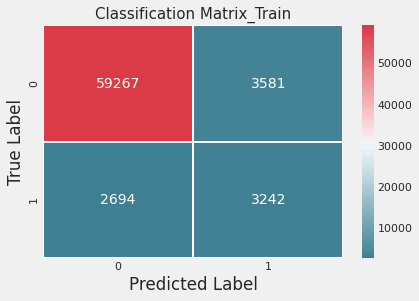

CPU times: user 15.8 s, sys: 1.06 s, total: 16.9 s
Wall time: 9.41 s


In [0]:
%time fit_predict_score(LR, X_train_pca, y_train_pca, X_test_pca, y_test_pca, threshold=0.23981632960878851)

In [0]:
LR_feature_importance(LR, X_train_pca)

,Coefficient,Importance,cumsum
apache_3j_diagnosis_1207.01,2.2,2.0,2.0
apache_3j_diagnosis_703.03,1.6,1.5,3.5
apache_3j_diagnosis_702.01,1.6,1.4,5.0
apache_3j_diagnosis_1502.02,1.3,1.2,6.1
apache_3j_diagnosis_1501.01,1.3,1.1,7.3
apache_3j_diagnosis_1206.03,1.2,1.1,8.3
apache_3j_diagnosis_202.01,1.1,1.0,9.3
apache_3j_diagnosis_306.01,1.0,0.9,10.2
apache_3j_diagnosis_401.01,0.9,0.8,11.1
apache_3j_diagnosis_601.01,0.9,0.8,11.9


___
### VIII. CATBOOST

In [0]:
f_drop = ['diff_max_bilirubin_24hr_1hr',
 'diff_h1_creatinine_max_min',
 'diff_h1_arterial_pco2_max_min',
 'gcs_unable_apache',
 'diff_h1_pao2fio2ratio_max_min',
 'lymphoma',
 'diff_h1_hco3_max_min',
 'diff_h1_calcium_max_min',
 'diff_h1_lactate_max_min',
 'diff_max_inr_24hr_1hr',
 'leukemia',
 'diff_h1_bilirubin_max_min',
 'diff_h1_albumin_max_min',
 'diff_h1_bun_max_min',
 'diff_min_inr_24hr_1hr',
 'aids',
 'diff_h1_inr_max_min',
 'apache_3j_diagnosis',
 'hospital_id',
 'apache_4a_icu_death_prob',
 'apache_4a_hospital_death_prob',
 'apache_2_diagnosis',
 'patient_id',
 'hospital_death',
 'icu_id']

In [33]:
h1_cols = [c for c in df.columns if (c.lower()[:7] == 'diff_h1')]
f_drop.extend(h1_cols)
cols = [ x for x in wt_hd_apache.columns.tolist() if x not in f_drop]
cols

['age',
 'bmi',
 'elective_surgery',
 'ethnicity',
 'gender',
 'height',
 'hospital_admit_source',
 'icu_admit_source',
 'icu_stay_type',
 'icu_type',
 'pre_icu_los_days',
 'weight',
 'apache_post_operative',
 'arf_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'intubated_apache',
 'map_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'solid_tumor_with_metastasis',
 'apache_3j_bodysystem',
 'missing_features',
 'num_disease',
 'diff_d1_diasbp_max_min',
 'diff_d1_heartrate_max_min',
 'diff_d1_mbp_max_min',
 'diff_d1_resprate_max_min',
 'diff_d1_spo2_max_min',
 'diff_d1_sysbp_max_min',
 'diff_d1_temp_max_min',
 'diff_d1_albumin_max_min',
 'diff_d1_bilirubin_max_min',
 'diff_d1_bun_max_min',
 'diff_d1_calcium_max_min',
 'diff_d1_creatinine_max_min',
 'diff_d1_glucose_max_min',
 'diff_d1_hco3_max_min',
 'diff_d1_hemaglobin_max_min',
 'diff_d1_hematocrit_max_min',
 'diff_d1_inr_max_

In [0]:
columns_to_encode = df_wt_hd.select_dtypes(include='category').columns.values.tolist()
not_used = ['lymphoma', 'leukemia', 'aids', 'gcs_unable_apache', 'arf_apache', 'apache_3j_diagnosis']
encode = [x for x in columns_to_encode if x not in not_used]
pred_col = ['hospital_death']
columns_to_scale = [ x for x in cols if (x not in encode) & (x not in pred_col)]
cols.append('hospital_death')

In [0]:
df_model = df_wt_hd[cols]

In [0]:
from sklearn.model_selection import train_test_split

X = df_model.drop(['hospital_death'],axis=1)
y = df_model['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)

In [0]:
# Import libraries and download example data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train[columns_to_scale])

#transform

X_train_scl = pd.DataFrame(scaler.transform(X_train[columns_to_scale]) , columns= columns_to_scale)
X_test_scl = pd.DataFrame(scaler.transform(X_test[columns_to_scale]), columns= columns_to_scale)
 
X_train_scl = X_train_scl.fillna(0)
X_test_scl = X_test_scl.fillna(0)

X_train_encode = X_train[encode].reset_index()
X_test_encode = X_test[encode].reset_index()

X_train = pd.merge(X_train_scl, X_train_encode, left_index=True, right_index=True, copy=True)
X_test = pd.merge(X_test_scl, X_test_encode, left_index=True, right_index=True, copy=True)

X_train.drop(columns=['index'], inplace=True)
X_test.drop(columns=['index'], inplace=True)

In [0]:
! pip install catboost

In [0]:
from catboost import Pool, cv, CatBoostClassifier, CatBoostRegressor

In [0]:
cat_cols =  X_train.select_dtypes(include='category').columns.values.tolist()
for col in cat_cols: 
    if col in X_train.columns: 
        le = LabelEncoder() 
        le.fit(list(X_train[col].astype(str).values) + list(X_test[col].astype(str).values)) 
        X_train[col] = le.transform(list(X_train[col].astype(str).values)) 
        X_test[col] = le.transform(list(X_test[col].astype(str).values)) 

In [0]:
for i in cat_cols:
    print(X_train[i].unique())

In [0]:
## catBoost Pool object
train_pool = Pool(data=X_train,label = y_train,cat_features=cat_cols)

In [42]:
model_basic = CatBoostClassifier(verbose=True,iterations=50, custom_metric='AUC')
%time model_basic.fit(train_pool, plot=True,silent=True)
print(model_basic.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

CPU times: user 10.7 s, sys: 873 ms, total: 11.5 s
Wall time: 6.19 s
{'learn': {'Logloss': 0.17606808592472029}}


#### GRID_SEARCH

In [0]:
### hyperparameter tuning example grid for catboost : 
grid = {'learning_rate': [0.04, 0.1],
        'depth': [7, 11],
#       'l2_leaf_reg': [1, 3,9],
#       'iterations': [500],
        'custom_metric':['AUC']}

model = CatBoostClassifier()

## can also do randomized search - more efficient typically, especially for large search space - `randomized_search`
%time grid_search_result = model.grid_search(grid, train_pool,plot=True,refit = True, partition_random_seed=911)

print(model.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	loss: 0.2027710	best: 0.2027710 (0)	total: 3m 18s	remaining: 9m 56s
1:	loss: 0.2055029	best: 0.2027710 (0)	total: 6m 39s	remaining: 6m 39s
2:	loss: 0.2054379	best: 0.2027710 (0)	total: 19m 3s	remaining: 6m 21s
3:	loss: 0.2069747	best: 0.2027710 (0)	total: 31m 6s	remaining: 0us
Estimating final quality...
CPU times: user 1h 22min 31s, sys: 3min 4s, total: 1h 25min 35s
Wall time: 44min 53s
{'learn': {'Logloss': 0.14073060081562278}}


In [0]:
print("best model params: \n",grid_search_result["params"])

In [44]:
# Using best model from Grid Search
model = CatBoostClassifier(verbose=True,depth=7, learning_rate = 0.04, custom_metric='AUC')
%time model.fit(train_pool, plot=True,silent=True)
print(model.get_best_score())

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

CPU times: user 7min 45s, sys: 27.3 s, total: 8min 12s
Wall time: 4min 18s
{'learn': {'Logloss': 0.14073060081562278}}


In [45]:
feature_importances = model.get_feature_importance(train_pool)
feature_names = X_train.columns
for score, name in sorted(zip(feature_importances, feature_names), reverse=True):
    # if score > 0.05:
        print('{0}: {1:.2f}'.format(name, score))

age: 7.41
ventilated_apache: 4.60
gcs_motor_apache: 3.71
diff_d1_spo2_max_min: 3.20
apache_3j_bodysystem: 3.16
gcs_verbal_apache: 3.01
icu_admit_source: 2.85
map_apache: 2.44
elective_surgery: 2.40
pre_icu_los_days: 2.19
gcs_eyes_apache: 1.96
diff_d1_temp_max_min: 1.96
diff_max_wbc_24hr_1hr: 1.87
missing_features: 1.83
pulse_pressure_min: 1.80
diff_max_bun_24hr_1hr: 1.68
diff_min_bun_24hr_1hr: 1.49
urineoutput_apache: 1.47
diff_max_sodium_24hr_1hr: 1.41
pulse_pressure_max: 1.40
diff_max_creatinine_24hr_1hr: 1.39
bmi: 1.38
diff_min_glucose_24hr_1hr: 1.38
diff_min_heartrate_24hr_1hr: 1.38
diff_d1_heartrate_max_min: 1.37
diff_min_wbc_24hr_1hr: 1.24
diff_min_hematocrit_24hr_1hr: 1.20
apache_post_operative: 1.18
diff_min_hco3_24hr_1hr: 1.15
diff_min_platelets_24hr_1hr: 1.14
diff_min_resprate_24hr_1hr: 1.11
diff_min_creatinine_24hr_1hr: 1.09
diff_d1_lactate_max_min: 1.08
diff_max_temp_24hr_1hr: 1.00
diff_d1_pao2fio2ratio_max_min: 0.97
diff_min_hemaglobin_24hr_1hr: 0.94
diff_min_spo2_24hr_1hr

In [48]:
dataset = pd.DataFrame({'feature_names': list(np.array(feature_names)), 'feature_importances': feature_importances, }, columns=['feature_names', 'feature_importances'])
dataset.sort_values('feature_importances', ascending = False)

,feature_names,feature_importances
0,age,7.4
100,ventilated_apache,4.6
97,gcs_motor_apache,3.7
14,diff_d1_spo2_max_min,3.2
106,apache_3j_bodysystem,3.2
98,gcs_verbal_apache,3.0
92,icu_admit_source,2.8
6,map_apache,2.4
88,elective_surgery,2.4
3,pre_icu_los_days,2.2


In [0]:
pred_on_test = model.predict(X_test,prediction_type='Probability')[:,1]

In [61]:
threshold_check = pd.DataFrame(pred_on_test).quantile(0.90)[0]
threshold_check

0.2254046104352083

probability_distribution


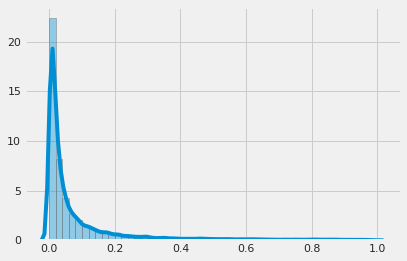

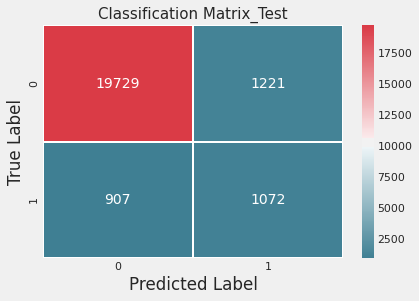



ROC_AUC score_Test: 0.8846716779164521
Brier_Score_Test:  0.056680594142657685
Accuracy Score_Test: 0.907
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.47      0.54      0.50      1979

    accuracy                           0.91     22929
   macro avg       0.71      0.74      0.73     22929
weighted avg       0.91      0.91      0.91     22929

------------------------------------------------------------------------------------------


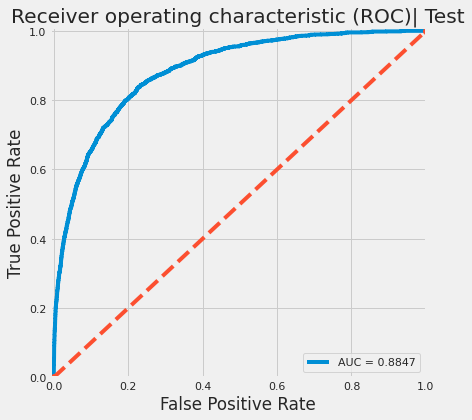

In [64]:
matrix_report_cat(y_test, pred_on_test, X_train, y_train, threshold = threshold_check)

#### SHAPLEY EXPLANATOR

In [0]:
! pip install shap

In [0]:
import shap
shap.initjs()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(train_pool)

# visualize the training set predictions
# SHAP plots for all the data is very slow, so we'll only do it for a sample. Taking the head instead of a random sample is dangerous! 
shap.force_plot(explainer.expected_value,shap_values[0,:400], X_train.iloc[0,:400])

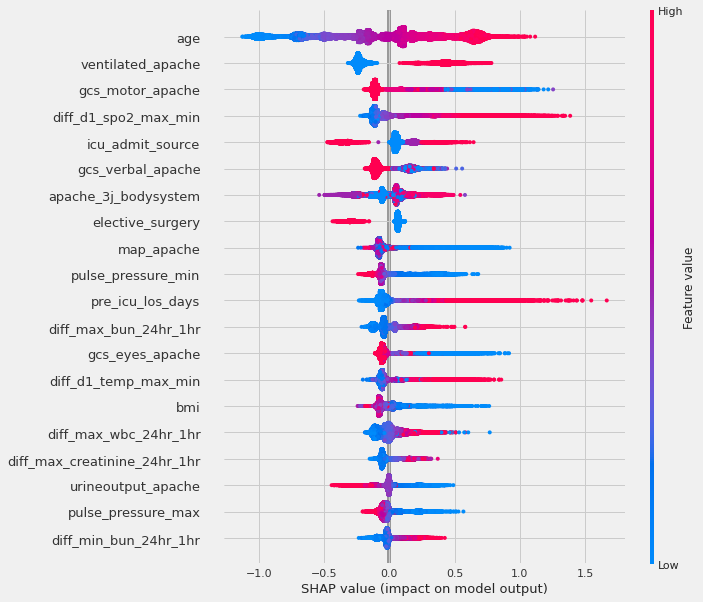

In [0]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train)

___
### IX. PCA + Neural NetWork

In this section, we try 2 versions of feature:
- Version 1. Drop d1 (24hrs), just keep the difference bt 1h-24h and difference  bt max-min
- Version 2. Keep d1 (24hrs), difference bt 1h-24h, drop diff bt max-min of 1st hour. Using apache_3j_diagnosis instead of apche_3j_bodysystem

The results suggest that version 2 gave a better performance

___
#### 9.1 JUST KEEP DIFF BT 1H-24HR AND MAX MIN
___

In [0]:
#df_wt_hd = pd.read_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/df_wt_hd.csv',index_col = 0)
wt_hd_apache = pd.read_csv('/content/drive/My Drive/Healthcare/Data/For_Modeling/Final/wt_hd_apache.csv',index_col = 0)

In [0]:
comorbidity =['cirrhosis','diabetes_mellitus','hepatic_failure','immunosuppression','leukemia','lymphoma','solid_tumor_with_metastasis','elective_surgery','aids']
for i in comorbidity:
  df_wt_hd[i]=df_wt_hd[i].astype('category')

demo = ['ethnicity','gender','hospital_admit_source','icu_stay_type','icu_admit_source','icu_type'] 
for i in demo:
  df_wt_hd[i]=df_wt_hd[i].astype('category')


gcs = ['gcs_eyes_apache','gcs_motor_apache','gcs_verbal_apache','gcs_unable_apache']
for i in gcs:
  df_wt_hd[i]=df_wt_hd[i].astype('category')


for i in ['intubated_apache','arf_apache','ventilated_apache']:
  df_wt_hd[i]=df_wt_hd[i].astype('category')

df_wt_hd['apache_3j_bodysystem'] =df_wt_hd['apache_3j_bodysystem'].astype('category')
df_wt_hd['apache_3j_diagnosis'] =df_wt_hd['apache_3j_diagnosis'].astype('category')
df_wt_hd['apache_post_operative'] =df_wt_hd['apache_post_operative'].astype('category')

In [0]:
f_drop = ['diff_max_bilirubin_24hr_1hr',
 'diff_h1_creatinine_max_min',
 'diff_h1_arterial_pco2_max_min',
 'gcs_unable_apache',
 'diff_h1_pao2fio2ratio_max_min',
 'lymphoma',
 'diff_h1_hco3_max_min',
 'diff_h1_calcium_max_min',
 'diff_h1_lactate_max_min',
 'diff_max_inr_24hr_1hr',
 'leukemia',
 'diff_h1_bilirubin_max_min',
 'diff_h1_albumin_max_min',
 'diff_h1_bun_max_min',
 'diff_min_inr_24hr_1hr',
 'aids',
 'diff_h1_inr_max_min',
 'patient_id',
 'apache_2_diagnosis',
 'icu_id',
 'hospital_id',
 'hospital_death',
 'apache_3j_diagnosis',
 'apache_4a_hospital_death_prob',
 'apache_4a_icu_death_prob', 
 'hospital_id',
 'patient_id',
 'hospital_death',
 'icu_id',
 ]
h1_cols = [c for c in df_wt_hd.columns if (c.lower()[:7] == 'diff_h1')]
f_drop.extend(h1_cols)
cols = [ x for x in wt_hd_apache.columns.tolist() if x not in f_drop]
cols

['age',
 'bmi',
 'elective_surgery',
 'ethnicity',
 'gender',
 'height',
 'hospital_admit_source',
 'icu_admit_source',
 'icu_stay_type',
 'icu_type',
 'pre_icu_los_days',
 'weight',
 'apache_post_operative',
 'arf_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'intubated_apache',
 'map_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'solid_tumor_with_metastasis',
 'apache_3j_bodysystem',
 'missing_features',
 'num_disease',
 'diff_d1_diasbp_max_min',
 'diff_d1_heartrate_max_min',
 'diff_d1_mbp_max_min',
 'diff_d1_resprate_max_min',
 'diff_d1_spo2_max_min',
 'diff_d1_sysbp_max_min',
 'diff_d1_temp_max_min',
 'diff_d1_albumin_max_min',
 'diff_d1_bilirubin_max_min',
 'diff_d1_bun_max_min',
 'diff_d1_calcium_max_min',
 'diff_d1_creatinine_max_min',
 'diff_d1_glucose_max_min',
 'diff_d1_hco3_max_min',
 'diff_d1_hemaglobin_max_min',
 'diff_d1_hematocrit_max_min',
 'diff_d1_inr_max_

In [0]:
columns_to_encode = df_wt_hd.select_dtypes(include='category').columns.values.tolist()
not_used = ['lymphoma', 'leukemia', 'aids', 'gcs_unable_apache', 'arf_apache', 'apache_3j_diagnosis']
encode = [x for x in columns_to_encode if x not in not_used]
pred_col = ['hospital_death']
columns_to_scale = [ x for x in cols if (x not in encode) & (x not in pred_col)]
cols.append('hospital_death')

In [0]:
df_model = df_wt_hd[cols]
df_encode =pd.get_dummies(df_model[encode])
dummies_col =[i for i in df_encode.columns]
df_model = pd.merge(df_model, df_encode, left_index=True, right_index=True, copy=True)
df_model.drop(encode,axis=1,inplace=True)
df_model = df_model.fillna(99)

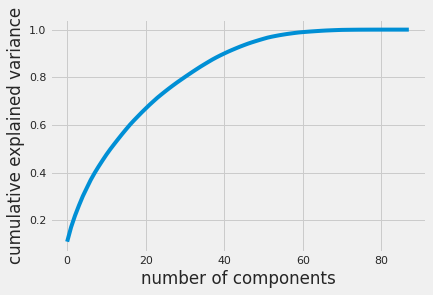

In [0]:
# Scale
scaler = StandardScaler()
scaler.fit(df_model[columns_to_scale])

#transform
df_model_scl = pd.DataFrame(scaler.transform(df_model[columns_to_scale]) , columns= columns_to_scale)
df_model_encode = df_model[dummies_col].reset_index()

# PCA
from sklearn.decomposition import PCA
pca = PCA()
principalComponents = pca.fit_transform(df_model_scl)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [0]:
principal_df = pd.DataFrame(data = principalComponents)
df_scl_pca = principal_df.copy()

df_model_pca = pd.merge(df_scl_pca, df_model_encode, left_index=True, right_index=True, copy=True)
df_model_pca.drop(columns=['index'], inplace=True)
df_model_pca.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,elective_surgery_0,elective_surgery_1,ethnicity_African American,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_F,gender_M,hospital_admit_source_Acute Care/Floor,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_admit_source_Accident & Emergency,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_stay_type_admit,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_post_operative_0,apache_post_operative_1,gcs_eyes_apache_1.0,gcs_eyes_apache_2.0,gcs_eyes_apache_3.0,gcs_eyes_apache_4.0,gcs_eyes_apache_99.0,gcs_motor_apache_1.0,gcs_motor_apache_2.0,gcs_motor_apache_3.0,gcs_motor_apache_4.0,gcs_motor_apache_5.0,gcs_motor_apache_6.0,gcs_motor_apache_99.0,gcs_verbal_apache_1.0,gcs_verbal_apache_2.0,gcs_verbal_apache_3.0,gcs_verbal_apache_4.0,gcs_verbal_apache_5.0,gcs_verbal_apache_99.0,intubated_apache_0.0,intubated_apache_1.0,intubated_apache_99.0,ventilated_apache_0.0,ventilated_apache_1.0,ventilated_apache_99.0,cirrhosis_0.0,cirrhosis_1.0,diabetes_mellitus_0.0,diabetes_mellitus_1.0,hepatic_failure_0.0,hepatic_failure_1.0,immunosuppression_0.0,immunosuppression_1.0,solid_tumor_with_metastasis_0.0,solid_tumor_with_metastasis_1.0,apache_3j_bodysystem_Cardiovascular,apache_3j_bodysystem_Gastrointestinal,apache_3j_bodysystem_Genitourinary,apache_3j_bodysystem_Gynecological,apache_3j_bodysystem_Hematological,apache_3j_bodysystem_Metabolic,apache_3j_bodysystem_Musculoskeletal/Skin,apache_3j_bodysystem_Neurological,apache_3j_bodysystem_Respiratory,apache_3j_bodysystem_Sepsis,apache_3j_bodysystem_Trauma,apache_3j_bodysystem_Undefined
0,0.5,3.2,0.8,-1.4,1.4,1.8,-0.0,-3.7,0.3,-0.5,-0.1,-0.3,-0.3,0.7,-1.1,1.3,1.0,1.0,-0.2,-0.5,-0.1,-0.3,-0.1,0.1,-0.8,1.5,-0.0,0.6,0.3,-0.1,-0.6,0.7,-0.7,-0.3,-0.3,0.6,-1.0,0.4,-1.9,-0.2,1.8,0.5,0.7,-1.1,0.2,-0.4,0.1,-0.9,0.2,0.5,-0.5,-0.4,-0.2,0.6,-0.0,-0.5,0.5,-0.2,0.0,1.3,-0.9,0.1,0.2,-0.1,-0.3,-0.2,-0.1,-0.1,-0.1,1.4,0.1,-0.0,-0.0,0.1,0.0,-0.1,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,7.9,1.3,-2.7,1.6,-0.1,-2.9,-0.3,-1.3,0.6,-0.3,-0.0,-0.4,-1.9,1.1,-1.2,-1.4,-0.9,-0.4,2.9,0.1,-1.3,1.3,-1.6,0.9,0.5,-0.5,0.5,-1.0,-0.7,2.5,-1.3,0.9,-0.8,1.1,-1.3,-0.0,-0.4,-0.8,-0.4,0.4,1.2,1.1,0.5,-0.5,-1.2,2.1,0.6,0.6,-1.2,-0.8,0.3,-0.5,0.5,0.3,0.2,-0.6,0.1,-0.6,-0.2,0.8,-1.0,0.1,0.2,-0.1,0.1,-0.2,0.0,0.0,-0.0,-0.2,0.4,-0.1,-0.1,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.1,-0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0


##### Split data

In [0]:
from sklearn.model_selection import train_test_split

X = df_model_pca
y = df_model['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)


# X_trainNorm = X_train[y_train == 0]
# X_trainNorm_val = X_trainNorm.values 
# X_testNorm_val = X_test[y_test == 0].values 

In [0]:
print(X_train.shape)
print(X_trainNorm.shape)
print(X_trainNorm_val.shape)
print(X_testNorm_val.shape)
print(y_train.shape)
print(y_test.shape)

(68784, 177)
(62848, 177)
(62848, 177)
(20950, 177)
(68784,)
(22929,)


##### Neural Net

In [0]:
def create_model(input_dim):
    input_layer = Input(shape=(input_dim, ))
    classifier = Dense(256, activation='relu')(input_layer)
    classifier = Dense(128, activation='relu')(input_layer)
    classifier = Dropout(0.5)(classifier)
    classifier = Dense(1, activation='sigmoid')(classifier)
    classModel = Model(inputs=input_layer, outputs=classifier)
    classModel.compile(optimizer='adam', loss='mean_squared_error')
    return classModel

In [0]:
input_dim = X_trainNorm_val.shape[1]
layer1_dim = 20
encoder_dim = 2

classModel=create_model(input_dim)
classModel.summary()





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 177)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               22784     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 129       
Total params: 22,913
Trainable params: 22,913
Non-trainable params: 0
_________________________________________________________________


In [0]:
from keras.optimizers import Adam
nb_epoch = 50
batch_size = 256
adam = Adam(lr=0.0005)

earlystopping = EarlyStopping(monitor='val_loss', patience=4, verbose=0)
checkpointer = ModelCheckpoint(filepath="classifier.h5",
                               verbose=0,
                               save_best_only=True)

class_history = classModel.fit(X_train, y_train,
                    epochs=nb_epoch,
                    batch_size=batch_size,
                    shuffle=True,
                    validation_data=(X_test, y_test),
                    verbose=1,
                    callbacks=[earlystopping, checkpointer]).history




Train on 68784 samples, validate on 22929 samples
Epoch 1/50





68784/68784 [==============================] - 10s 143us/step - loss: 0.0736 - val_loss: 0.0631
Epoch 2/50
68784/68784 [==============================] - 1s 17us/step - loss: 0.0627 - val_loss: 0.0612
Epoch 3/50
68784/68784 [==============================] - 1s 17us/step - loss: 0.0600 - val_loss: 0.0599
Epoch 4/50
68784/68784 [==============================] - 1s 16us/step - loss: 0.0588 - val_loss: 0.0593
Epoch 5/50
68784/68784 [==============================] - 1s 16us/step - loss: 0.0579 - val_loss: 0.0590
Epoch 6/50
68784/68784 [==============================] - 1s 17us/step - loss: 0.0565 - val_loss: 0.0588
Epoch 7/50
68784/68784 [==============================] - 1s 17us/step - loss: 0.0558 - val_loss: 0.0587
Epoch 8/50
68784/68784 [==============================] - 1s 16us/step - loss: 0.0554 - val_loss: 0.0586
Epoch 9/50
68784/68784 [==============================] - 1s 16us/step - loss: 0.0544 - val_loss: 0.

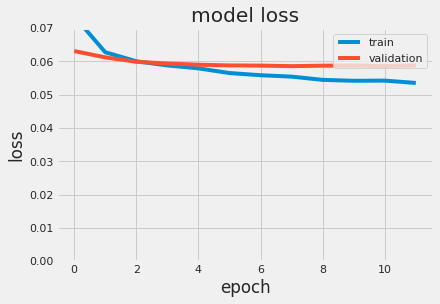

In [0]:
plt.plot(class_history['loss'])
plt.plot(class_history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.ylim(0,0.07);

In [0]:
fittedClassifier = load_model('classifier.h5')
testProb = fittedClassifier.predict(X_test)

testProb = testProb[:,0]
class_prob_df = pd.DataFrame({'probabilities': testProb,
                        'true_class': y_test})

class_prob_df

,probabilities,true_class
53993,0.0,0
12084,0.0,0
30032,0.0,0
26541,0.0,0
87066,0.0,0
...,...,...
42281,0.0,0
28600,0.0,0
2470,0.0,0
61009,0.2,1


In [0]:
class_prob_df[class_prob_df['true_class']==1].shape
class_prob_df.probabilities.describe()

count   22929.0
mean    0.1    
std     0.1    
min     0.0    
25%     0.0    
50%     0.0    
75%     0.1    
max     1.0    
Name: probabilities, dtype: float64

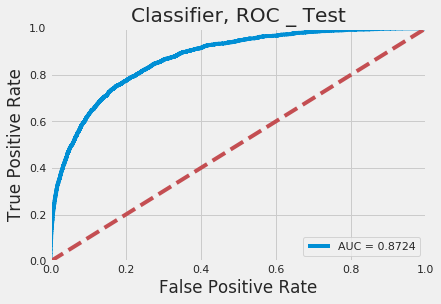

In [0]:
fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
roc_auc = auc(fpr, tpr)

plt.title('Classifier, ROC _ Test')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

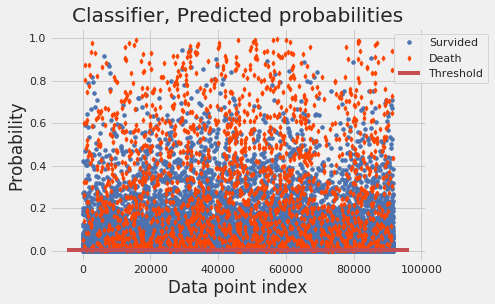

In [0]:
class_threshold = 0.001
groups = class_prob_df.groupby('true_class')
fig, ax = plt.subplots()

for name, group in groups:
    if name == 1:
        MarkerSize = 3.5
        Color = 'orangered'
        Label = 'Death'
        Marker = 'd'
    else:
        MarkerSize = 3.5
        Color = 'b'
        Label = 'Survided'
        Marker = 'o'
    ax.plot(group.index, group.probabilities, 
            linestyle='',
            color=Color,
            label=Label,
            ms=MarkerSize,
            marker=Marker)
ax.hlines(class_threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="r", zorder=100, label='Threshold')
ax.legend(bbox_to_anchor=(0.9, 1))
plt.title("Classifier, Predicted probabilities")
plt.ylabel("Probability")
plt.xlabel("Data point index")
plt.show();

In [0]:
threshold = class_prob_df.probabilities.quantile(q=0.90)
threshold

0.24306445717811587

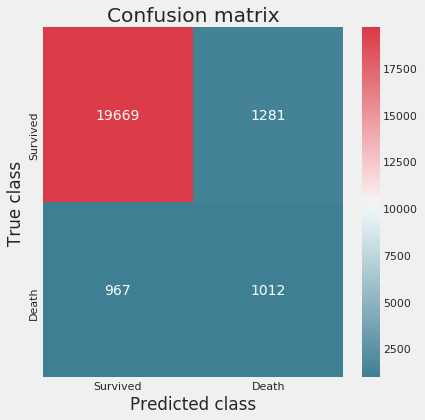

ROC_AUC score_Test: 0.7251118968742198
Brier_Score_Test:  0.09804178115050809
Accuracy Score_Test: 0.902
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.95      0.94      0.95     20950
           1       0.44      0.51      0.47      1979

    accuracy                           0.90     22929
   macro avg       0.70      0.73      0.71     22929
weighted avg       0.91      0.90      0.91     22929



In [0]:
#  threshold = 0.4
y_pred = [1 if e > threshold else 0 for e in class_prob_df.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

print("ROC_AUC score_Test:",roc_auc_score(y_true=y_test,y_score=y_pred))
print('Brier_Score_Test: ',brier_score_loss(y_test,y_pred))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred))

____
#### 9.2 DATA KEEP: D1, DROP H1, KEEP DIFF BT 1HR-24HR + SUB CATEGORY OF APACHE_3J_DIAGNOSIS
____

In [0]:
df_wt_h.head(2)

,hospital_id,patient_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,icu_stay_type,icu_type,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,gcs_eyes_apache,gcs_motor_apache,gcs_unable_apache,gcs_verbal_apache,intubated_apache,map_apache,urineoutput_apache,ventilated_apache,d1_diasbp_max,d1_diasbp_min,d1_heartrate_max,d1_heartrate_min,d1_mbp_max,d1_mbp_min,d1_resprate_max,d1_resprate_min,d1_spo2_max,d1_spo2_min,d1_sysbp_max,d1_sysbp_min,d1_temp_max,d1_temp_min,d1_albumin_max,d1_albumin_min,d1_bilirubin_max,d1_bilirubin_min,d1_bun_max,d1_bun_min,d1_calcium_max,d1_calcium_min,d1_creatinine_max,d1_creatinine_min,d1_glucose_max,d1_glucose_min,d1_hco3_max,d1_hco3_min,d1_hemaglobin_max,d1_hemaglobin_min,d1_hematocrit_max,d1_hematocrit_min,d1_inr_max,d1_inr_min,d1_lactate_max,d1_lactate_min,d1_platelets_max,d1_platelets_min,d1_potassium_max,d1_potassium_min,d1_sodium_max,d1_sodium_min,d1_wbc_max,d1_wbc_min,d1_arterial_pco2_max,d1_arterial_pco2_min,d1_arterial_ph_max,d1_arterial_ph_min,d1_arterial_po2_max,d1_arterial_po2_min,d1_pao2fio2ratio_max,d1_pao2fio2ratio_min,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,missing_features,num_disease,diff_d1_diasbp_max_min,diff_d1_heartrate_max_min,diff_d1_mbp_max_min,diff_d1_resprate_max_min,diff_d1_spo2_max_min,diff_d1_sysbp_max_min,diff_d1_temp_max_min,diff_d1_albumin_max_min,diff_d1_bilirubin_max_min,diff_d1_bun_max_min,diff_d1_calcium_max_min,diff_d1_creatinine_max_min,diff_d1_glucose_max_min,diff_d1_hco3_max_min,diff_d1_hemaglobin_max_min,diff_d1_hematocrit_max_min,diff_d1_inr_max_min,diff_d1_lactate_max_min,diff_d1_platelets_max_min,diff_d1_potassium_max_min,diff_d1_sodium_max_min,diff_d1_wbc_max_min,diff_d1_arterial_pco2_max_min,diff_d1_arterial_ph_max_min,diff_d1_arterial_po2_max_min,diff_d1_pao2fio2ratio_max_min,diff_h1_diasbp_max_min,diff_h1_heartrate_max_min,diff_h1_mbp_max_min,diff_h1_resprate_max_min,diff_h1_spo2_max_min,diff_h1_sysbp_max_min,diff_h1_temp_max_min,diff_h1_albumin_max_min,diff_h1_bilirubin_max_min,diff_h1_bun_max_min,diff_h1_calcium_max_min,diff_h1_creatinine_max_min,diff_h1_glucose_max_min,diff_h1_hco3_max_min,diff_h1_hemaglobin_max_min,diff_h1_hematocrit_max_min,diff_h1_inr_max_min,diff_h1_lactate_max_min,diff_h1_platelets_max_min,diff_h1_potassium_max_min,diff_h1_sodium_max_min,diff_h1_wbc_max_min,diff_h1_arterial_pco2_max_min,diff_h1_arterial_ph_max_min,diff_h1_arterial_po2_max_min,diff_h1_pao2fio2ratio_max_min,pulse_pressure_min,pulse_pressure_max,diff_pulse_max_min,diff_max_diasbp_24hr_1hr,diff_max_heartrate_24hr_1hr,diff_max_mbp_24hr_1hr,diff_max_resprate_24hr_1hr,diff_max_spo2_24hr_1hr,diff_max_sysbp_24hr_1hr,diff_max_temp_24hr_1hr,diff_max_albumin_24hr_1hr,diff_max_bilirubin_24hr_1hr,diff_max_bun_24hr_1hr,diff_max_calcium_24hr_1hr,diff_max_creatinine_24hr_1hr,diff_max_glucose_24hr_1hr,diff_max_hco3_24hr_1hr,diff_max_hemaglobin_24hr_1hr,diff_max_hematocrit_24hr_1hr,diff_max_inr_24hr_1hr,diff_max_lactate_24hr_1hr,diff_max_platelets_24hr_1hr,diff_max_potassium_24hr_1hr,diff_max_sodium_24hr_1hr,diff_max_wbc_24hr_1hr,diff_max_arterial_pco2_24hr_1hr,diff_max_arterial_ph_24hr_1hr,diff_max_arterial_po2_24hr_1hr,diff_max_pao2fio2ratio_24hr_1hr,diff_min_diasbp_24hr_1hr,diff_min_heartrate_24hr_1hr,diff_min_mbp_24hr_1hr,diff_min_resprate_24hr_1hr,diff_min_spo2_24hr_1hr,diff_min_sysbp_24hr_1hr,diff_min_temp_24hr_1hr,diff_min_albumin_24hr_1hr,diff_min_bilirubin_24hr_1hr,diff_min_bun_24hr_1hr,diff_min_calcium_24hr_1hr,diff_min_creatinine_24hr_1hr,diff_min_glucose_24hr_1hr,diff_min_hco3_24hr_1hr,diff_min_hemaglobin_24hr_1hr,diff_min_hematocrit_24hr_1hr,diff_min_inr_24hr_1hr,diff_min_lactate_24hr_1hr,diff_min_platelets_24hr_1hr,diff_min_potassium_24hr_1hr,diff_min_sodium_24hr_1hr,diff_min_wbc_24hr_1hr,diff_min_arterial_pco2_

In [0]:
comorbidity =['cirrhosis','diabetes_mellitus','hepatic_failure','immunosuppression','leukemia','lymphoma','solid_tumor_with_metastasis','elective_surgery','aids']
for i in comorbidity:
  df_wt_h[i]=df_wt_h[i].astype('category')

demo = ['ethnicity','gender','hospital_admit_source','icu_stay_type','icu_admit_source','icu_type'] 
for i in demo:
  df_wt_h[i]=df_wt_h[i].astype('category')


gcs = ['gcs_eyes_apache','gcs_motor_apache','gcs_verbal_apache','gcs_unable_apache']
for i in gcs:
  df_wt_h[i]=df_wt_h[i].astype('category')


for i in ['intubated_apache','arf_apache','ventilated_apache']:
  df_wt_h[i]=df_wt_h[i].astype('category')


df_wt_h['apache_3j_bodysystem'] =df_wt_h['apache_3j_bodysystem'].astype('category')
df_wt_h['apache_3j_diagnosis'] =df_wt_h['apache_3j_diagnosis'].astype('category')
df_wt_h['apache_post_operative'] =df_wt_h['apache_post_operative'].astype('category')
df_wt_h['missing_features'] =df_wt_h['missing_features'].astype('category')
df_wt_h['num_disease'] =df_wt_h['num_disease'].astype('category')

In [0]:
f_drop = ['diff_max_bilirubin_24hr_1hr',
 'diff_h1_creatinine_max_min',
 'diff_h1_arterial_pco2_max_min',
 'gcs_unable_apache',
 'diff_h1_pao2fio2ratio_max_min',
 'lymphoma',
 'diff_h1_hco3_max_min',
 'diff_h1_calcium_max_min',
 'diff_h1_lactate_max_min',
 'diff_max_inr_24hr_1hr',
 'leukemia',
 'diff_h1_bilirubin_max_min',
 'diff_h1_albumin_max_min',
 'diff_h1_bun_max_min',
 'diff_min_inr_24hr_1hr',
 'aids',
 'diff_h1_inr_max_min',
 'patient_id',
 'apache_2_diagnosis',
 'icu_id',
 'hospital_id',
 'hospital_death',
 'apache_3j_bodysystem',
 'apache_4a_hospital_death_prob',
 'apache_4a_icu_death_prob', 
 'hospital_id',
 'patient_id',
 'hospital_death',
 'icu_id',
 ]
h1_cols = [c for c in df_wt_h.columns if (c.lower()[:7] == 'diff_h1')]
f_drop.extend(h1_cols)
cols = [ x for x in df_wt_h.columns.tolist() if x not in f_drop]
cols

['age',
 'bmi',
 'elective_surgery',
 'ethnicity',
 'gender',
 'height',
 'hospital_admit_source',
 'icu_admit_source',
 'icu_stay_type',
 'icu_type',
 'pre_icu_los_days',
 'weight',
 'apache_3j_diagnosis',
 'apache_post_operative',
 'arf_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'intubated_apache',
 'map_apache',
 'urineoutput_apache',
 'ventilated_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max

In [0]:
columns_to_encode = df_wt_h.select_dtypes(include='category').columns.values.tolist()
not_used = ['lymphoma', 'leukemia', 'aids', 'gcs_unable_apache', 'arf_apache', 'apache_3j_bodysystem']
encode = [x for x in columns_to_encode if x not in not_used]
pred_col = ['hospital_death']
columns_to_scale = [ x for x in cols if (x not in encode) & (x not in pred_col)]
cols.append('hospital_death')

In [0]:
df_model = df_wt_h[cols]
df_encode =pd.get_dummies(df_model[encode])
dummies_col =[i for i in df_encode.columns]
df_model = pd.merge(df_model, df_encode, left_index=True, right_index=True, copy=True)
df_model.drop(encode,axis=1,inplace=True)

In [0]:
df_model = df_model.fillna(99)

___
#### 9.2.1 Standardize Data

In [0]:
# Import libraries and download example data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(df_model[columns_to_scale])

#transform

df_model_scl = pd.DataFrame(scaler.transform(df_model[columns_to_scale]) , columns= columns_to_scale)
df_model_encode = df_model[dummies_col].reset_index()

In [0]:
df_model_scl.columns.tolist()

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'arf_apache',
 'map_apache',
 'urineoutput_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max',
 'd1_inr_min',
 'd1_lactate_max',
 'd1_lactate_min',
 'd1_platelets_max',
 'd1_platelets_min',
 'd1_potassium_max',
 'd1_potassium_min',
 'd1_sodium_max',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'd1_arterial_pco2_max',
 'd1_arterial_pco2_min',
 'd1_arterial_ph_max',
 

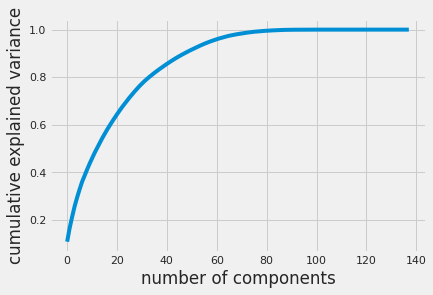

In [0]:
from sklearn.decomposition import PCA
pca = PCA()
principalComponents = pca.fit_transform(df_model_scl)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [0]:
principal_df = pd.DataFrame(data = principalComponents)
df_scl_pca = principal_df.loc[:,:70].copy()

df_model_pca = pd.merge(df_scl_pca, df_model_encode, left_index=True, right_index=True, copy=True)
df_model_pca.drop(columns=['index'], inplace=True)
df_model_pca.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,elective_surgery_0,elective_surgery_1,ethnicity_African American,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_F,gender_M,hospital_admit_source_Acute Care/Floor,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_admit_source_Accident & Emergency,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_stay_type_admit,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_diagnosis_0.01,apache_3j_diagnosis_0.02,apache_3j_diagnosis_0.03,apache_3j_diagnosis_0.04,apache_3j_diagnosis_0.06,apache_3j_diagnosis_0.09,apache_3j_diagnosis_0.11,apache_3j_diagnosis_0.13,apache_3j_diagnosis_0.14,apache_3j_diagnosis_0.15,apache_3j_diagnosis_0.18,apache_3j_diagnosis_0.19,apache_3j_diagnosis_0.2,apache_3j_diagnosis_0.21,apache_3j_diagnosis_0.22,apache_3j_diagnosis_0.23,apache_3j_diagnosis_0.24,apache_3j_diagnosis_0.25,apache_3j_diagnosis_101.01,apache_3j_diagnosis_101.02,apache_3j_diagnosis_102.01,apache_3j_diagnosis_102.02,apache_3j_diagnosis_103.01,apache_3j_diagnosis_104.01,apache_3j_diagnosis_105.01,apache_3j_diagnosis_105.02,apache_3j_diagnosis_106.01,apache_3j_diagnosis_107.01,apache_3j_diagnosis_108.01,apache_3j_diagnosis_109.01,apache_3j_diagnosis_109.02,apache_3j_diagnosis_109.03,apache_3j_diagnosis_109.04,apache_3j_diagnosis_109.05,apache_3j_diagnosis_109.06,apache_3j_diagnosis_109.07,apache_3j_diagnosis_109.08,apache_3j_diagnosis_109.09,apache_3j_diagnosis_109.1,apache_3j_diagnosis_109.11,apache_3j_diagnosis_109.12,apache_3j_diagnosis_109.13,apache_3j_diagnosis_109.14,apache_3j_diagnosis_109.15,apache_3j_diagnosis_109.16,apache_3j_diagnosis_110.01,apache_3j_diagnosis_111.01,apache_3j_diagnosis_201.01,apache_3j_diagnosis_202.01,apache_3j_diagnosis_203.01,apache_3j_diagnosis_204.01,apache_3j_diagnosis_206.01,apache_3j_diagnosis_207.01,apache_3j_diagnosis_208.01,apache_3j_diagnosis_209.01,apache_3j_diagnosis_210.01,apache_3j_diagnosis_210.02,apache_3j_diagnosis_211.01,apache_3j_diagnosis_211.02,apache_3j_diagnosis_211.03,apache_3j_diagnosis_211.04,apache_3j_diagnosis_211.05,apache_3j_diagnosis_211.06,apache_3j_diagnosis_211.07,apache_3j_diagnosis_211.08,apache_3j_diagnosis_211.09,apache_3j_diagnosis_211.1,apache_3j_diagnosis_211.11,apache_3j_diagnosis_211.12,apache_3j_diagnosis_212.01,apache_3j_diagnosis_212.02,apache_3j_diagnosis_213.01,apache_3j_diagnosis_301.01,apache_3j_diagnosis_301.02,apache_3j_diagnosis_301.03,apache_3j_diagnosis_301.04,apache_3j_diagnosis_303.01,apache_3j_diagnosis_305.01,apache_3j_diagnosis_305.02,apache_3j_diagnosis_306.01,apache_3j_diagnosis_307.01,apache_3j_diagnosis_307.02,apache_3j_diagnosis_307.03,apache_3j_diagnosis_307.04,apache_3j_diagnosis_307.05,apache_3j_diagnosis_308.01,apache_3j_diagnosis_309.01,apache_3j_diagnosis_310.01,apache_3j_diagnosis_311.01,apache_3j_diagnosis_312.01,apache_3j_diagnosis_312.02,apache_3j_diagnosis_312.03,apache_3j_diagnosis_312.04,apache_3j_diagnosis_312.05,apache_3j_diagnosis_313.01,apache_3j_diagnosis_313.02,apache_3j_diagnosis_313.03,apache_3j_diagnosis_313.04,apache_3j_diagnosis_313.05,apache_3j_diagnosis_401.01,apache_3j_diagnosis_402.01,apache_3j_diagnosis_402.02,apache_3

##### Split data

In [0]:
from sklearn.model_selection import train_test_split

X = df_model_pca
y = df_model['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)

# X_trainNorm = X_train[y_train == 0]
# X_trainNorm_val = X_trainNorm.values 
# X_testNorm_val = X_test[y_test == 0].values 

In [0]:
print(X_train.shape)
print(X_trainNorm.shape)
print(X_trainNorm_val.shape)
print(X_testNorm_val.shape)
print(y_train.shape)
print(y_test.shape)

(68784, 712)
(62848, 712)
(62848, 712)
(20950, 712)
(68784,)
(22929,)


##### Neural Network

In [0]:
def create_model(input_dim):
    input_layer = Input(shape=(input_dim, ))
    classifier = Dense(256, activation='relu')(input_layer)
    classifier = Dense(128, activation='relu')(input_layer)
    classifier = Dropout(0.5)(classifier)
    classifier = Dense(1, activation='sigmoid')(classifier)
    classModel = Model(inputs=input_layer, outputs=classifier)
    classModel.compile(optimizer='adam', loss='mean_squared_error')
    return classModel

In [0]:
input_dim = X_trainNorm_val.shape[1]
# layer1_dim = 20
# encoder_dim = 2
classModel=create_model(input_dim)
classModel.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 712)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 128)               91264     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 129       
Total params: 91,393
Trainable params: 91,393
Non-trainable params: 0
_________________________________________________________________


In [0]:
from keras.optimizers import Adam
nb_epoch = 50
batch_size = 128
adam = Adam(lr=0.0005)

earlystopping = EarlyStopping(monitor='val_loss', patience=4, verbose=0)
checkpointer = ModelCheckpoint(filepath="classifier.h5",
                               verbose=0,
                               save_best_only=True)

%time class_history = classModel.fit(X_train, y_train, epochs=nb_epoch, batch_size=batch_size, shuffle=True,validation_data=(X_test, y_test),verbose=1,callbacks=[earlystopping, checkpointer]).history

Train on 68784 samples, validate on 22929 samples
Epoch 1/50
68784/68784 [==============================] - 3s 41us/step - loss: 0.0647 - val_loss: 0.0580
Epoch 2/50
68784/68784 [==============================] - 3s 38us/step - loss: 0.0566 - val_loss: 0.0561
Epoch 3/50
68784/68784 [==============================] - 3s 37us/step - loss: 0.0544 - val_loss: 0.0552
Epoch 4/50
68784/68784 [==============================] - 3s 37us/step - loss: 0.0531 - val_loss: 0.0556
Epoch 5/50
68784/68784 [==============================] - 3s 37us/step - loss: 0.0519 - val_loss: 0.0553
Epoch 6/50
68784/68784 [==============================] - 3s 37us/step - loss: 0.0509 - val_loss: 0.0546
Epoch 7/50
68784/68784 [==============================] - 3s 37us/step - loss: 0.0501 - val_loss: 0.0555
Epoch 8/50
68784/68784 [==============================] - 3s 38us/step - loss: 0.0493 - val_loss: 0.0553
Epoch 9/50
68784/68784 [==============================] - 3s 38us/step - loss: 0.0483 - val_loss: 0.0550
Epoch

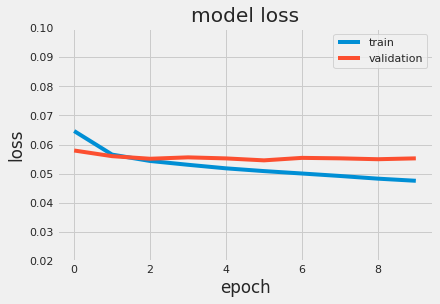

In [0]:
plt.plot(class_history['loss'])
plt.plot(class_history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.ylim(0.02,0.1);

###### Result on Test

In [0]:
fittedClassifier = load_model('classifier.h5')
testProb = fittedClassifier.predict(X_test)

testProb = testProb[:,0]
class_prob_df = pd.DataFrame({'probabilities': testProb,
                        'true_class': y_test})

class_prob_df

,probabilities,true_class
53993,0.0,0
12084,0.0,0
30032,0.0,0
26541,0.0,0
87066,0.0,0
...,...,...
42281,0.0,0
28600,0.0,0
2470,0.0,0
61009,0.4,1


In [0]:
class_prob_df[class_prob_df['true_class']==1].shape
class_prob_df.probabilities.describe()

count   22929.0
mean    0.1    
std     0.2    
min     0.0    
25%     0.0    
50%     0.0    
75%     0.1    
max     1.0    
Name: probabilities, dtype: float64

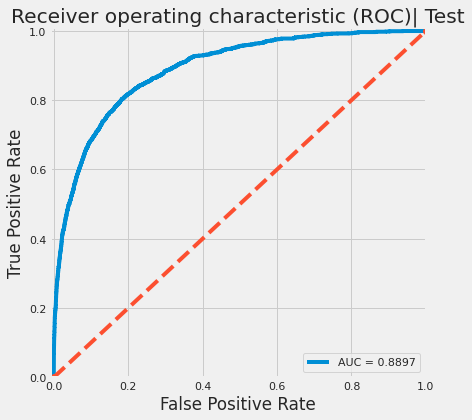

In [0]:
from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.title('Receiver operating characteristic (ROC)| Test')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'o--')
plt.xlim([-0.01, 1])
plt.ylim([0, 1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

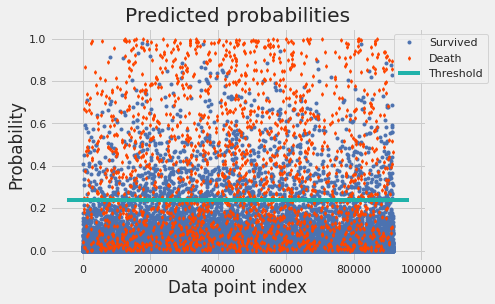

In [0]:
class_threshold = class_prob_df.probabilities.quantile(q=0.90)
groups = class_prob_df.groupby('true_class')
fig, ax = plt.subplots()

for name, group in groups:
    if name == 1:
        MarkerSize = 2.5
        Color = 'orangered'
        Label = 'Death'
        Marker = 'd'
    else:
        MarkerSize = 3.0
        Color = 'b'
        Label = 'Survived'
        Marker = 'o'
    ax.plot(group.index, group.probabilities, 
            linestyle='',
            color=Color,
            label=Label,
            ms=MarkerSize,
            marker=Marker)
ax.hlines(class_threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="lightseagreen", zorder=100, label='Threshold')
ax.legend(bbox_to_anchor=(0.9, 1))
plt.title("Predicted probabilities")
plt.ylabel("Probability")
plt.xlabel("Data point index")
plt.show();

In [0]:
threshold = class_prob_df.probabilities.quantile(q=0.90)
threshold

0.2402302503585817

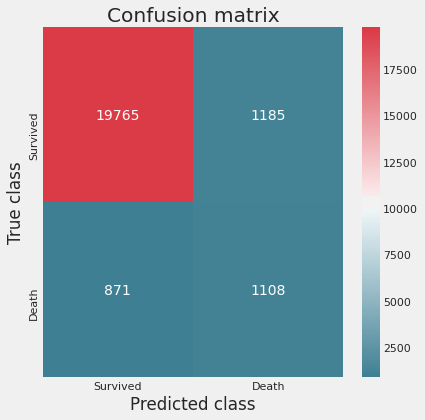

AUC score_Test: 0.889650157199521
Brier_Score_Test:  0.054617012667935366
Accuracy Score_Test: 0.91
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.48      0.56      0.52      1979

    accuracy                           0.91     22929
   macro avg       0.72      0.75      0.73     22929
weighted avg       0.92      0.91      0.91     22929



In [0]:
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Test:",auc(fpr, tpr))
print('Brier_Score_Test: ',brier_score_loss(y_test,class_prob_df.probabilities))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred))

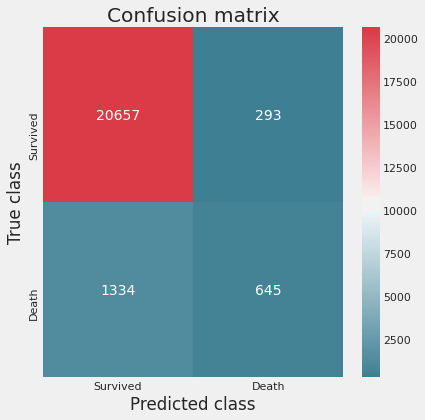

AUC score_Test: 0.889650157199521
Brier_Score_Test:  0.054617012667935366
Accuracy Score_Test: 0.929
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96     20950
           1       0.69      0.33      0.44      1979

    accuracy                           0.93     22929
   macro avg       0.81      0.66      0.70     22929
weighted avg       0.92      0.93      0.92     22929



In [0]:
threshold = 0.5
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Test:",auc(fpr, tpr))
print('Brier_Score_Test: ',brier_score_loss(y_test,class_prob_df.probabilities))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred))

###### Result on Train

In [0]:
fittedClassifier_train = load_model('classifier.h5')
testProb_train = fittedClassifier_train.predict(X_train)

testProb_train = testProb_train[:,0]
class_prob_df_train = pd.DataFrame({'probabilities': testProb_train,
                        'true_class': y_train})

class_prob_df_train

,probabilities,true_class
76096,0.0,0
1524,0.0,0
40194,0.0,0
84619,0.0,0
86775,1.0,1
...,...,...
73587,0.0,0
48650,1.0,1
5385,0.0,0
68076,0.0,0


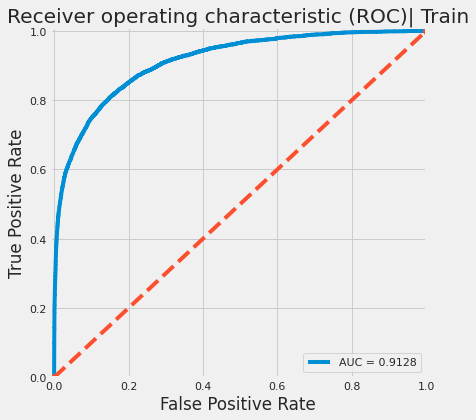

In [0]:
from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,6))
plt.title('Receiver operating characteristic (ROC)| Train')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'o--')
plt.xlim([-0.01, 1])
plt.ylim([0, 1.01])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

__Threshold: based on quantile__

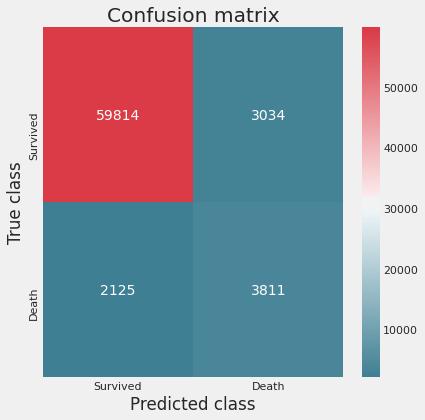

AUC score_Train: 0.9128309301571652
Brier_Score_Train:  0.04627119271603809
Accuracy Score_Train: 0.925
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96     62848
           1       0.56      0.64      0.60      5936

    accuracy                           0.92     68784
   macro avg       0.76      0.80      0.78     68784
weighted avg       0.93      0.92      0.93     68784



In [0]:
threshold = class_prob_df.probabilities.quantile(q=0.90)
threshold

LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df_train.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df_train.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Train:",auc(fpr, tpr))
print('Brier_Score_Train: ',brier_score_loss(y_train,class_prob_df_train.probabilities))
print("Accuracy Score_Train:", round(metrics.accuracy_score(y_train, y_pred),3))
print("Classification Report_Train:\n",metrics.classification_report(y_train,y_pred))

__Threshold: 0.5__

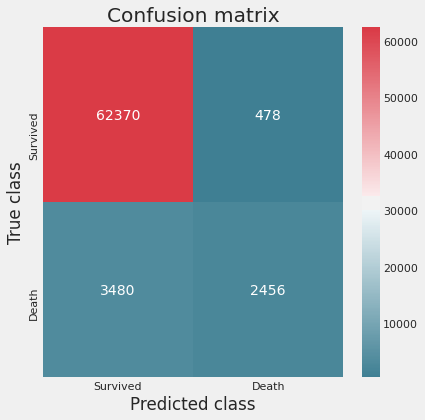

AUC score_Test: 0.9128309301571652
Brier_Score_Test:  0.04627119271603809
Accuracy Score_Test: 0.942
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     62848
           1       0.84      0.41      0.55      5936

    accuracy                           0.94     68784
   macro avg       0.89      0.70      0.76     68784
weighted avg       0.94      0.94      0.93     68784



In [0]:
threshold = 0.5
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df_train.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df_train.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Test:",auc(fpr, tpr))
print('Brier_Score_Test: ',brier_score_loss(y_train,class_prob_df_train.probabilities))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_train, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_train,y_pred))

___
#### 9.2.2 Min Max Scaler

In [0]:
# Import libraries and download example data
df_model = df_model.fillna(99)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(df_model[columns_to_scale])

#transform

df_model_scl = pd.DataFrame(scaler.transform(df_model[columns_to_scale]) , columns= columns_to_scale)
df_model_encode = df_model[dummies_col].reset_index()

In [0]:
df_model_scl.columns.tolist()

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'arf_apache',
 'map_apache',
 'urineoutput_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_temp_max',
 'd1_temp_min',
 'd1_albumin_max',
 'd1_albumin_min',
 'd1_bilirubin_max',
 'd1_bilirubin_min',
 'd1_bun_max',
 'd1_bun_min',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_creatinine_max',
 'd1_creatinine_min',
 'd1_glucose_max',
 'd1_glucose_min',
 'd1_hco3_max',
 'd1_hco3_min',
 'd1_hemaglobin_max',
 'd1_hemaglobin_min',
 'd1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_inr_max',
 'd1_inr_min',
 'd1_lactate_max',
 'd1_lactate_min',
 'd1_platelets_max',
 'd1_platelets_min',
 'd1_potassium_max',
 'd1_potassium_min',
 'd1_sodium_max',
 'd1_sodium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'd1_arterial_pco2_max',
 'd1_arterial_pco2_min',
 'd1_arterial_ph_max',
 

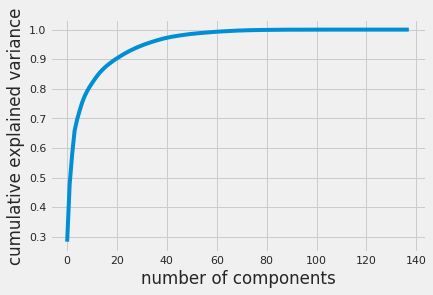

In [0]:
from sklearn.decomposition import PCA
pca = PCA()
principalComponents = pca.fit_transform(df_model_scl)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [0]:
principal_df = pd.DataFrame(data = principalComponents)
df_scl_pca = principal_df.loc[:,:70].copy()

df_model_pca = pd.merge(df_scl_pca, df_model_encode, left_index=True, right_index=True, copy=True)
df_model_pca.drop(columns=['index'], inplace=True)
df_model_pca.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,elective_surgery_0,elective_surgery_1,ethnicity_African American,ethnicity_Asian,ethnicity_Caucasian,ethnicity_Hispanic,ethnicity_Native American,ethnicity_Other/Unknown,gender_F,gender_M,hospital_admit_source_Acute Care/Floor,hospital_admit_source_Chest Pain Center,hospital_admit_source_Direct Admit,hospital_admit_source_Emergency Department,hospital_admit_source_Floor,hospital_admit_source_ICU,hospital_admit_source_ICU to SDU,hospital_admit_source_Observation,hospital_admit_source_Operating Room,hospital_admit_source_Other,hospital_admit_source_Other Hospital,hospital_admit_source_Other ICU,hospital_admit_source_PACU,hospital_admit_source_Recovery Room,hospital_admit_source_Step-Down Unit (SDU),icu_admit_source_Accident & Emergency,icu_admit_source_Floor,icu_admit_source_Operating Room / Recovery,icu_admit_source_Other Hospital,icu_admit_source_Other ICU,icu_stay_type_admit,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,apache_3j_diagnosis_0.01,apache_3j_diagnosis_0.02,apache_3j_diagnosis_0.03,apache_3j_diagnosis_0.04,apache_3j_diagnosis_0.06,apache_3j_diagnosis_0.09,apache_3j_diagnosis_0.11,apache_3j_diagnosis_0.13,apache_3j_diagnosis_0.14,apache_3j_diagnosis_0.15,apache_3j_diagnosis_0.18,apache_3j_diagnosis_0.19,apache_3j_diagnosis_0.2,apache_3j_diagnosis_0.21,apache_3j_diagnosis_0.22,apache_3j_diagnosis_0.23,apache_3j_diagnosis_0.24,apache_3j_diagnosis_0.25,apache_3j_diagnosis_101.01,apache_3j_diagnosis_101.02,apache_3j_diagnosis_102.01,apache_3j_diagnosis_102.02,apache_3j_diagnosis_103.01,apache_3j_diagnosis_104.01,apache_3j_diagnosis_105.01,apache_3j_diagnosis_105.02,apache_3j_diagnosis_106.01,apache_3j_diagnosis_107.01,apache_3j_diagnosis_108.01,apache_3j_diagnosis_109.01,apache_3j_diagnosis_109.02,apache_3j_diagnosis_109.03,apache_3j_diagnosis_109.04,apache_3j_diagnosis_109.05,apache_3j_diagnosis_109.06,apache_3j_diagnosis_109.07,apache_3j_diagnosis_109.08,apache_3j_diagnosis_109.09,apache_3j_diagnosis_109.1,apache_3j_diagnosis_109.11,apache_3j_diagnosis_109.12,apache_3j_diagnosis_109.13,apache_3j_diagnosis_109.14,apache_3j_diagnosis_109.15,apache_3j_diagnosis_109.16,apache_3j_diagnosis_110.01,apache_3j_diagnosis_111.01,apache_3j_diagnosis_201.01,apache_3j_diagnosis_202.01,apache_3j_diagnosis_203.01,apache_3j_diagnosis_204.01,apache_3j_diagnosis_206.01,apache_3j_diagnosis_207.01,apache_3j_diagnosis_208.01,apache_3j_diagnosis_209.01,apache_3j_diagnosis_210.01,apache_3j_diagnosis_210.02,apache_3j_diagnosis_211.01,apache_3j_diagnosis_211.02,apache_3j_diagnosis_211.03,apache_3j_diagnosis_211.04,apache_3j_diagnosis_211.05,apache_3j_diagnosis_211.06,apache_3j_diagnosis_211.07,apache_3j_diagnosis_211.08,apache_3j_diagnosis_211.09,apache_3j_diagnosis_211.1,apache_3j_diagnosis_211.11,apache_3j_diagnosis_211.12,apache_3j_diagnosis_212.01,apache_3j_diagnosis_212.02,apache_3j_diagnosis_213.01,apache_3j_diagnosis_301.01,apache_3j_diagnosis_301.02,apache_3j_diagnosis_301.03,apache_3j_diagnosis_301.04,apache_3j_diagnosis_303.01,apache_3j_diagnosis_305.01,apache_3j_diagnosis_305.02,apache_3j_diagnosis_306.01,apache_3j_diagnosis_307.01,apache_3j_diagnosis_307.02,apache_3j_diagnosis_307.03,apache_3j_diagnosis_307.04,apache_3j_diagnosis_307.05,apache_3j_diagnosis_308.01,apache_3j_diagnosis_309.01,apache_3j_diagnosis_310.01,apache_3j_diagnosis_311.01,apache_3j_diagnosis_312.01,apache_3j_diagnosis_312.02,apache_3j_diagnosis_312.03,apache_3j_diagnosis_312.04,apache_3j_diagnosis_312.05,apache_3j_diagnosis_313.01,apache_3j_diagnosis_313.02,apache_3j_diagnosis_313.03,apache_3j_diagnosis_313.04,apache_3j_diagnosis_313.05,apache_3j_diagnosis_401.01,apache_3j_diagnosis_402.01,apache_3j_diagnosis_402.02,apache_3

##### Split data

In [0]:
from sklearn.model_selection import train_test_split

X = df_model_pca
y = df_model['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=911)


X_trainNorm = X_train[y_train == 0]
X_trainNorm_val = X_trainNorm.values
X_testNorm_val = X_test[y_test == 0].values 

In [0]:
print(X_train.shape)
print(X_trainNorm.shape)
print(X_trainNorm_val.shape)
print(X_testNorm_val.shape)
print(y_train.shape)
print(y_test.shape)

(68784, 712)
(62848, 712)
(62848, 712)
(20950, 712)
(68784,)
(22929,)


##### Neural Network

In [0]:
def create_model(input_dim):
    input_layer = Input(shape=(input_dim, ))
    classifier = Dense(256, activation='relu')(input_layer)
    classifier = Dense(128, activation='relu')(input_layer)
    classifier = Dropout(0.5)(classifier)
    classifier = Dense(1, activation='sigmoid')(classifier)
    classModel = Model(inputs=input_layer, outputs=classifier)
    classModel.compile(optimizer='adam', loss='mean_squared_error')
    return classModel

In [0]:
input_dim = X_trainNorm_val.shape[1]
layer1_dim = 20
encoder_dim = 2

classModel=create_model(input_dim)
classModel.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 712)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 128)               91264     
_________________________________________________________________
dropout_4 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 129       
Total params: 91,393
Trainable params: 91,393
Non-trainable params: 0
_________________________________________________________________


In [0]:
from keras.optimizers import Adam
nb_epoch = 50
batch_size = 128
adam = Adam(lr=0.0005)

earlystopping = EarlyStopping(monitor='val_loss', patience=4, verbose=0)
checkpointer = ModelCheckpoint(filepath="classifier.h5",
                               verbose=0,
                               save_best_only=True)

%time class_history = classModel.fit(X_train, y_train, epochs=nb_epoch,batch_size=batch_size, shuffle=True, validation_data=(X_test, y_test), verbose=1,callbacks=[earlystopping, checkpointer]).history

Train on 68784 samples, validate on 22929 samples
Epoch 1/50
68784/68784 [==============================] - 4s 59us/step - loss: 0.0635 - val_loss: 0.0579
Epoch 2/50
68784/68784 [==============================] - 3s 50us/step - loss: 0.0573 - val_loss: 0.0574
Epoch 3/50
68784/68784 [==============================] - 4s 51us/step - loss: 0.0559 - val_loss: 0.0570
Epoch 4/50
68784/68784 [==============================] - 4s 51us/step - loss: 0.0549 - val_loss: 0.0569
Epoch 5/50
68784/68784 [==============================] - 4s 51us/step - loss: 0.0539 - val_loss: 0.0565
Epoch 6/50
68784/68784 [==============================] - 4s 52us/step - loss: 0.0528 - val_loss: 0.0564
Epoch 7/50
68784/68784 [==============================] - 4s 51us/step - loss: 0.0517 - val_loss: 0.0564
Epoch 8/50
68784/68784 [==============================] - 4s 52us/step - loss: 0.0505 - val_loss: 0.0565
Epoch 9/50
68784/68784 [==============================] - 4s 52us/step - loss: 0.0496 - val_loss: 0.0565
Epoch

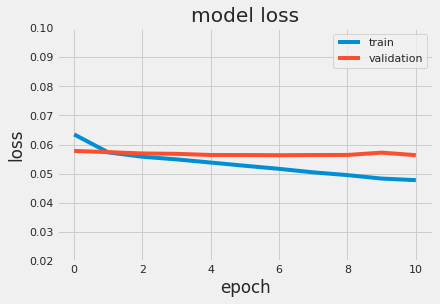

In [0]:
plt.plot(class_history['loss'])
plt.plot(class_history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.ylim(0.02,0.1);

___
###### Result on Test
___

In [0]:
fittedClassifier = load_model('classifier.h5')
testProb = fittedClassifier.predict(X_test)

testProb = testProb[:,0]
class_prob_df = pd.DataFrame({'probabilities': testProb,
                        'true_class': y_test})

class_prob_df

,probabilities,true_class
53993,0.0,0
12084,0.1,0
30032,0.0,0
26541,0.0,0
87066,0.0,0
...,...,...
42281,0.0,0
28600,0.0,0
2470,0.0,0
61009,0.4,1


In [0]:
class_prob_df[class_prob_df['true_class']==1].shape
class_prob_df.probabilities.describe()

count   22929.0
mean    0.1    
std     0.1    
min     0.0    
25%     0.0    
50%     0.0    
75%     0.1    
max     1.0    
Name: probabilities, dtype: float64

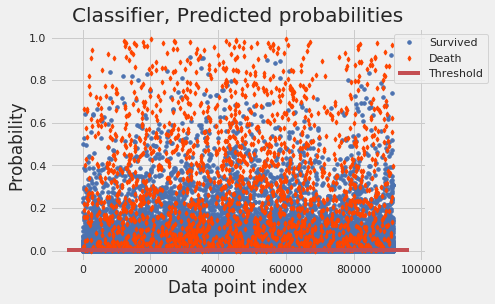

In [0]:
class_threshold = 0.001
groups = class_prob_df.groupby('true_class')
fig, ax = plt.subplots()

for name, group in groups:
    if name == 1:
        MarkerSize = 3.5
        Color = 'orangered'
        Label = 'Death'
        Marker = 'd'
    else:
        MarkerSize = 3.5
        Color = 'b'
        Label = 'Survived'
        Marker = 'o'
    ax.plot(group.index, group.probabilities, 
            linestyle='',
            color=Color,
            label=Label,
            ms=MarkerSize,
            marker=Marker)
ax.hlines(class_threshold, ax.get_xlim()[0], ax.get_xlim()[1], colors="r", zorder=100, label='Threshold')
ax.legend(bbox_to_anchor=(0.9, 1))
plt.title("Classifier, Predicted probabilities")
plt.ylabel("Probability")
plt.xlabel("Data point index")
plt.show();

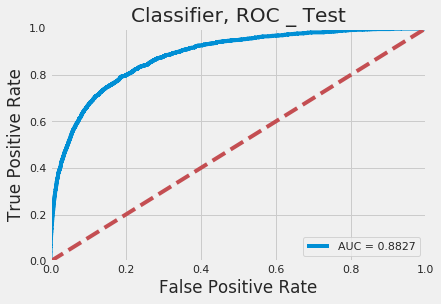

In [0]:
from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
roc_auc = auc(fpr, tpr)

plt.title('Classifier, ROC _ Test')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

__Threshold: based on quantile: 90%__

In [0]:
threshold = class_prob_df.probabilities.quantile(q=0.90)
threshold

0.21162331104278567

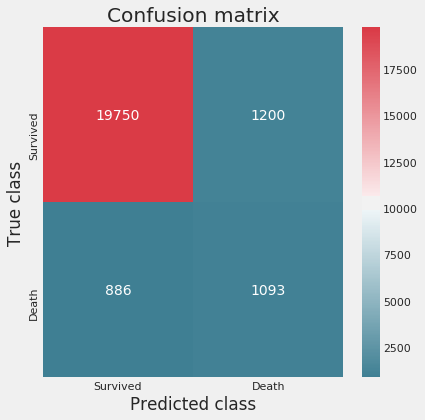

AUC score_Test: 0.8826598858419129
Brier_Score_Test:  0.05638641396451907
Accuracy Score_Test: 0.909
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     20950
           1       0.48      0.55      0.51      1979

    accuracy                           0.91     22929
   macro avg       0.72      0.75      0.73     22929
weighted avg       0.92      0.91      0.91     22929



In [0]:
# threshold = 0.5
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Test:",auc(fpr, tpr))
print('Brier_Score_Test: ',brier_score_loss(y_test,class_prob_df.probabilities))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred))

__Threshold: 0.5__

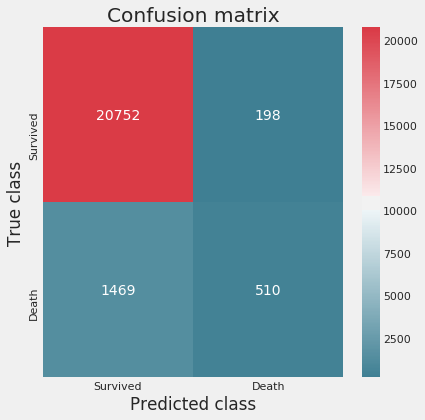

AUC score_Test: 0.8826598858419129
Brier_Score_Test:  0.05638641396451907
Accuracy Score_Test: 0.927
Classification Report_Test:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     20950
           1       0.72      0.26      0.38      1979

    accuracy                           0.93     22929
   macro avg       0.83      0.62      0.67     22929
weighted avg       0.92      0.93      0.91     22929



In [0]:
threshold = 0.5
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df.true_class, class_prob_df.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Test:",auc(fpr, tpr))
print('Brier_Score_Test: ',brier_score_loss(y_test,class_prob_df.probabilities))
print("Accuracy Score_Test:", round(metrics.accuracy_score(y_test, y_pred),3))
print("Classification Report_Test:\n",metrics.classification_report(y_test,y_pred))

____
###### Result on Train
___

In [0]:
fittedClassifier_train = load_model('classifier.h5')
testProb_train = fittedClassifier_train.predict(X_train)

testProb_train = testProb_train[:,0]
class_prob_df_train = pd.DataFrame({'probabilities': testProb_train,
                        'true_class': y_train})

class_prob_df_train

,probabilities,true_class
76096,0.0,0
1524,0.0,0
40194,0.0,0
84619,0.0,0
86775,1.0,1
...,...,...
73587,0.0,0
48650,0.9,1
5385,0.0,0
68076,0.0,0


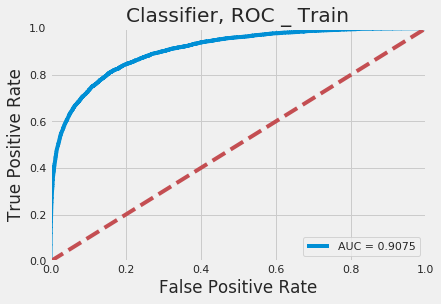

In [0]:
from sklearn.metrics import (confusion_matrix, auc, roc_curve, cohen_kappa_score, accuracy_score)
fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
roc_auc = auc(fpr, tpr)

plt.title('Classifier, ROC _ Train')
plt.plot(fpr, tpr, label='AUC = %0.4f'% roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1],[0,1],'r--')
plt.xlim([-0.001, 1])
plt.ylim([0, 1.001])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

__Threshold: based on quantile__

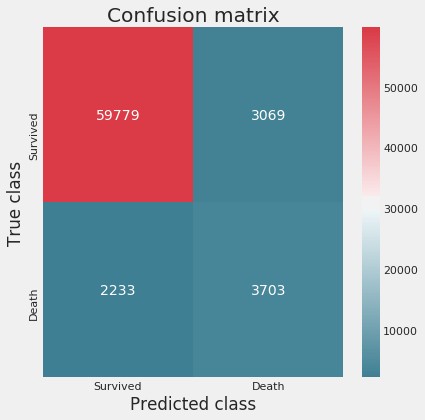

AUC score_Train: 0.9074769299097879
Brier_Score_Train:  0.04912551873613042
Accuracy Score_Train: 0.923
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96     62848
           1       0.55      0.62      0.58      5936

    accuracy                           0.92     68784
   macro avg       0.76      0.79      0.77     68784
weighted avg       0.93      0.92      0.93     68784



In [0]:
threshold = class_prob_df.probabilities.quantile(q=0.90)
threshold

LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df_train.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df_train.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Train:",auc(fpr, tpr))
print('Brier_Score_Train: ',brier_score_loss(y_train,class_prob_df_train.probabilities))
print("Accuracy Score_Train:", round(metrics.accuracy_score(y_train, y_pred),3))
print("Classification Report_Train:\n",metrics.classification_report(y_train,y_pred))


__Threshold: 0.5__

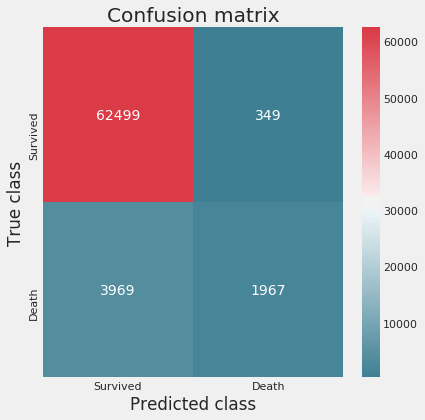

AUC score_Train: 0.9074769299097879
Brier_Score_Train:  0.04912551873613042
Accuracy Score_Train: 0.937
Classification Report_Train:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97     62848
           1       0.85      0.33      0.48      5936

    accuracy                           0.94     68784
   macro avg       0.89      0.66      0.72     68784
weighted avg       0.93      0.94      0.92     68784



In [0]:
threshold = 0.5
LABELS = ['Survived', 'Death']
y_pred = [1 if e > threshold else 0 for e in class_prob_df_train.probabilities.values]
conf_matrix = confusion_matrix(class_prob_df_train.true_class, y_pred)

plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, cmap=sns.diverging_palette(220, 10, as_cmap=True),xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
plt.title("Confusion matrix")
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

fpr, tpr, thresholds = roc_curve(class_prob_df_train.true_class, class_prob_df_train.probabilities)
# print("ROC_AUC score_Test:",roc_auc_score(class_prob_df.true_class, class_prob_df.probabilities))
print("AUC score_Train:",auc(fpr, tpr))
print('Brier_Score_Train: ',brier_score_loss(y_train,class_prob_df_train.probabilities))
print("Accuracy Score_Train:", round(metrics.accuracy_score(y_train, y_pred),3))
print("Classification Report_Train:\n",metrics.classification_report(y_train,y_pred))